# <center> Prediction of doctors prescribing dicisions</center><p><p><p><p>
### <center>*2020*</center>


## <center>*Contents:* </center><a class="anchor" id="contents"></a>

## 0. [Introduction](#intro)

## 1.1. [Library import, references and data loading](#import)
## 1.2. [Preprocessing](#preprocessing)

## 2. [Fast analysis](#fanalysis)

## 3. [Deep analysis, feature engineering & selection](#da)

## 4.1. [Prediction preparing](#pred)

## 4.2. [Quality metrics](#quality-metrics)

## 5. [Basic Models](#basic_models)

#### 5.1. [ Logistic regression](#Log)
#### 5.2. [SVC](#SVC)
#### 5.3. [kNN (K-Nearest Neighbors)](#kNN)
#### 5.4. [Artificial Neural Network (ANN)](#ANN)
#### 5.5. [DicisionTreeClassifier](#dtc)
#### 5.6. [Estimators quality](#agg_m)


## 6. [Ensemble and hybrid methods](#ensembles)

#### 6.1. [Bagging ](#bagging)
#### 6.2. [RandomForestClassifier](#rfc)
#### 6.3. [Boosting ](#boosting)
#### 6.3.1. [AdaBoost ](#boosting)
#### 6.3.2. [XGBoosting ](#xgb)
#### 6.4. [Ensembles quality](#q2)


## 7. [Custom ensemble based on stacking](#ce)
#### 7.1 [Blending idea](#blending)
#### 7.2 [Create custom ensemble](#stack)

# 0. Introduction <a class="anchor" id="intro"></a>

    Medical facilities are dealing with a lot of patients and with the implementation of E-prescriptions, they can store and analyze their data easier. There is a lot of patients and doctors which means a lot of data. U.S. Centers for Medicare and Medicaid Services (CMS) released a dataset of 239,930 doctors from different regions, specialties, and their prescribing history. The dataset provides information on prescription drugs prescribed by individual physicians and other health care providers. And what do do with that data? With the help of machine learning, we can identify some patterns/connections between data that are hidden in the dataset. This was also the reason for releasing the CMS dataset to the public.

    There were a lot of articles written on a similar topic. As an example, we consider mining electronic health record data (EHR) with doctor’s medicine prescription. Here researchers use multi-task neural network approach to learn pattern of multiple correlated antidiabetic agents in blood glucose control and antihypertensive drugs in blood pressure control scenarios. The result demonstrated that for single drug prescription, multi-task learning achieves 0.02 to 0.06. increases in AUC compared with logistic regression. In prescription pattern prediction, they achieved an accuracy increase of 0.05 in antidiabetic agent prediction, showing the efficacy of multi-task learning approach in learning doctor prescription patterns.[13] Second example of data analyzing it’s prediction whether the patient will have a myocardial infarction. Researchers had to learn statistical model to indicate which patients on Cox-2 inhibitors, such as VioxxTM and CelebrexTM, are at substantial risk for heart attack. Here were tried many different types of algorithms, and chose the best four methods – Naïve Bayes, TAN(Transductive Adversarial Networks), Boosted Rules and SAYU-TAN (Score As You Use). They scored each candidate feature using area-under the ROC curve. All methods do good on this task. However, in table of average AUC-ROC SAYU dominates the proposition learners for false positive rates less than 0.75. Researchers found that using techniques from statistical relation model lead to improvements over both standard propositional learning techniques as well as relational learning techniques.[11] One more example investigation is prediction of medication non-adherence referring on French Health System’s reimbursement data. Here we consider different models of patient drug consumption in breast cancer treatments. Data is a sequence of events (hospitalizations and pharmacy transactions) with timestamps and a set of characteristics about the patient. Researchers compare the ability of four supervised learning algorithms -logistic regression, decision tree, gradient boosting, multilayer perceptron. Gradient boosting, compared to the two previous models, is harder to interpret. However, it focuses on weak learners and can offer a better prediction. AUCs are roughly 0.70 with Gradient Boosting having the best performances. A Cumulative Accuracy Profit curve (CAP or Lorenz curve) gives the second and third measures, indicating the ability of a model to accurately spot a patient at-risk. Gradient boosting and MLP have the best results but these "black box methods" are difficult to explain which might refrain their usages.[12]

    Based on the sidns from database with the help of machine learning techniques, I will determine which gender doctor belongs to. For implementation I used a programming language called Python. It offers a variety of different libraries which make machine learning and data analysis easier. I used a library called Pandas [6] for preprocessing, Seaborn [9] for plotting the graphs and Sklearn [10] for machine learning computation.

# 1.1. Lib import, references and data loading <a class="anchor" id="import"></a>
[back to contents](#contents) | [next>](#preprocessing)

### In this table of contents the various libraries are imported for further work with the database and readed json file:

In [1]:
import json
import pandas as pd
import re
import matplotlib.pyplot as plt
from matplotlib import *
import seaborn as sns
import numpy as np
import statistics
from math import *
import random

from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from sklearn.utils import shuffle

%matplotlib inline
from IPython.display import display, HTML, Image, Math


import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.filterwarnings(action='ignore', category=UserWarning)

Read original file line by line, and save it to the `data` list:

In [3]:
data = []
for line in open('roam_prescription_based_prediction', 'r'):
    data.append(json.loads(line))     

After convertation dictionary with method `json_normalize`we get pandas.DataFrame (common table format) save it as `data`:

In [2]:
data = pd.io.json.json_normalize(data)
data.head(2)

General table information:

In [ ]:
data.info()

# 1.2. Preprocessing <a class="anchor" id="preprocessing"></a>
[<prev](#import) | [back to contents](#contents) | [next>](#fanalysis)

### As our data file contains 4.3 Gb, we need to compress the table so that we can work further. Here we will also do some data pre-processing, which in the future will allow us to work with this data.

Firstly set the row indexes of the table `npi` - the number of the doctor:

In [ ]:
data = data.set_index('npi')

Fill the empty `NaN` values with zeros

In [ ]:
data = data.fillna(0)

Transform the table structure, move to the beginning the last 7 columns (`cols [: - 7]`) and reduce the headers with the `new_cols` variable.

In [ ]:
cols = data.columns.tolist()
cols = cols[-7:] + cols[:-7]
df = data[cols].copy()

Assign the header table to `new_cols` which, using the` for n in cols: `loop, and the regular expression` re.sub (...) `, reduce the headings to the original ones, removing the prefixes that formed after normalization.

In [ ]:
new_cols = []
for n in cols:
    if n.count('provider_variables.') == 1:
        n = re.sub('provider_variables.', '', n)
    if n.count('cms_prescription_counts.') == 1:
        n = re.sub('cms_prescription_counts.', '', n)
    new_cols.append(n)

In [ ]:
df.columns = new_cols
df.head(2)

Optimize the data on prescribed medications so that the table takes up less space.

In [ ]:
float_df_1 = df[new_cols[7:1200]]
converted_int_1 = float_df_1.apply(pd.to_numeric,downcast='signed')
del float_df_1

In [ ]:
float_df_2 = df[new_cols[1200:]]
converted_int_2 = float_df_2.apply(pd.to_numeric,downcast='signed')
del float_df_2

Let's create the table `drugs` which will contain the database of prescribed recipes.

In [ ]:
drugs = pd.concat([converted_int_1,converted_int_2],axis=1)

# save
# drugs.to_csv('drugs_df.csv')

In [ ]:
drugs.info()

Create a column to calculate the number of different drugs prescribed by doctors in the table `drugs`. To do this, use the construction with the unnamed function `lambda`.

In [ ]:
# read
# drugs = pd.read_csv('drugs_df.csv')
# drugs = drugs.set_index('npi')

# создаю столбец   из общего кол-ва (2397)   вычитаю все столбцы с 0
drugs['drugs_variety'] = 2397 - drugs.apply(lambda x: x.isin([0]).sum(), axis='columns')

Medical preparations arn't needed for gender research.  Create the table `main_df` in which the first part of the table will be located without drugs, but add feature `drugs_variety`.

In [ ]:
# main_df = df[new_cols[:7]].copy()
# main_df['drugs_variety']=drugs.drugs_variety.values

#### We have to convert target categorical string data `gender` into `main_df` to numerical equivalents using the` get_dummies` method.

Transform it to the column `male` where **`1 = yes` and `0 = no`**.

In [ ]:
male = pd.get_dummies(main_df['gender'])
male = male.rename(columns={"M": "male"})

Combine 2 tables into one (`pd.concat()`) and delete the extra columns (`main_df.drop()`).

In [ ]:
main_df = pd.concat([main_df, male], axis = 1)
main_df = main_df.drop(['F', 'gender'], axis=1)

In [392]:
# # save
# main_df.to_csv('main_df.csv')


# read
# main_df = pd.read_csv('main_df.csv')  
# main_df = main_df.set_index('npi')


main_df.head(2)

,brand_name_rx_count,generic_rx_count,region,settlement_type,specialty,years_practicing,drugs_variety,male
npi,,,,,,,,
1295763035,384,2287,South,non-urban,Nephrology,7,68,1
1992715205,0,103,South,non-urban,General Practice,7,3,1


# 2. Fast analysis <a class="anchor" id="fanalysis"></a>
[<prev](#preprocessing) | [back to contents](#contents) | [next>](#da)

### Statistical data processing and visualization of analysis results is an inevitable step in working with data obtained in various fields. The use of visualization tools (graphs) makes the analysis results as accessible and understandable as possible.


Using the `.info ()` and `.describe ()` functions, we display general table information. Use `.describe (include = 'all')` function to find out the number of unique and most popular values for `object`-type values.

In [393]:
print(main_df.info())
main_df.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 239930 entries, 1295763035 to 1144252818
Data columns (total 8 columns):
brand_name_rx_count    239930 non-null int64
generic_rx_count       239930 non-null int64
region                 239930 non-null object
settlement_type        239930 non-null object
specialty              239930 non-null object
years_practicing       239930 non-null int64
drugs_variety          239930 non-null int64
male                   239930 non-null int64
dtypes: int64(5), object(3)
memory usage: 16.5+ MB
None


,brand_name_rx_count,generic_rx_count,region,settlement_type,specialty,years_practicing,drugs_variety,male
count,239930.000000,239930.000000,239930,239930,239930,239930.000000,239930.000000,239930.000000
unique,NaN,NaN,4,2,282,NaN,NaN,NaN
top,NaN,NaN,South,non-urban,General Practice,NaN,NaN,NaN
freq,NaN,NaN,80562,152270,47836,NaN,NaN,NaN
mean,176.264144,795.547047,NaN,NaN,NaN,6.241875,20.121202,0.623753
std,475.159281,1809.618284,NaN,NaN,NaN,1.649269,29.794904,0.484444
min,0.000000,0.000000,NaN,NaN,NaN,1.000000,1.000000,0.000000
25%,0.000000,36.000000,NaN,NaN,NaN,6.000000,2.000000,0.000000
50%,15.000000,145.000000,NaN,NaN,NaN,7.000000,7.000000,1.000000
75%,154.000000,750.000000,NaN,NaN,NaN,7.000000,27.000000,1.000000


*count* 
**- number of values excluding NaN (computed for all colmns). In our case, each variable have 239,930 values.**

 *unique* 
**count of unique index of values excluding NaN (computed only for categorical features).**

*top*
**shows the most commonly occuring value among all values in colmn (computed only for categorical features).**

*freq* 
**- occurance of most commonly occuring value among all values in a column (or series). Computed only for categorical (non numeric) type of columns (or series).**

*mean* 
**- average of all numeric values**

*std* 
**- Standart Deviation of all numeric values.**

*min* 
**- minimum value of all nmeric features.**

*25%, 50% - median, 75%* 
**- given percentile values (quantile 1, 2 and 3 respectively) of all numeric values in a column (or series).**

*max* 
**- maximum value of all numeric features.**

#### We can see:

* mean value `brand_name_rx_count` and `generic_rx_count` 176 and 795 respectively;

* **quartile:**
* `25%` the smallest values of column `generic_rx_count` have median score 36;
* similarly, `75% of the values of the column` brand_name_rx_count` have a score of 175 or lower;
* `25%` of the `years_practicing` column values have a score of 6 or less, and mean of 6.24;

* 62% - male;
* 36% percent practice outside the city;

* there are 4 options for the `region` column
* there are 282 `specialty`, most often (47,836 times) occurs` General Practice`

#### Let's graphically show the percentage of doctors by gender. In our database, the number of male doctors exceeds the number of female doctors.

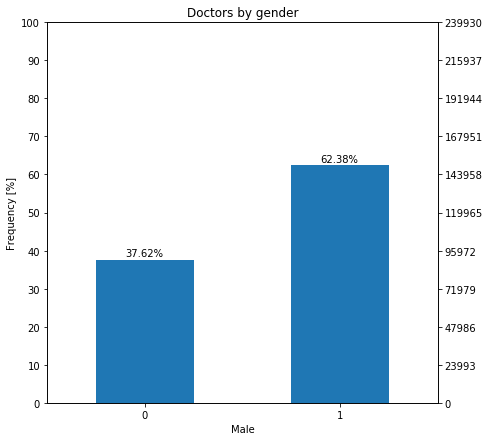

In [394]:
# Percent doctors by gender
plt.figure(figsize=(7,7))
plt.title('Doctors by gender')
plt.xlabel('Male')
plt.ylabel('Frequency [%]')

ax = (main_df.male.value_counts()/len(main_df)*100).sort_index().plot(kind="bar", rot=0)
ax.set_yticks(np.arange(0, 110, 10))

ax2 = ax.twinx()
ax2.set_yticks(np.arange(0, 110, 10)*len(main_df)/100)

for p in ax.patches:
    ax.annotate('{:.2f}%'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+1))
    
plt.savefig('doctors_by_gender.tiff', transparent=False, dpi=300, bbox_inches="tight")

#### Let's look at the distribution of quantitative traits. The chart below shows the distribution of practicing years for doctors. From this distribution we can see that in our database most of doctors who practice from 6 to 8 years (most 7 years).

Text(0, 0.5, 'frequency')

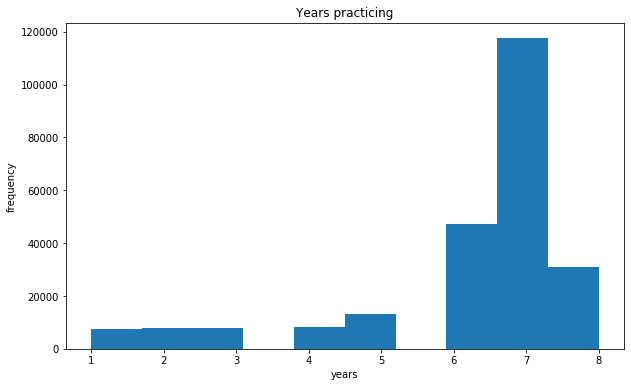

In [395]:
plt.figure(figsize=(10,6))
fig = plt.hist(main_df.years_practicing)
plt.title('Years practicing')
plt.xlabel("years")
plt.ylabel("frequency")

# save
# plt.savefig('years_practicing_hist.tiff', transparent=False, dpi=300, bbox_inches="tight")

**A boxplot is a graph that gives us a good indication of how the values in the data are spread out. It's a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). Distance between 1st and 3d quartiles is Interqartile range and it includes 50% of all observations.**

In our case, boxplot presents years practicing by gender and region. The whiskers that comes out of the box is the "minimum" and "maximum". In our cases, min is 1 or 2 for different regions, and max is 8 for all regions. The line inside of box is median - middle value of dataset. First quartile - the middle number between the smallest number (not the “minimum”) and the median of the dataset. Third quartile - the middle value between the median and the highest value (not the “maximum”) of the dataset. The whiskers show "min" and "max" only if they don't go beyond 1,5 the quartile distance (1,5*IQR). Also bloxplot has outliers - black points. These are observations that go beyond 1,5*IQR.

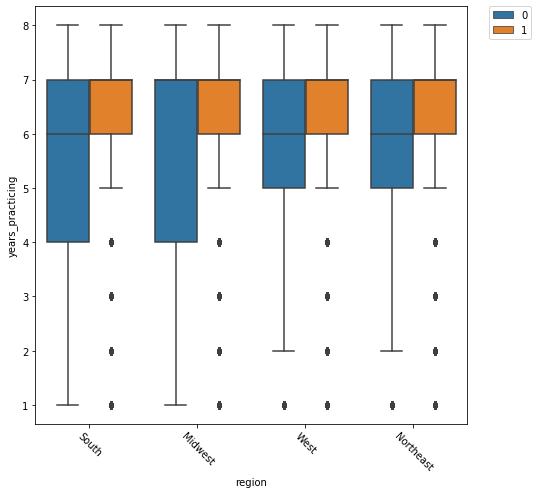

In [396]:
#Years practicing by region&gender
plt.figure(figsize=(15,10))
sns.boxplot(data=main_df,
            y='years_practicing',
            x='region',
            hue='male') 
plt.xticks(rotation=-45) 
plt.gcf().subplots_adjust(left=0.50, bottom = 0.30)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

# save
# plt.savefig('years_practicing_by_region_gender.tiff', format='tiff', dpi=300)

Plotting scatter for unbroken variables:

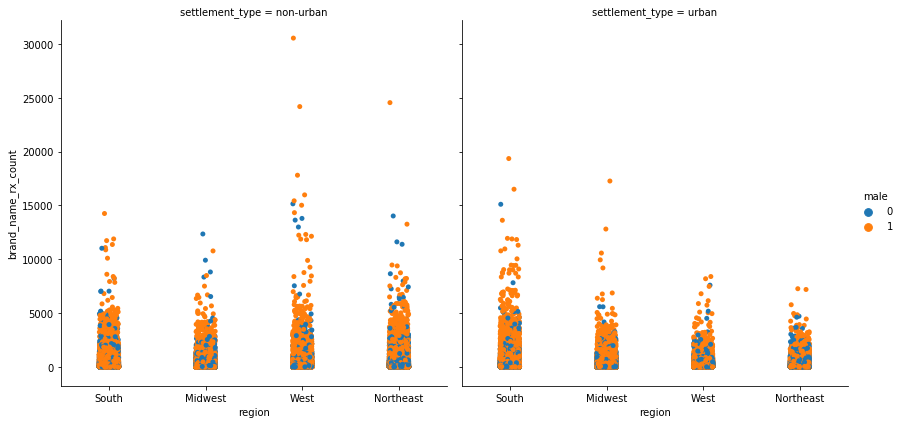

In [397]:
sns.catplot(x="region", y="brand_name_rx_count",
            hue="male", col="settlement_type",
            data=main_df, kind="strip",
            height=6, aspect=1)

# plt.savefig('brand_name_rx_count_fast.tiff', format='tiff', transparent=False, dpi=300, bbox_inches="tight")

Neraly 50% of doc's not wrote out original medications.

In [398]:
len(main_df[main_df['brand_name_rx_count'] == 0])

104818

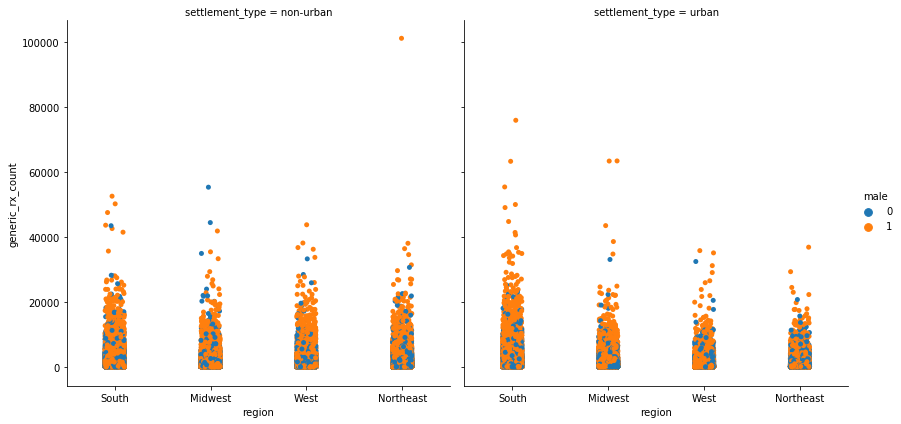

In [85]:
sns.catplot(x="region", y="generic_rx_count",
            hue="male", col="settlement_type",
            data=main_df, kind="strip",
            height=6, aspect=1)

# plt.savefig('generic_rx_count_fast.tiff', format='tiff', transparent=False, dpi=300, bbox_inches="tight")

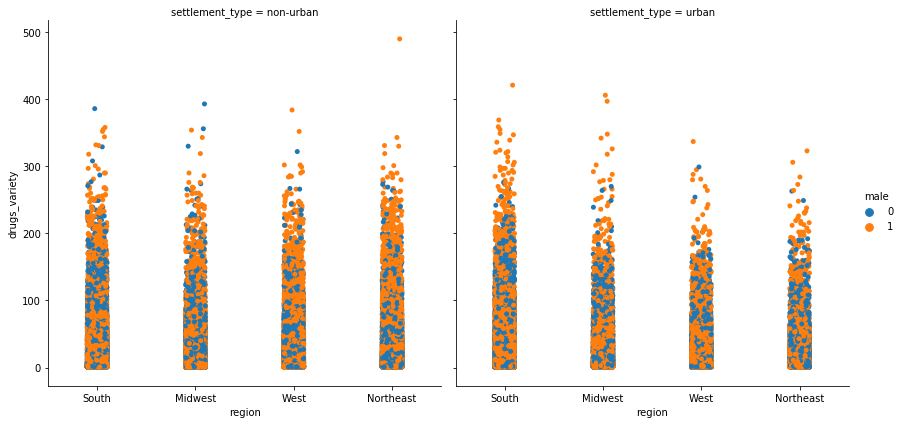

In [86]:
sns.catplot(x="region", y="drugs_variety",
            hue="male", col="settlement_type",
            data=main_df, kind="strip",
            height=6, aspect=1)

# plt.savefig('drugs_variety_fast.tiff', format='tiff', transparent=False, dpi=300, bbox_inches="tight")

# 3. Deep analysis, feature engineering & selection<a class="anchor" id="da"></a>

[<prev](#fanalysis) | [back to contents](#contents) | [next>](##pred)

In [2]:
# # read
# main_df = pd.read_csv('main_df.csv')  
# main_df = main_df.set_index('npi')

In [3]:
work_df = main_df.copy()
work_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 239930 entries, 1295763035 to 1144252818
Data columns (total 8 columns):
brand_name_rx_count    239930 non-null int64
generic_rx_count       239930 non-null int64
region                 239930 non-null object
settlement_type        239930 non-null object
specialty              239930 non-null object
years_practicing       239930 non-null int64
drugs_variety          239930 non-null int64
male                   239930 non-null int64
dtypes: int64(5), object(3)
memory usage: 16.5+ MB


### Let's study the distribution of doctors' specialties in our table.

<a class="anchor" id="here"></a>

We transform the column `specialty` into numerical values, for this, first copy the` main_df` to `work_df`. After I translate the string values into numeric (original specialty save to `specialty_dict`):

In [4]:
specialty_dict = dict(enumerate(work_df['specialty'].astype('category').cat.categories))
work_df['specialty']  = work_df['specialty'].astype('category')
work_df['specialty'] = work_df['specialty'].cat.codes

#### There are peaks on the chart. Distplot showa distribution of observations.

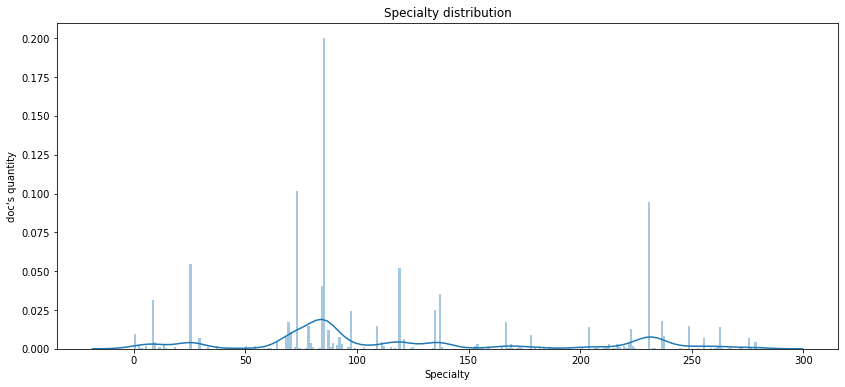

In [5]:
plt.figure(figsize=(14,6))
fig = sns.distplot(work_df['specialty'], bins=282 )
plt.title('Specialty distribution')
plt.xlabel("Specialty")
plt.ylabel("doc's quantity")

# plt.savefig('specialty_distribution.tiff', transparent=False, dpi=300, bbox_inches="tight")

#### Zoom the distplot to see the specialization number. Specializations number 73 and 85 have the biggest value.

(70, 90)

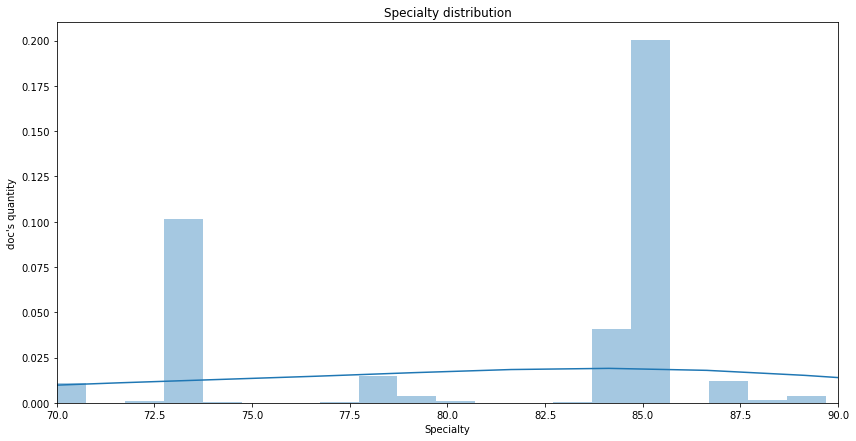

In [101]:
# если нужно увеличить и посмотреть номер специальности, пользуюсь xlim
plt.figure(figsize=(14,7))
fig = sns.distplot(work_df['specialty'], bins=282)
plt.title('Specialty distribution')
plt.xlabel("Specialty")
plt.ylabel("doc's quantity")
# ------------------
plt.xlim(70,90)

In [102]:
specialty_dict[73], specialty_dict[85]

('Family', 'General Practice')

#### So we have 5 specialties that make up 50% of the sample

In [6]:
print('Summary',
      '{:.2f}%'.format(work_df.specialty.value_counts()[:5].values.sum()/len(main_df)*100),
      ':\n\n',
      main_df.specialty.value_counts()[:5])

Summary 50.07% :

 General Practice          47836
Family                    24230
Psychiatry                22530
Cardiovascular Disease    13091
Medical                   12445
Name: specialty, dtype: int64


### At second encode `region` and `settlement_type` to *8 binary features:*

In [7]:
# concat object-type values
cat_features = ['region', 'settlement_type']
for i, col1 in enumerate(cat_features):
    for j, col2 in enumerate(cat_features[i + 1:]):
        work_df[col1 + '_' + col2] = work_df[col1] + '_' + work_df[col2]
        
# get dummies        
geo = pd.get_dummies(work_df['region_settlement_type'])


# complete work_df
work_df = pd.concat([work_df, geo], axis = 1)
work_df = work_df.drop(['region', 'settlement_type', 'region_settlement_type'], axis=1)

In [8]:
work_df.describe().T

,count,mean,std,min,25%,50%,75%,max
brand_name_rx_count,239930.0,176.264144,475.159281,0.0,0.0,15.0,154.0,30547.0
generic_rx_count,239930.0,795.547047,1809.618284,0.0,36.0,145.0,750.0,101079.0
specialty,239930.0,118.068924,71.909583,0.0,73.0,85.0,167.0,281.0
years_practicing,239930.0,6.241875,1.649269,1.0,6.0,7.0,7.0,8.0
drugs_variety,239930.0,20.121202,29.794904,1.0,2.0,7.0,27.0,490.0
male,239930.0,0.623753,0.484444,0.0,0.0,1.0,1.0,1.0
Midwest_non-urban,239930.0,0.118985,0.323771,0.0,0.0,0.0,0.0,1.0
Midwest_urban,239930.0,0.089730,0.285796,0.0,0.0,0.0,0.0,1.0
Northeast_non-urban,239930.0,0.202968,0.402209,0.0,0.0,0.0,0.0,1.0
Northeast_urban,239930.0,0.042988,0.202829,0.0,0.0,0.0,0.0,1.0


In [111]:
# save
# work_df.to_csv('work_df.csv')

In [162]:
# read
work_df = pd.read_csv('work_df.csv')
work_df = work_df.set_index('npi')
work_df.head(2)

,brand_name_rx_count,generic_rx_count,specialty,years_practicing,drugs_variety,male,Midwest_non-urban,Midwest_urban,Northeast_non-urban,Northeast_urban,South_non-urban,South_urban,West_non-urban,West_urban
npi,,,,,,,,,,,,,,
1295763035,384,2287,135,7,68,1,0,0,0,0,1,0,0,0
1992715205,0,103,85,7,3,1,0,0,0,0,1,0,0,0


### Let's separete specialty by gender proportin:

In [12]:
a = work_df.copy().groupby('specialty')['male'].agg(['sum', 'count'])
a['prop'] = a['sum'] / a['count']
a.describe()

,sum,count,prop
count,282.000000,282.000000,282.000000
mean,530.698582,850.815603,0.600045
std,2707.967749,3762.523437,0.356153
min,0.000000,1.000000,0.000000
25%,1.000000,3.000000,0.293932
50%,9.500000,23.000000,0.694595
75%,118.500000,214.000000,0.900000
max,39286.000000,47836.000000,1.000000


In [13]:
# unisex_spec
print(a[(a['prop'] <= 0.6) & (a['prop'] >= 0.4)].shape)
unisex_spec = a[(a['prop'] <= 0.6) & (a['prop'] >= 0.4)]

(30, 3)


In [14]:
# probably male spec
print(a[(a['prop'] <= 1) & (a['prop'] > 0.6)].shape)
probably_male_spec = a[(a['prop'] <= 1) & (a['prop'] > 0.6)]

(174, 3)


In [15]:
# surely male spec
print(a[(a['prop'] <= 1) & (a['prop'] > 0.7) & (a['count'] > 100)].shape)
surely_male_spec = a[(a['prop'] <= 1) & (a['prop'] > 0.7) & (a['count'] > 100)]

(47, 3)


In [16]:
# probably female spec
print(a[(a['prop'] < 0.4) & (a['prop'] >= 0)].shape)
probably_female_spec = a[(a['prop'] < 0.4) & (a['prop'] >= 0)]

(78, 3)


In [17]:
# surely female spec
print(a[(a['prop'] >= 0) & (a['prop'] < 0.3) & (a['count'] > 100)].shape)
surely_female_spec = a[(a['prop'] >= 0) & (a['prop'] < 0.3) & (a['count'] > 100)]

(12, 3)


In [18]:
# too few samples to call it male specialty, call it unisex_spec

print(a[(a['prop'] > 0.6) & (a['count'] < 30)].shape)
unisex_spec2 =  a[(a['prop'] > 0.6) & (a['count'] < 30)]

(77, 3)


In [19]:
# too few samples to call it female specialty, call it unisex_spec

print(a[(a['prop'] < 0.4) & (a['count'] < 30)].shape)
unisex_spec3 = a[(a['prop'] < 0.4) & (a['count'] < 30)]

(57, 3)


In [20]:
def spec_by_gender(work_df, list_to_replace, val):
    work_df.specialty = work_df.specialty.replace(to_replace = list_to_replace, value =val)

In [21]:
spec_by_gender(work_df, list(surely_male_spec.index), 'surely_male_spec')
spec_by_gender(work_df, list(probably_male_spec.index), 'probably_male_spec')
spec_by_gender(work_df, list(surely_female_spec.index), 'surely_female_spec')
spec_by_gender(work_df, list(probably_female_spec.index), 'probably_female_spec')
spec_by_gender(work_df, list(unisex_spec.index), 'unisex_spec')
spec_by_gender(work_df, list(unisex_spec2.index), 'unisex_spec')
spec_by_gender(work_df, list(unisex_spec3.index), 'unisex_spec')

Count specialty:

In [48]:
work_df['specialty'].value_counts()

surely_male_spec        132259
surely_female_spec       41522
probably_male_spec       36944
unisex_spec              16060
probably_female_spec     13145
Name: specialty, dtype: int64

In [71]:
# function to view specialty name
def check_spec(spec_cat):
    for _ in list(spec_cat.index): 
        return spec_cat.rename(lambda _: specialty_dict[_])
    
# run function for `surely_female_spec`
check_spec(surely_female_spec)

# # run function for `surely_male_spec`
# check_spec(surely_male_spec)

,sum,count,prop
specialty,,,
Acute Care,272,2270,0.119824
Adult Health,506,7444,0.067974
Community Health,22,120,0.183333
Family,2201,24230,0.090838
Family Health,14,139,0.100719
Gerontology,43,928,0.046336
Obstetrics & Gynecology,0,693,0.000000
Pediatrics,28,328,0.085366
Primary Care,108,716,0.150838


Binary specialty category:

In [359]:
spec = pd.get_dummies(work_df['specialty'])
work_df = pd.concat([work_df, spec], axis = 1)
work_df = work_df.drop(['specialty'], axis=1)

### Now we have 17 features:

* 3 unbroken describing prescripted medication;
* `years_practicing` - from 1 till 8;
* 5 binary describing doc's specailty;
* 8 binary describing doc's locations.

In [360]:
work_df = work_df[['male'] + [ col for col in work_df.columns if col != 'male' ]]
cols = list(work_df.columns)
# cols = work_df.columns.tolist()
cols = cols[:5] + cols[-5:] + cols[5:-5]
work_df = work_df[cols]
work_df.head(2)

,male,brand_name_rx_count,generic_rx_count,years_practicing,drugs_variety,probably_female_spec,probably_male_spec,surely_female_spec,surely_male_spec,unisex_spec,Midwest_non-urban,Midwest_urban,Northeast_non-urban,Northeast_urban,South_non-urban,South_urban,West_non-urban,West_urban
npi,,,,,,,,,,,,,,,,,,
1295763035,1,384,2287,7,68,0,0,0,1,0,0,0,0,0,1,0,0,0
1992715205,1,0,103,7,3,0,0,0,1,0,0,0,0,0,1,0,0,0


### Let's find correlation between attributes to choose important for model features. For this we will use method .corr() to calculate correlation coefficient.

**For male/female:**

We see **strong correlation** (when value ~1.0) brand_name_rx_count with generic_rx_count and drugs_variety.

**Weak/no correlation** (when the value is practically zero) in other cases.

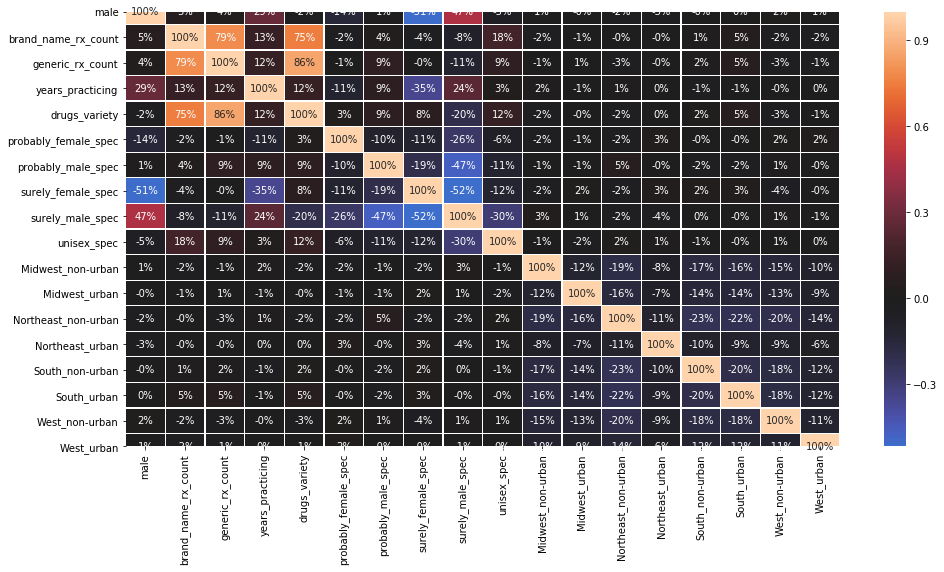

In [361]:
plt.figure(figsize=(16,8))
ax = sns.heatmap(work_df.corr(), center=0, fmt='.0%', linewidths=0.2, annot=True)

# save
# plt.savefig('work_df_corr.tiff', format='tiff', transparent=False, dpi=300, bbox_inches="tight")

### Let's see a correlation between the features in female and male samples separetly:

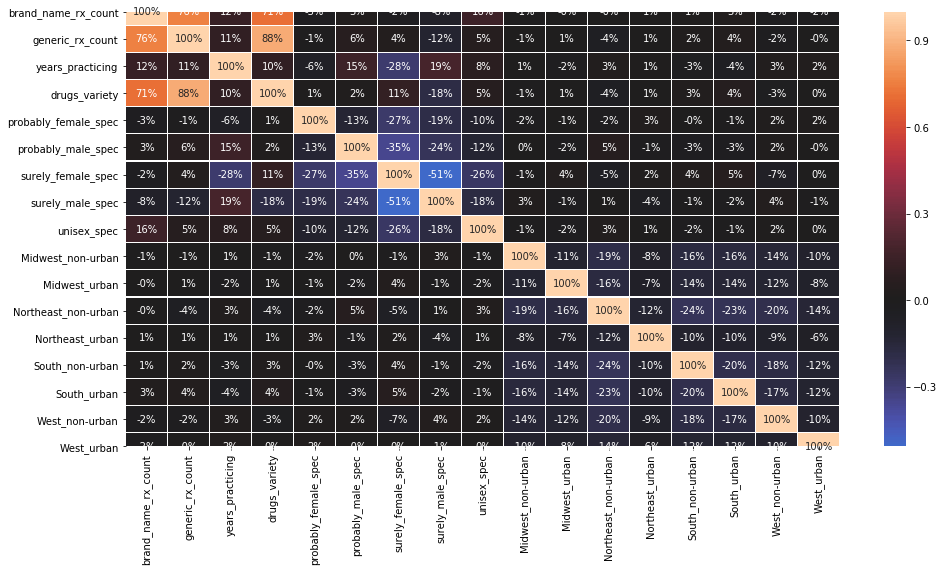

In [362]:
# corr features for female samples

plt.figure(figsize=(16,8))
ax = sns.heatmap(work_df[work_df['male']==0].iloc[:,1:].corr(), center=0, fmt='.0%', linewidths=0.2, annot=True)

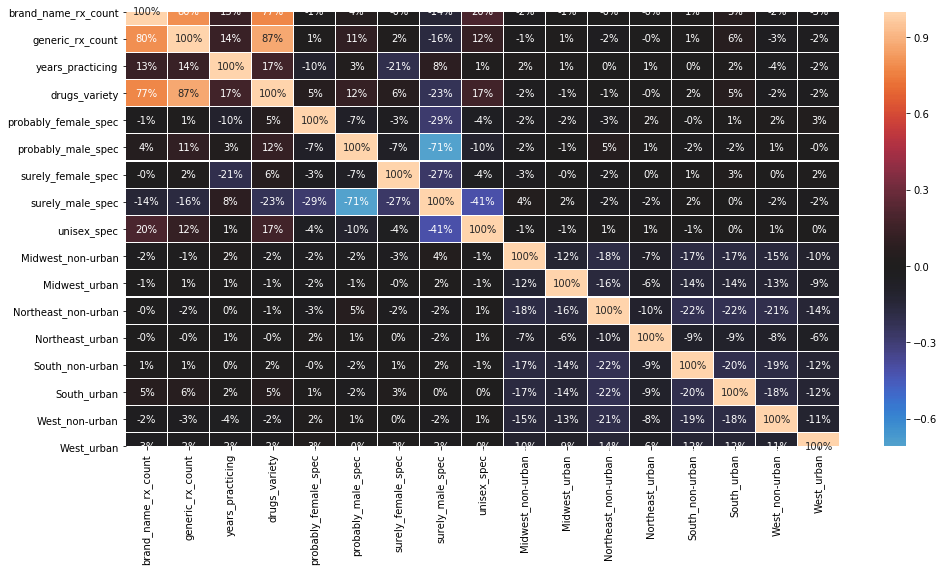

In [363]:
# corr features for male samples

plt.figure(figsize=(16,8))
ax = sns.heatmap(work_df[work_df['male']==1].iloc[:,1:].corr(), center=0, fmt='.0%', linewidths=0.2, annot=True)

### Let's calculate optimal threshold for `years_practicing` value for classifcation:

#### Both class are equal significant:

1 year female doc's proportion: 0.7646822204344328
2 year female doc's proportion: 0.7341952165481577
3 year female doc's proportion: 0.6912239886260825
4 year female doc's proportion: 0.6394283620373763
5 year female doc's proportion: 0.5332180970990531
6 year female doc's proportion: 0.36719677692960134
7 year female doc's proportion: 0.304917474902161
8 year female doc's proportion: 0.26149900996526765


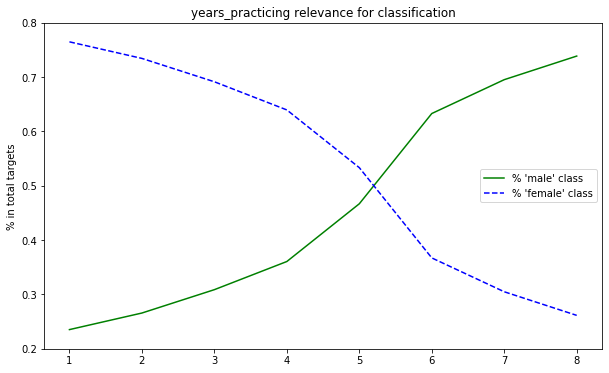

In [235]:
for i in range(1,9):
    print(f"{i} year female doc's proportion:",
          work_df[work_df['years_practicing']==i].male.value_counts()[0] /\
        work_df[work_df['years_practicing']==i]['years_practicing'].count())

def plot_0_vs_1(work_df, name):
    male=[]
    female=[]
    for i in range(1,9):
        f=work_df[work_df['years_practicing']==i].male.value_counts()[0] /\
        work_df[work_df['years_practicing']==i]['years_practicing'].count() 
        
        m=work_df[work_df['years_practicing']==i].male.value_counts()[1] /\
        work_df[work_df['years_practicing']==i]['years_practicing'].count() 
        female.append(f)
        male.append(m)
        

    plt.figure(figsize=(10,6))
    plt.title(f'{name} relevance for classification')
       
    plt.plot ( list(range(1,9)),male, "g-", label="% 'male' class")
    plt.plot ( list(range(1,9)),female, "b--", label="% 'female' class")
    plt.ylabel ("years_practicing")
    plt.ylabel ("% in total targets")
    plt.legend (loc="best")
    plt.ylim (0.2,0.8)
    plt.show()
    
plot_0_vs_1(work_df, 'years_practicing')

In [184]:
def plot_ROC(fpr,tpr, thresholds, name):    
    
    plt.figure(figsize=(10,6))
    plt.title(f'Threshold line for {name} feature if predictions is positive class')
      
    plt.plot(fpr, tpr, color='darkorange', label='ROC AUC = %0.2f)' % auc(fpr, tpr))
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="best")

    # create the axis of thresholds (scores)
    ax2 = plt.gca().twinx()
    ax2.plot(fpr, thresholds, markeredgecolor='r',linestyle='dashed', color='r')
    ax2.set_ylabel('Threshold',color='r')
    ax2.set_ylim([thresholds[-1],thresholds[0]])
    ax2.set_xlim([fpr[0],fpr[-1]])
    plt.savefig(f'{name}_threshold_value.tiff', transparent=False, dpi=300, bbox_inches="tight")
    plt.show()

In [185]:
work_df.male.value_counts()

1    149657
0     90273
Name: male, dtype: int64

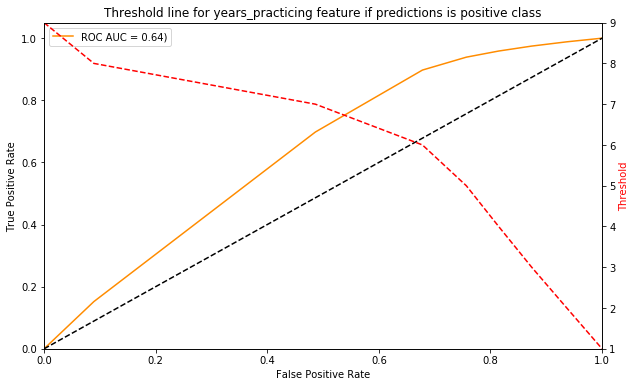

In [186]:
fpr,tpr,thresholds = roc_curve(work_df.male, work_df.years_practicing)    
plot_ROC(fpr,tpr,thresholds, 'years_practicing')

In [187]:
#Confusion matrix
cf_m_df  = work_df.copy()
cf_m_df.loc[cf_m_df['years_practicing'] >= 6, 'years_binary'] = 1
cf_m_df.loc[cf_m_df['years_practicing'] < 6, 'years_binary'] = 0

confusion_matrix_yp = pd.crosstab(cf_m_df['years_binary'], cf_m_df['male'], rownames=['True'], colnames=['Predicted'])
confusion_matrix_yp = confusion_matrix_yp.applymap(lambda x: f"{x} ({x / confusion_matrix_yp.values.sum():.2f}%)")
confusion_matrix_yp

Predicted,0,1
True,,
0.0,29060 (0.12%),15363 (0.06%)
1.0,61213 (0.26%),134294 (0.56%)


### If `male` is most important class:

In [369]:
opt_trs_yp = np.argmin(np.sqrt(np.square(1-tpr) + np.square(fpr)))
print("Optimal threshold:" , opt_trs_yp)

#Confusion matrix
cf_m_df  = work_df.copy()
cf_m_df.loc[cf_m_df['years_practicing'] >= opt_trs_yp, 'years_binary'] = 1
cf_m_df.loc[cf_m_df['years_practicing'] < opt_trs_yp, 'years_binary'] = 0

confusion_matrix_yp = pd.crosstab(cf_m_df['years_binary'], cf_m_df['male'], rownames=['True'], colnames=['Predicted'])
confusion_matrix_yp = confusion_matrix_yp.applymap(lambda x: f"{x} ({x / confusion_matrix_yp.values.sum():.2f}%)")
confusion_matrix_yp

Optimal threshold: 2


Predicted,0,1
True,,
0.0,5703 (0.02%),1755 (0.01%)
1.0,84570 (0.35%),147902 (0.62%)


### If `female` is most important class:

In [190]:
opt_trs_yp = np.argmin(np.sqrt(np.square(1-tpr) + np.square(fpr)))
print("Optimal threshold:" , opt_trs_yp)

#Confusion matrix
cf_m_df  = work_df.copy()
cf_m_df.loc[cf_m_df['years_practicing'] >= 2, 'years_binary'] = 0
cf_m_df.loc[cf_m_df['years_practicing'] < 2, 'years_binary'] = 1

confusion_matrix_yp = pd.crosstab(cf_m_df['years_binary'], cf_m_df['male'], rownames=['True'], colnames=['Predicted'])
confusion_matrix_yp = confusion_matrix_yp.applymap(lambda x: f"{x} ({x / confusion_matrix_yp.values.sum():.2f}%)")
confusion_matrix_yp

Optimal threshold: 2


Predicted,0,1
True,,
0.0,84570 (0.35%),147902 (0.62%)
1.0,5703 (0.02%),1755 (0.01%)


### Dropping outliers as last step of dataset optimization:

In [371]:
work_df.shape

(239930, 18)

In [372]:
print(work_df[work_df['brand_name_rx_count'] > 14000]['male'].value_counts())
work_df = work_df.drop(work_df[work_df['brand_name_rx_count'] > 14000].index)

1    12
0     3
Name: male, dtype: int64


In [373]:
print(work_df[work_df['generic_rx_count'] > 25000]['male'].value_counts())
work_df = work_df.drop(work_df[work_df['generic_rx_count'] > 25000].index)

1    82
0    14
Name: male, dtype: int64


In [374]:
print(work_df[work_df['drugs_variety'] > 300]['male'].value_counts())
work_df = work_df.drop(work_df[work_df['drugs_variety'] > 300].index)

1    5
Name: male, dtype: int64


In [375]:
work_df.shape

(239814, 18)

In [376]:
# save
# work_df.to_csv('final_work_df.csv') 

# 4.1. Prediction preparing
<a class="anchor" id="pred"></a>

[<prev](#da) | [back to contents](#contents) | [next>](#quality-metrics)

In [2]:
# read
final_work_df = pd.read_csv('final_work_df.csv')  
final_work_df = final_work_df.set_index('npi')

In [3]:
final_work_df.head(2)

,male,brand_name_rx_count,generic_rx_count,years_practicing,drugs_variety,probably_female_spec,probably_male_spec,surely_female_spec,surely_male_spec,unisex_spec,Midwest_non-urban,Midwest_urban,Northeast_non-urban,Northeast_urban,South_non-urban,South_urban,West_non-urban,West_urban
npi,,,,,,,,,,,,,,,,,,
1295763035,1,384,2287,7,68,0,0,0,1,0,0,0,0,0,1,0,0,0
1992715205,1,0,103,7,3,0,0,0,1,0,0,0,0,0,1,0,0,0


In [4]:
target_names=['female', 'male']

### Get fetures(`X`) and targets(`y`)

In [5]:
work_df = final_work_df.sample(5000, random_state=40).copy()

In [6]:
# признаки
X = work_df.drop(columns=['male']).copy()
# целевые переменные
y = work_df['male'].copy()

In [7]:
# оцениваю баланс классов
y.value_counts()

1    3107
0    1893
Name: male, dtype: int64

In [8]:
# for changing 'positive class'

y0 = y.replace(0,2)
y0 = y0.replace(1,0)
y0 = y0.replace(2,1)
y0.value_counts()

0    3107
1    1893
Name: male, dtype: int64

### Split dataset on train and test (80/20).

Чтобы сохранить баланс представителей класса в выборке, можно передать в `train_test_split` аргумент `stratify`.

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=40)

In [10]:
print(y_train.value_counts(), y_test.value_counts(), sep='\n')

1    2486
0    1514
Name: male, dtype: int64
1    621
0    379
Name: male, dtype: int64


In [11]:
# for changing 'positive class'

y0_train =y_train.replace(0,2)
y0_train =y0_train.replace(1,0)
y0_train =y0_train.replace(2,1)

y0_test =y_test.replace(0,2)
y0_test =y0_test.replace(1,0)
y0_test =y0_test.replace(2,1)

print(y0_train.value_counts(), y0_test.value_counts(), sep='\n\n')

0    2486
1    1514
Name: male, dtype: int64

0    621
1    379
Name: male, dtype: int64


#### Normilize  features with `sklearn` method `StandardScaler`

The idea behind StandardScaler is that it will transform data such that its distribution will have a mean value 0 and standard deviation of 1.
In case of multivariate data, this is done feature-wise (in other words independently for each column of the data).
Given the distribution of the data, each value in the dataset will have the mean value subtracted, and then divided by the standard deviation of the whole dataset (or feature in the multivariate case).

In [12]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaler.fit(X_train.values)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# 4.2. Quality metrics
<a class="anchor" id="quality-metrics"></a>


[<prev](#pred) | [back to contents](#contents) | [next>](#basic_models)

A classifier is only as good as the metric used to evaluate it.  Choosing an appropriate metric is particularly difficult for imbalanced classification problems. 

If we choose the wrong metric to evaluate models, we are likely to choose a poor model, or in the worst case, be misled about the expected performance of your model.


 In the field of machine learning and specifically the problem of statistical classification, a **confusion matrix**, also known as an error matrix. 
 
 A **confusion matrix** is a summary of prediction results on a classification problem. The number of correct and incorrect predictions are summarized with count values and broken down by each class. This is the key to the confusion matrix.
 
It shows the ways in which your classification model is confused when it makes predictions, and gives us insight not only into the errors being made by a classifier but more importantly the types of errors that are being made.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/2/26/Precisionrecall.svg/350px-Precisionrecall.svg.png.png" style="width: 400px"/>

 Unlike **accracy**, **precision** and **recall** do not depend on the correlation of classes and therefore are applicable in conditions of unbalanced samples. Often, in real practice, the task is to find the optimal balance between these two metrics. The most commonly used way to combine precision and recall into an aggregate quality criterion. F-measure - is harmonic mean of the precision and recall, where an **F1 score** reaches its best value at 1 (perfect precision and recall) and worst at 0.

<a href="https://machinelearningmastery.com/tour-of-evaluation-metrics-for-imbalanced-classification/" target="_parent">
Tour of Evaluation Metrics for Imbalanced Classification:</a>

<img src="https://3qeqpr26caki16dnhd19sv6by6v-wpengine.netdna-ssl.com/wp-content/uploads/2019/12/How-to-Choose-a-Metric-for-Imbalanced-Classification-latest.png" style="width: 800px"/>

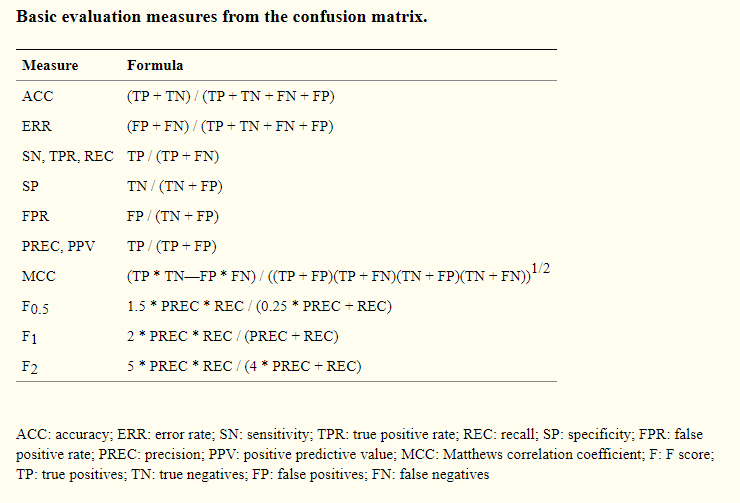

In [13]:
Image(filename='basic_measures_in_conf_matrix.png')

### AUC-ROC и AUC-PR


 **AUC-ROC (or ROC AUC) - the area (Area Under Curve) under the error curve (Receiver Operating Characteristic curve)**. This curve is a line from (0,0) to (1,1) in the coordinates of True Positive Rate (TPR) and False Positive Rate (FPR).
 
We already know **TPR, this is recall**, and **FPR** shows which fraction of the negative class objects the algorithm predicted incorrectly. In the ideal case, when the classifier does not make mistakes (FPR = 0, TPR = 1) we get the area under the curve equal to unity; otherwise, when the classifier accidentally gives class probabilities, AUC-ROC will tend to 0.5, since the classifier will produce the same number of TP and FP.

[ROC Curves for Imbalanced Classification](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/)

### Main function to checking estimators quality:

In [14]:
# create empty pandas DF:
cm_df = pd.DataFrame(columns=['model', 'ths', 'set_size','tn','fp','fn','tp','roc_auc'])

train_preds_df = pd.DataFrame()
test_preds_df = pd.DataFrame()

# create empty dict for models
models_dict = {}

# create function
def plot_report(clf, model_name, X_train, y_train,
                X_test, y_test, img=True, save=False):
    
    '''
    -------------------------------------------------------------------------------------
    get in:
    0. clf - model fitted on train;
    1. model_name - for plotting and saving;
    2. X_train - features values for train;
    3. y_train - train target;
    4. X_test - features values for test;
    5. y_test - test target;
    6. save(default 'True') - local save img;
    7. img(default 'True') - display 3 img.
    -------------------------------------------------------------------------------------
    return:
    1. visualizing roc_auc plot for train and test;
    2. pandas DF with estimators metrics, join estimator metrics with previous.
    -------------------------------------------------------------------------------------
    ''' 

    # compute TRAIN   ############################################################
    y_pred_train = clf.predict_proba(X_train)[:, 1]
    fpr0, tpr0, ths0 = roc_curve(y_train, y_pred_train) # compute fpr, tpr, thresholds and roc_auc for train
    
    roc_auc0 = auc(fpr0, tpr0) # compute area under the curve
    print('Train ROC AUC: {0:.3f}'.format(roc_auc0))
    
    # optimal threshold for train
    optimal_ths0_idx = np.argmax(tpr0 - fpr0)
    optimal_ths0 = ths0[optimal_ths0_idx]
    print('Optimal threshold value for train set: {0:.3f}'.format(optimal_ths0))
        
    # compute TEST   ############################################################ 
    y_pred_test = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, ths = roc_curve(y_test, y_pred_test) # ... for test
    
    roc_auc = auc(fpr, tpr) 
    print('Test ROC AUC: {0:.3f}'.format(roc_auc))
    
    # optimal threshold
    optimal_ths_idx = np.argmax(tpr - fpr)
    optimal_ths = ths[optimal_ths_idx]
    print('Optimal threshold value for test set: {0:.3f}'.format(optimal_ths))
        
    # round predicts    ##########################################################
    for _ in y_pred_test:
        y_pred_test_round = [1 if _ >= 0.5 else 0 for _ in y_pred_test]
        y_pred_test_round_ths = [1 if _ >= optimal_ths else 0 for _ in y_pred_test]
    
    # cm with default ths = 0.5 ##################################################
    cm = confusion_matrix(y_test, y_pred_test_round)  
    cm_norm = cm.astype('float') / cm.sum()     # normalize cm  
    tn, fp, fn, tp = cm.ravel() # compute estimetor answers
    
    # cm with ths = optimal_ths
    cm_ths = confusion_matrix(y_test, y_pred_test_round_ths)
    cm_norm_ths = cm_ths.astype('float') / cm_ths.sum()     # normalize cm  
    tn_ths, fp_ths, fn_ths, tp_ths = cm_ths.ravel()
    fpr_ths, tpr_ths, _ = roc_curve(y_test, y_pred_test_round_ths) # ... for test with optimal_threshold
    roc_auc_ths = auc(fpr_ths, tpr_ths) 

    #  roc_auc
    if img:
        fig = plt.figure(figsize=(12,6))

        ax1 = fig.add_subplot(1, 1, 1)

        ax1.set(title = f'ROC for {model_name}')

        ax1.plot(fpr0, tpr0, label='Train ROC AUC = %0.3f)' % (roc_auc0), color='b')
        ax1.plot(fpr, tpr, label='Test ROC AUC = %0.3f)' % (roc_auc), color='g')
        ax1.plot([0, 1], [0, 1], linestyle='dashed', color='grey')
        ax1.set_xlim([0.0, 1.0])
        ax1.set_ylim([0.0, 1.05])
        ax1.set_xlabel('False Positive Rate')
        ax1.set_ylabel('True Positive Rate')
        ax1.legend(loc="center right")

        # create the axis of thresholds (scores)
        ax4 = ax1.twinx()
        ax4.plot(fpr, ths, markeredgecolor='r',linestyle='dashed', color='r')
        ax4.set_ylabel('Threshold',color='r')
        ax4.set_ylim([ths[-1],ths[0]])
        ax4.set_xlim([fpr[0],fpr[-1]])
        
        if save:
            plt.savefig(f'roc_auc_{model_name}.tiff', transparent=False, dpi=300, bbox_inches="tight")
        else: pass
            
        plt.show()
        plt.close()
    else: pass
    
    
    # get global var and appned metrics
    global cm_df
    cm_df = cm_df.append({'model': model_name,
                          'ths': 0.5,
                          'set_size': len(y_test),
                          'tn': tn,'fp': fp, 'fn': fn, 'tp': tp,
                          'roc_auc': roc_auc},
                          ignore_index=True)
    
    cm_df = cm_df.append({'model': model_name,
                          'ths': optimal_ths,
                          'set_size': len(y_test),
                          'tn': tn_ths,'fp': fp_ths, 'fn': fn_ths, 'tp': tp_ths,
                          'roc_auc': roc_auc_ths},
                          ignore_index=True)
       
    cm_df['sn'] = cm_df.tp/(cm_df.tp+cm_df.fn)
    cm_df['sp'] = cm_df.tn/(cm_df.tn+cm_df.fp)
    cm_df['g-mean'] = ((cm_df.tp/(cm_df.tp+cm_df.fn)) * (cm_df.tn/(cm_df.tn+cm_df.fp))) ** .5
    cm_df['acc'] = (cm_df.tp+cm_df.tn)/(cm_df.tp+cm_df.tn+cm_df.fn+cm_df.fp)
    
    cm_df.iloc[:,1:] = cm_df.iloc[:,1:].apply(pd.to_numeric) 
    
    cm_df = cm_df.round({'roc_auc':3,
                         'ths':3,
                         'sn':3,
                         'sp':3,
                         'g-mean':3,
                         'acc':3})
    
    global models_dict
    models_dict[model_name]=clf
    
    global train_preds_df
    train_preds_df[f'{model_name}'] = y_pred_train
        
    global test_preds_df
    test_preds_df[f'{model_name}'] = y_pred_test
  
        
    return (cm_df.iloc[-2:,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption('Estimator quality'))

### Cross-validation should show estimators mean quality.

We computed the bootstrapping 10 times for the algorithm. This step show quality for our model on 10 different datasets. Every iteration produced a new model was created with a random seed:

In [15]:
seed = 40
cv_seed = [883, 28, 389, 687, 672, 800, 818, 897, 46, 487]

Function to find best parametrs with [`GridSearchCV`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html?highlight=gridsearchcv#sklearn.model_selection.GridSearchCV):

In [16]:
from sklearn.model_selection import GridSearchCV

def grid_collect(clf, model_name, gs_params,
                 X_train, y_train,
                 scoring='auc', detalization=False):
    
    gs = GridSearchCV(clf, gs_params, cv=3, n_jobs=-1, verbose=True, scoring='roc_auc')
    # # фитим алгоритм
    gs.fit(X_train, y_train)
    if detalization:
        pd.DataFrame.from_dict(SVC_2_grid.cv_results_).to_excel(f"{model_name}_gridSearch.xlsx")
    else: pass
    #  # выводим лучшие параметры
    print(f'Best AUC: {gs.best_score_}, with estimtor:\n{gs.best_estimator_}')
    
    global models_dict
    models_dict[model_name]=gs.best_estimator_
    
    return gs.best_estimator_

### Function to collect cv results:

In [17]:
# create empty pandas DF:
models_q = pd.DataFrame(columns=['model', 'ths', 'seed', 'set_size','tn','fp','fn','tp'])

# train_boots_preds_df = pd.DataFrame()
test_boots_preds_df = pd.DataFrame()

def bootstraping_estimator(clf, model_name, X, y, cv_seed=cv_seed):
    
    for i in cv_seed:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, shuffle=True, random_state=i, stratify=y)

        # StandartScaler X_test
        X_test = scaler.transform(X_test)

        # compute TEST   ############################################################ 
        y_pred_test = clf.predict_proba(X_test)[:, 1]
        fpr, tpr, ths = roc_curve(y_test, y_pred_test)
        roc_auc = auc(fpr, tpr) 
        optimal_ths_idx = np.argmax(tpr - fpr)
        optimal_ths = ths[optimal_ths_idx]

        # round predicts    ##########################################################
        for _ in y_pred_test:
            y_pred_test_round = [1 if _ >= 0.5 else 0 for _ in y_pred_test]
            y_pred_test_round_ths = [1 if _ >= optimal_ths else 0 for _ in y_pred_test]

        # cm with default ths = 0.5 ##################################################
        cm = confusion_matrix(y_test, y_pred_test_round)  
        cm_norm = cm.astype('float') / cm.sum()     # normalize cm  
        tn, fp, fn, tp = cm.ravel() # compute estimetor answers

        # cm with ths = optimal_ths
        cm_ths = confusion_matrix(y_test, y_pred_test_round_ths)
        cm_norm_ths = cm_ths.astype('float') / cm_ths.sum()     # normalize cm  
        tn_ths, fp_ths, fn_ths, tp_ths = cm_ths.ravel()
        fpr_ths, tpr_ths, _ = roc_curve(y_test, y_pred_test_round_ths) # ... for test with optimal_threshold
        roc_auc_ths = auc(fpr_ths, tpr_ths) 


        # get global var and appned metrics
        global models_q
        models_q = models_q.append({'model': model_name,
                                  'ths': 0.5,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn,'fp': fp, 'fn': fn, 'tp': tp,
                                  'roc_auc': roc_auc},
                                  ignore_index=True)

        models_q = models_q.append({'model': model_name,
                                  'ths': optimal_ths,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn_ths,'fp': fp_ths, 'fn': fn_ths, 'tp': tp_ths,
                                  'roc_auc': roc_auc_ths},
                                  ignore_index=True)

        models_q['sn'] = models_q.tp/(models_q.tp+models_q.fn)
        models_q['sp'] = models_q.tn/(models_q.tn+models_q.fp)
        models_q['g-mean'] = ((models_q.tp/(models_q.tp+models_q.fn)) * (models_q.tn/(models_q.tn+models_q.fp))) ** .5
        models_q['acc'] = (models_q.tp+models_q.tn)/(models_q.tp+models_q.tn+models_q.fn+models_q.fp)

        models_q.iloc[:,1:] = models_q.iloc[:,1:].apply(pd.to_numeric)

        models_q = models_q.round({'roc_auc':3,
                                 'ths':3,
                                 'sn':3,
                                 'sp':3,
                                 'g-mean':3,
                                 'acc':3})

        global test_boots_preds_df
        test_boots_preds_df[f'{model_name}_{i}'] = y_pred_test
        
        
    def highlight_max(s):
        '''
        highlight the maximum in a Series yellow.
        '''
        is_max = s == s.max()
        return ['background-color: yellow' if v else '' for v in is_max]


    return (models_q.sort_values(by='roc_auc', ascending=False).iloc[:10,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption('Top-10 by ROC AUC').apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc']))

Functions to vizualaze report tabel:

In [18]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

# models_q.style.apply(highlight_max, subset=['th','tp','roc_auc','sn','sp','g-mean','acc'])

def top_10_res(df, column):
    return (df.sort_values(by=column, ascending=False).iloc[:10,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption(f'Top-10 by {column}').apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc']))

In [19]:
def color_report_table(df):
    return (df[df['ths'] == .5].groupby('model').describe().iloc[:,56:]\
    .drop(['min','25%','50%','75%','count'], axis=1, level=1).style\
    .apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc'])\
    .background_gradient(cmap='Greens', subset=[('roc_auc','mean')])\
    .background_gradient(cmap='Reds', subset=[('roc_auc','std')])\
    .background_gradient(cmap='Greens', subset=[('sn','mean')])\
    .background_gradient(cmap='Reds', subset=[('sn','std')])\
    .background_gradient(cmap='Greens', subset=[('sp','mean')])\
    .background_gradient(cmap='Reds', subset=[('sp','std')])\
    .background_gradient(cmap='Greens', subset=[('g-mean','mean')])\
    .background_gradient(cmap='Reds', subset=[('g-mean','std')])\
    .background_gradient(cmap='Greens', subset=[('acc','mean')])\
    .background_gradient(cmap='Reds', subset=[('acc','std')])\
    .set_caption('Metrics for predictions without threshold'))

# 5. Basic models:
<a class="anchor" id="basic_models"></a>

<p>

# 5.1. Logistic regression
<a class="anchor" id="Log"></a>


[<prev](#quality-metrics) | [back to contents](#contents) | [next>](#SVC)

**The logistic model** (or logit model) is used to model the probability of a certain class. This can be extended to model several classes of events. Each object being detected in the image would be assigned a probability between 0 and 1 and the sum adding to one.

**Logistic regression is a linear classifier, so you’ll use a linear function 𝑓(𝐱) = 𝑏₀ + 𝑏₁𝑥₁ + ⋯ + 𝑏ᵣ𝑥ᵣ, also called the logit. The variables 𝑏₀, 𝑏₁, …, 𝑏ᵣ are the estimators of the regression coefficients, which are also called the predicted weights or just coefficients.**

The logistic regression function 𝑝(𝐱) is the **sigmoid function of 𝑓(𝐱): 𝑝(𝐱) = 1 / (1 + exp(−𝑓(𝐱)).** As such, it’s often close to either 0 or 1. The function 𝑝(𝐱) is often interpreted as the predicted probability that the output for a given 𝐱 is equal to 1. Therefore, 1 − 𝑝(𝑥) is the probability that the output is 0.

Logistic regression determines the best predicted weights 𝑏₀, 𝑏₁, …, 𝑏ᵣ such that the function 𝑝(𝐱) is as close as possible to all actual responses 𝑦ᵢ, 𝑖 = 1, …, 𝑛, where 𝑛 is the number of observations. The process of calculating the best weights using available observations is called model training or fitting.

In [20]:
from sklearn.linear_model import LogisticRegression

In [21]:
LogReg_0 = LogisticRegression(random_state=seed)
LogReg_0.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=40, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

### Let's calculate which features are most important for the model.

As we see, model sorted values from positives to negatives. Every attribute has different 'weight' for the model, but we cannot say one parameter is more significant than another, they are equally important, just in a different way.

In [22]:
# get feature names
features = list(X.columns)

#create dictionary
LR_coefs = dict(zip(features, LogReg_0.coef_[0]))
LR_coefs = sorted(LR_coefs.items(), key=lambda x: x[1], reverse=True)
LR_coefs

[('surely_male_spec', 0.6546887718656302),
 ('years_practicing', 0.21084337590356675),
 ('probably_male_spec', 0.17317055549586013),
 ('generic_rx_count', 0.12302874663393268),
 ('brand_name_rx_count', 0.10710975218984925),
 ('South_urban', 0.0916918936719219),
 ('West_urban', 0.02940331217047856),
 ('Northeast_urban', 0.009276869792850759),
 ('West_non-urban', -0.008459600679127821),
 ('Midwest_urban', -0.01573062212147511),
 ('Northeast_non-urban', -0.023621502022836378),
 ('Midwest_non-urban', -0.02647215363535734),
 ('unisex_spec', -0.04126338202767964),
 ('South_non-urban', -0.04715928317671438),
 ('drugs_variety', -0.08782169836589043),
 ('probably_female_spec', -0.12400315698412648),
 ('surely_female_spec', -0.9092970842614188)]

Plot classification by 3 features:

* `years_practicing`
* `brand_name_rx_count`
* `drugs_variety`

Text(0, 0.5, 'drugs_variety')

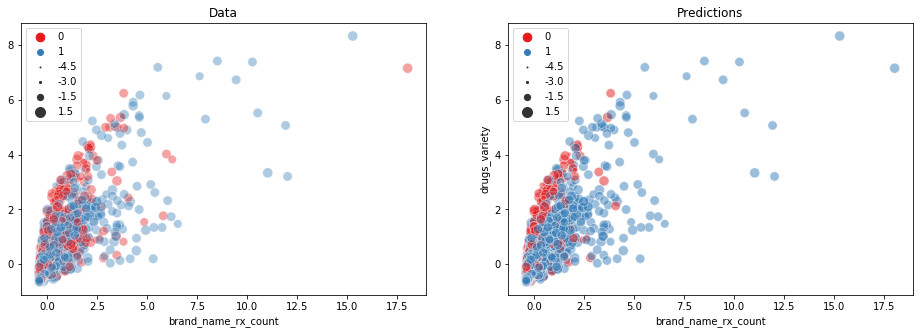

In [23]:
plotting_LR_train_result = X_train.T

fig, (ax2, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))

ax2.set_title('Data')
sns.scatterplot(x=plotting_LR_train_result[0],
                y=plotting_LR_train_result[3],
                size=plotting_LR_train_result[2], sizes=(1, 100),
                hue=y_train.values,
                palette='Set1', alpha=.4,
                ax=ax2)

ax2.legend(loc='upper left')


ax1.set_title('Predictions')
sns.scatterplot(x=plotting_LR_train_result[0],
                y=plotting_LR_train_result[3],
                size=plotting_LR_train_result[2], sizes=(1, 100),
                hue=LogReg_0.predict(X_train),
                palette='Set1', alpha=.5,
                ax=ax1)

ax1.legend(loc='upper left')

ax2.set_xlabel('brand_name_rx_count')
ax1.set_xlabel('brand_name_rx_count')
plt.ylabel('drugs_variety')

# save
# plt.savefig('Train_LR_classification_result.tiff', transparent=False, dpi=300, bbox_inches="tight")

### Estimate the model quality.

**Let's build the ROC curve, a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied.**

The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings. The true-positive rate is also known as sensitivity, recall. The false-positive rate is also known as probability of false alarm and can be calculated as (1 − specificity).

Train ROC AUC: 0.809
Optimal threshold value for train set: 0.635
Test ROC AUC: 0.840
Optimal threshold value for test set: 0.647


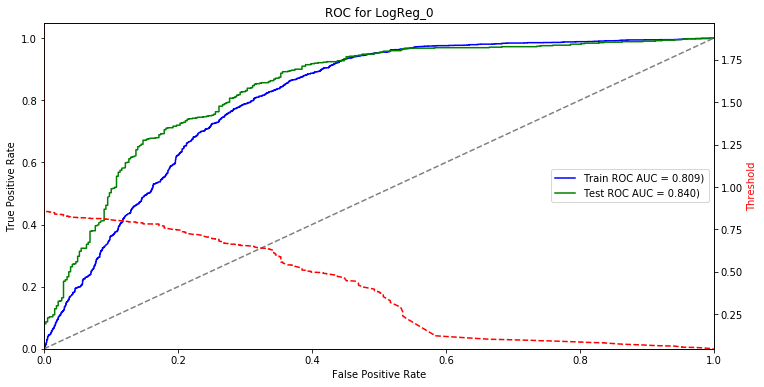

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_0,0.5,1000,228,151,53,568,0.84,0.915,0.602,0.742,0.796
LogReg_0,0.647,1000,260,119,92,529,0.769,0.852,0.686,0.764,0.789


In [24]:
# with `male`as target
plot_report(LogReg_0, 'LogReg_0', X_train, y_train, X_test, y_test)

### <center> Optimizing predictions balance for each class with `threshold` (`g-mean`): </center>

<img src="https://miro.medium.com/max/512/1*J8kWRRekByVSJi8XDTSsgw.jpeg" style="width: 700px"/>

### Parameters and LogLoss function

**The logistic function of losses**, it underlies the logistic regression. Minimization of the logistic function of losses is a task that logistic regression solves, taking as a basis the principle of maximum likelihood.

Logloss minimization can be thought of as the task of maximizing accuracy by a fine for incorrect predictions. However, it should be noted that logloss extremely fines for the confidence of the classifier in the wrong answer.



To fine-tune the model for error, regularization is used - this is a way to reduce the complexity of the model in order to prevent retraining or fix an incorrectly posed problem. This is usually achieved by adding some a priori information to the problem statement.

* **penalty**: {'l1', default ='l2', 'elasticnet', 'none'}


* **C**: default = 1.0, should be positive float.

Like in **SVM**, smaller values specify stronger regularization.


<center><img src="https://nagornyy.me/img/content/svm_nonlin.png" style="width: 800px; display: inline" /></center>

Чем больше предикторов, тем больше риск переобучения модели. Переобучение также связано с размером коэфициентов.

Переобучение – ситуация, в которой обучающая ошибка продолжает снижаться с повышением сложности модели, а тестовая ошибка растет.

Как с этим бороться?

* Отбор наилучших предикторов
* Снижение размерности предикторов
* Регуляризация

Регуляризация — это способ уменьшить сложность модели чтобы предотвратить переобучение или исправить некорректно поставленную задачу. Обычно это достигается добавлением некоторой априорной информации к условию задачи.

В данном случае суть регуляризации состит в том, что мы создаём модель со всеми предикторами, а потом искуственно уменьшаем размер коэффициентов, прибавляя некоторую величину к ошибке.

Ошибка — это то, что минимизируется обучением с помощью одного из примерно десятка численных методов вроде градиентного спуска (gradient descent), итерационного алгоритма Ньютона-Рафсона (iterative Newton-Raphson), L-BFGS, обратного распространения ошибок (back-propagation) и оптимизации роя (swarm optimization).

Чтобы величины весовых значений модели не становились большими, процесс регуляризации штрафует весовые значения добавляя их в вычисление ошибки. Если весовые значения включаются в общую ошибку, которая минимизируется, тогда меньшие весовые значения будут давать меньшие значения ошибки. `l1`-регуляризация штрафует весовые значения добавлением суммы их абсолютных значений к ошибке.

`l2`-регуляризация выполняет аналогичную операцию добавлением суммы их квадратов к ошибке.


Гиперпараметр `penalty` устанавливает используемый тип члена регуляризации. Указание `12` обозначает, что алгоритм SGD добавлял к функции издержек член регуляризации, равный одной второй квадрата нормы весового вектора: это просто гребневая регрессия. 

Гребневая регрессия (также называемая регуляризацией Тихонова) является регуляризированной версией линейной регрессии: к функции издержек добавляется член регуляризации. Это заставляет алгоритм обучения не только приспосабливаться к данным, но также удерживать веса модели насколько возможно небольшими. Уравнение: 

Лассо-регрессией, представляет собой еще одну регуляризированную версию линейной регрессии: в точности как гребневая регрессия она добавляет к функции издержек член регуляризации, но вместо одной второй квадрата нормы `l2` весового вектора использует норму `l1` весового вектора, уравнение: 


Важной характеристикой лассо-регрессии является то, что она стремится полностью исключить веса наименее важных признаков (т.е. устанавливает их в ноль). Другими словами, лассо-регрессия автоматически выполняет выбор признаков и выпускает разреженную модель (т.е. с незначительным числом ненулевых весов признаков).

Гребневая регрессия - хороший вариант по умолчанию, но если вы полагаете, что только несколько признаков будут фактически полезными, то должны отдавать предпочтение лассо-регрессии (`l1`), поскольку она имеет тенденцию понижать веса бесполезных признаков до нуля.



[Differences between L1 and L2 as Loss Function and Regularization](http://www.chioka.in/differences-between-l1-and-l2-as-loss-function-and-regularization/)

#### Оптимизируем параметры модели с помощью кросс-валидации и [`GridSearchCV`](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html?highlight=gridsearchcv#sklearn.model_selection.GridSearchCV):

In [25]:
# назначаем алгоритм
LogReg = LogisticRegression(random_state=seed)
# назначаем параметры
LogReg_params = {"C":np.logspace(-3,2,100), "penalty":["l1","l2"]}

LogReg_m = grid_collect(LogReg, 'LogReg_m', LogReg_params,  X_train, y_train)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:    3.5s


Best AUC: 0.80453863567791, with estimtor:
LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)


[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    5.0s finished


### How optimization change model coefs:

In [26]:
#create dictionary
LogReg_m_coefs = dict(zip(features, LogReg_m.coef_[0]))
LogReg_m_coefs = sorted(LogReg_m_coefs.items(), key=lambda x: x[1], reverse=True)
LogReg_m_coefs

[('surely_male_spec', 0.41679969806214795),
 ('years_practicing', 0.19322607588756366),
 ('South_urban', 0.07960292596088198),
 ('brand_name_rx_count', 0.0626098062079872),
 ('generic_rx_count', 0.04549483704081179),
 ('West_urban', 0.011802754005393653),
 ('drugs_variety', 0.0),
 ('probably_male_spec', 0.0),
 ('Midwest_non-urban', 0.0),
 ('Midwest_urban', 0.0),
 ('Northeast_non-urban', 0.0),
 ('Northeast_urban', 0.0),
 ('West_non-urban', 0.0),
 ('South_non-urban', -0.013914395158658738),
 ('unisex_spec', -0.13119737185881764),
 ('probably_female_spec', -0.21428553112446277),
 ('surely_female_spec', -1.062036415889272)]

Train ROC AUC: 0.807
Optimal threshold value for train set: 0.647
Test ROC AUC: 0.842
Optimal threshold value for test set: 0.647


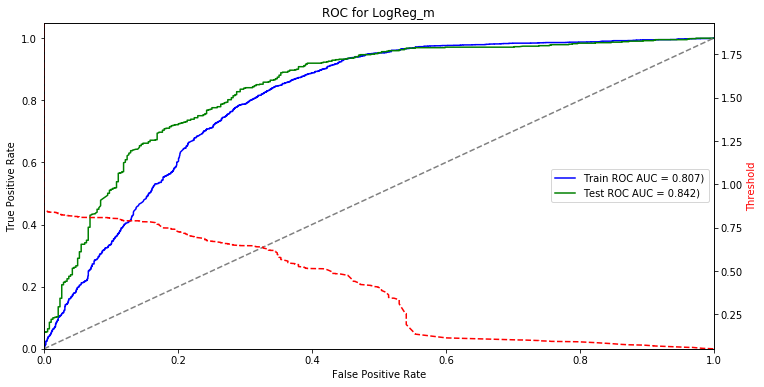

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_m,0.5,1000,218,161,46,575,0.842,0.926,0.575,0.73,0.793
LogReg_m,0.647,1000,268,111,102,519,0.771,0.836,0.707,0.769,0.787


In [27]:
plot_report(LogReg_m, 'LogReg_m', X_train, y_train, X_test, y_test)

### Результат изменился... Проводим 10-ую кроссвалидацию, использую лучший алгоритм:

- Run 10 x bootstraping (controlled random division (set.seed)). You will get 10 models for each algorithm.
- For each model based on a single algorithm, calculate and store the following metrics: AUC, sensitivity, and specificity on the test set. Beware of the appropriate limit (threshold) for converting scale prediction results into binary if necessary.


In [28]:
bootstraping_estimator(LogReg_m, 'LogReg_m', X, y)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794
LogReg_m,0.5,800,1000,215,164,47,574,0.824,0.924,0.567,0.724,0.789
LogReg_m,0.5,389,1000,214,165,43,578,0.822,0.931,0.565,0.725,0.792
LogReg_m,0.5,687,1000,220,159,46,575,0.82,0.926,0.58,0.733,0.795
LogReg_m,0.5,487,1000,210,169,32,589,0.817,0.948,0.554,0.725,0.799
LogReg_m,0.5,897,1000,216,163,39,582,0.817,0.937,0.57,0.731,0.798
LogReg_m,0.5,28,1000,208,171,32,589,0.816,0.948,0.549,0.721,0.797
LogReg_m,0.5,818,1000,193,186,46,575,0.807,0.926,0.509,0.687,0.768
LogReg_m,0.5,46,1000,208,171,41,580,0.805,0.934,0.549,0.716,0.788
LogReg_m,0.5,672,1000,204,175,50,571,0.79,0.919,0.538,0.704,0.775


In [29]:
# search best params with female target

LogReg_f = grid_collect(LogReg, 'LogReg_f', LogReg_params, X_train, y0_train)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Best AUC: 0.80453863567791, with estimtor:
LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)


[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    2.5s finished


In [30]:
bootstraping_estimator(LogReg_f, 'LogReg_f', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_f,0.5,487,1000,585,36,173,206,0.836,0.544,0.942,0.716,0.791
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8
LogReg_f,0.5,883,1000,579,42,166,213,0.827,0.562,0.932,0.724,0.792
LogReg_f,0.5,28,1000,587,34,174,205,0.825,0.541,0.945,0.715,0.792
LogReg_m,0.5,800,1000,215,164,47,574,0.824,0.924,0.567,0.724,0.789
LogReg_m,0.5,389,1000,214,165,43,578,0.822,0.931,0.565,0.725,0.792
LogReg_m,0.5,687,1000,220,159,46,575,0.82,0.926,0.58,0.733,0.795


Best quality for 2 other metrics:

In [31]:
top_10_res(models_q, 'g-mean')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_m,0.69,389,1000,287,92,134,487,0.771,0.784,0.757,0.771,0.774
LogReg_f,0.352,818,1000,524,97,113,266,0.773,0.702,0.844,0.77,0.79
LogReg_f,0.33,487,1000,503,118,103,276,0.769,0.728,0.81,0.768,0.779
LogReg_f,0.379,46,1000,541,80,124,255,0.772,0.673,0.871,0.766,0.796
LogReg_f,0.353,883,1000,522,99,115,264,0.769,0.697,0.841,0.765,0.786
LogReg_f,0.349,897,1000,516,105,113,266,0.766,0.702,0.831,0.764,0.782
LogReg_m,0.647,687,1000,265,114,104,517,0.766,0.833,0.699,0.763,0.782
LogReg_m,0.695,883,1000,287,92,145,476,0.762,0.767,0.757,0.762,0.763
LogReg_f,0.353,800,1000,515,106,118,261,0.759,0.689,0.829,0.756,0.776
LogReg_m,0.574,897,1000,239,140,59,562,0.768,0.905,0.631,0.755,0.801


In [32]:
top_10_res(models_q, 'acc')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
LogReg_m,0.574,897,1000,239,140,59,562,0.768,0.905,0.631,0.755,0.801
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8
LogReg_m,0.5,487,1000,210,169,32,589,0.817,0.948,0.554,0.725,0.799
LogReg_m,0.5,897,1000,216,163,39,582,0.817,0.937,0.57,0.731,0.798
LogReg_m,0.5,28,1000,208,171,32,589,0.816,0.948,0.549,0.721,0.797
LogReg_f,0.379,46,1000,541,80,124,255,0.772,0.673,0.871,0.766,0.796
LogReg_m,0.5,687,1000,220,159,46,575,0.82,0.926,0.58,0.733,0.795
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794


In [33]:
color_report_table(models_q)

In `models_dict` saved all estimators:

In [34]:
models_dict

{'LogReg_0': LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
           intercept_scaling=1, max_iter=100, multi_class='warn',
           n_jobs=None, penalty='l2', random_state=40, solver='warn',
           tol=0.0001, verbose=0, warm_start=False),
 'LogReg_m': LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
           fit_intercept=True, intercept_scaling=1, max_iter=100,
           multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
           solver='warn', tol=0.0001, verbose=0, warm_start=False),
 'LogReg_f': LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
           fit_intercept=True, intercept_scaling=1, max_iter=100,
           multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
           solver='warn', tol=0.0001, verbose=0, warm_start=False)}

# 5.2. Support Vector Classification with Radial Basis Function kernel <a class="anchor" id="SVC"></a>

[<prev](#Log) | [back to contents](#contents) | [next>](#kNN)

The support vector machine (SVM) is a popular classification technique. SVM requires that each data instance is represented as a vector of real numbers. Hence, if there are categorical attributes, we first have to convert them into numeric data.  The goal of SVM is to produce a model (based on the training data) which predicts the target values of the test data given only the test data attributes.

Given a training set of instance-label pairs *(x_i, y_i), i = 1,...,l* where *x_i* bolongs to R^n and *y* belongs to {1, -1}^l, **the support vector machines require the solution of the following optmization problem:**

Scaling before applying SVM is very important. The main advantage of scaling is to avoid attributes in greater numeric ranges dominating those in smaller numeric ranges. Another advantage is to avoid numerical difficulties during the calculation. Because kernel values usually depend on the inner products of feature vectors, e.g. the linear kernel and the polynomial kernel, large attribute values might cause numerical problems. 

**Here training vectors xi are mapped into a higher (maybe infinite) dimensional space
by the function φ. SVM finds a linear separating hyperplane with the maximal margin
in this higher dimensional space. C > 0 is the penalty parameter of the error term.
Furthermore, K(xi, xj ) ≡ φ(xi)^T φ(xj) is called the kernel function.**


Один из подходов к обработке нелинейных наборов данных предусматривает добавление дополнительных признаков, подсчитанных с применением функции близости, которая измеряет, сколько сходства каждый образец имеет с отдельным ориентиром. Определяем близость с помощью функции `rbf`.

**In our case we will use Radial Basis Function kernel (RBF):**

<center><img src="https://pbs.twimg.com/media/ETPhcZPUEAMNIRT?format=png&name=small" style="width: 800px; display: inline" /></center>

[SOURCE](https://twitter.com/chrisalbon)

In [35]:
from sklearn.svm import SVC

In [36]:
SVC_0 = SVC(random_state=seed, class_weight = 'balanced', probability=True)
SVC_0.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=True, random_state=40,
  shrinking=True, tol=0.001, verbose=False)

Train ROC AUC: 0.817
Optimal threshold value for train set: 0.707
Test ROC AUC: 0.817
Optimal threshold value for test set: 0.606


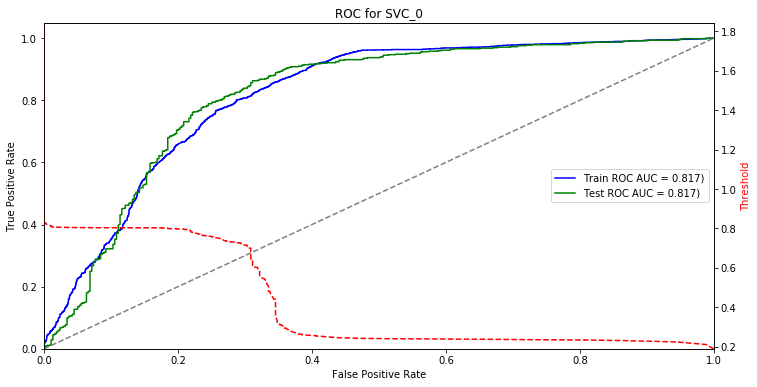

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
SVC_0,0.5,1000,252,127,77,544,0.817,0.876,0.665,0.763,0.796
SVC_0,0.606,1000,261,118,85,536,0.776,0.863,0.689,0.771,0.797


In [37]:
plot_report(SVC_0, 'SVC_0', X_train, y_train, X_test, y_test)

### Оптимизируем алгоритм

* `С` - параметр регуляризации. Он в том числе контролирует соотношение между гладкой границей и корректной классификацией рассматриваемых точек. Чем больше значение `С` тем больше объектов обучающей выборки будут правильно классифицированы. Чем выше число `С` тем более запутанная гиперплоскость будет в вашей модели, но и выше число верно-классифицированных объектов обучающей выборки. Поэтому, важно “подкручивать” параметры модели под конкретный набор данных, чтобы избежать переобучения но, в то же время достигнуть высокой точности.


* `tol` is the tolerance for the stopping criteria. This tells scikit to stop searching for a minimum (or maximum) once some tolerance is achieved, i.e. once you're close enough. `tol` will change depending on the objective function being minimized and the algorithm they use to find the minimum, and thus will depend on the model you are fitting. There is no universal tolerance to scikit.


* `gamma` - это «ширина» rbf ядра (kernel). Она участвует в подгонке модели и может являться причиной переобучения. В официальной документации библиотека SciKit Learn говорится, что гамма определяет насколько далеко каждый из элементов в наборе данных имеет влияние при определении “идеальной линии”. Чем ниже гамма, тем больше элементов, даже тех, которые достаточно далеки от разделяющей линии, принимают участие в процессе выбора этой самой линии. Если же, гамма высокая, тогда алгоритм будет “опираться” только на тех элементах, которые наиболее близки к самой линии.

In [38]:
# SVC?

In [39]:
# # # назначаем алгоритм
# SVC_opt = SVC(random_state=seed, class_weight = 'balanced', tol=.1, probability=True)
 
# # # назначаем параметры
# SVC_params = {"C":np.arange(.18,.33,.01)}

# SVC_m = grid_collect(SVC_opt, 'SVC_m', SVC_params, X_train, y_train)


# BEST
SVC_m = SVC(C=0.22000000000000003, cache_size=200, class_weight='balanced', coef0=0.0,
              decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
              kernel='rbf', max_iter=-1, probability=True, random_state=40,
              shrinking=True, tol=0.1, verbose=False)

SVC_m.fit(X_train, y_train)

SVC(C=0.22000000000000003, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=True, random_state=40,
  shrinking=True, tol=0.1, verbose=False)

Train ROC AUC: 0.797
Optimal threshold value for train set: 0.451
Test ROC AUC: 0.812
Optimal threshold value for test set: 0.720


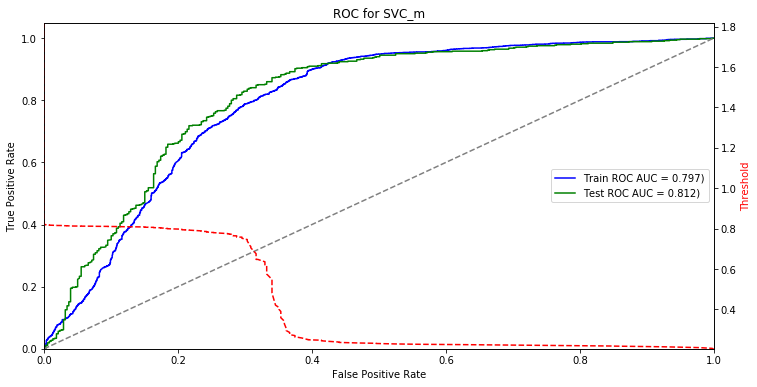

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
SVC_m,0.5,1000,250,129,84,537,0.812,0.865,0.66,0.755,0.787
SVC_m,0.72,1000,263,116,100,521,0.766,0.839,0.694,0.763,0.784


In [40]:
plot_report(SVC_m, 'SVC_m', X_train, y_train, X_test, y_test)

In [41]:
bootstraping_estimator(SVC_m, 'SVC_m', X, y)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_f,0.5,487,1000,585,36,173,206,0.836,0.544,0.942,0.716,0.791
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8
LogReg_f,0.5,883,1000,579,42,166,213,0.827,0.562,0.932,0.724,0.792
LogReg_f,0.5,28,1000,587,34,174,205,0.825,0.541,0.945,0.715,0.792
LogReg_m,0.5,800,1000,215,164,47,574,0.824,0.924,0.567,0.724,0.789
LogReg_m,0.5,389,1000,214,165,43,578,0.822,0.931,0.565,0.725,0.792
LogReg_m,0.5,687,1000,220,159,46,575,0.82,0.926,0.58,0.733,0.795


In [42]:
# # for `female` target
# SVC_f = grid_collect(SVC_opt, 'SVC_f', SVC_params, X_train, y0_train)

# BEST:
SVC_f = SVC(C=0.3100000000000001, cache_size=200, class_weight='balanced', coef0=0.0,
              decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
              kernel='rbf', max_iter=-1, probability=True, random_state=40,
              shrinking=True, tol=0.1, verbose=False)
            
SVC_f.fit(X_train, y0_train)

SVC(C=0.3100000000000001, cache_size=200, class_weight='balanced', coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=True, random_state=40,
  shrinking=True, tol=0.1, verbose=False)

In [43]:
bootstraping_estimator(SVC_f, 'SVC_f', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
LogReg_f,0.5,487,1000,585,36,173,206,0.836,0.544,0.942,0.716,0.791
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8
LogReg_f,0.5,883,1000,579,42,166,213,0.827,0.562,0.932,0.724,0.792
SVC_f,0.5,897,1000,554,67,139,240,0.826,0.633,0.892,0.752,0.794
LogReg_f,0.5,28,1000,587,34,174,205,0.825,0.541,0.945,0.715,0.792
LogReg_m,0.5,800,1000,215,164,47,574,0.824,0.924,0.567,0.724,0.789
LogReg_m,0.5,389,1000,214,165,43,578,0.822,0.931,0.565,0.725,0.792


In [44]:
color_report_table(models_q)

### Как видим, Logsitic Regression чуть лучше справился с классификацией (отталкиваясь от приоритета метрики `AUC`), в качестве наиболее значемого класса оптимальнее использовать `female`. Далее мы будем использовать только один набор таргетов.

# 5.3. kNN (K-Nearest Neighbors)<a class="anchor" id="kNN"></a>

[<prev](#SVC) | [back to contents](#contents) | [next>](#ANN)

 **Classifier implementing the k-nearest neighbors vote.**
 
 The method is considered fast in comparison, for example, with compositions of algorithms, but in real problems, as a rule, the number of neighbors used for classification will be large (100-150), and in this case the algorithm will not work as fast as the decision tree.
 
 If there are a lot of features in the data set, then it is difficult to find the appropriate weights and determine which features are not important for classification / regression.
 
 Dependence on the chosen metric of distance between examples. The default choice of Euclidean distance is most often not justified by anything. You can find a good solution by enumerating the parameters, but for a large data set, this is time-consuming.
 
 There is no theoretical basis for choosing a certain number of neighbors - just busting (however, most often this is true for all hyperparameters of all models). In the case of a small number of neighbors, the method is sensitive to outliers, that is, it tends to retrain;

**Качество классификации/регрессии методом ближайших соседей зависит от нескольких параметров:**

* число соседей

* метрика расстояния между объектами (часто используются метрика Хэмминга, евклидово расстояние, косинусное расстояние и расстояние Минковского). Отметим, что при использовании большинства метрик значения признаков надо масштабировать. Условно говоря, чтобы признак "Зарплата" с диапазоном значений до 100 тысяч не вносил больший вклад в расстояние, чем "Возраст" со значениями до 100.

* веса соседей (соседи тестового примера могут входить с разными весами, например, чем дальше пример, тем с меньшим коэффициентом учитывается его "голос"). `weights`: "uniform" (все веса равны), "distance" (вес обратно пропорционален расстоянию до тестового примера) или другая определенная пользователем функция.

In [45]:
from sklearn.neighbors import KNeighborsClassifier
# KNeighborsClassifier?

In [46]:
# clf_knn_0 = KNeighborsClassifier(n_jobs=-1)

# # сразу подбираем оптимальные параметры:
# KNN_params = {'n_neighbors':list(range(1,51,2)),
#               'weights':['uniform','distance'],
#               'metric':['minkowski','euclidean','manhattan']}

# # for `female` target
# KNN = grid_collect(clf_knn_0, 'KNN', KNN_params, X_train, y0_train)


# BEST:
KNN = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                           metric_params=None, n_jobs=-1, n_neighbors=31, p=2,
                           weights='uniform')
        
KNN.fit(X_train, y0_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=31, p=2,
           weights='uniform')

Now we build the **ROC curve**, a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied.

The **ROC curve** is created by plotting the **true positive rate (TPR) against the false positive rate (FPR)** at various threshold settings. The true-positive rate is also known as **sensitivity, recall**. The false-positive rate is also known as probability of false alarm and can be calculated as **(1 − specificity)**.

**In this example we get probability of 1 (male) for test and train sets. We can see, that classifier worked better on train set than on test, as ROC AUC for train set is bigger (0.8094).** 

Train ROC AUC: 0.827
Optimal threshold value for train set: 0.419
Test ROC AUC: 0.822
Optimal threshold value for test set: 0.355


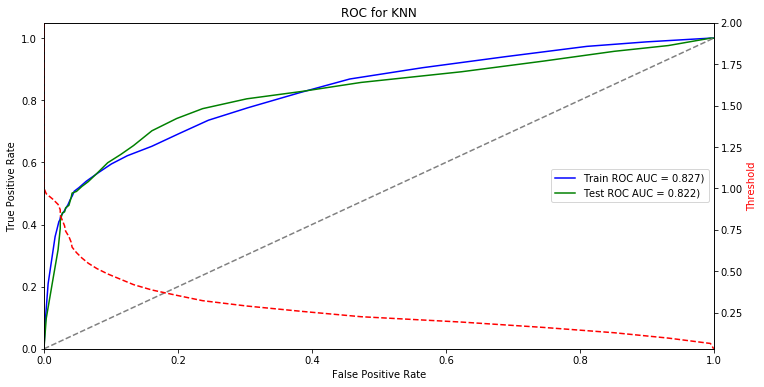

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
KNN,0.5,1000,572,49,165,214,0.822,0.565,0.921,0.721,0.786
KNN,0.355,1000,498,123,98,281,0.772,0.741,0.802,0.771,0.779


In [47]:
plot_report(KNN,'KNN', X_train, y0_train, X_test, y0_test)

**Let's show the text report showing the main classification metrics for k-NN classifier.**

We see  precision, recall and F1-score for each class. In this case, male metrics are better than for female. K-NN classifier shows better result than previous. 

**The report includes macro average (averaging the unweighted mean per label), weighted average (averaging the support-weighted mean per label), and sample average (only for multilabel classification). Micro average (averaging the total true positives, false negatives and false positives) is only shown for multi-label or multi-class with a subset of classes, because it corresponds to accuracy otherwise.**

#### Lets try take bettter param, and see how model will run with crossvalidation.

In [48]:
bootstraping_estimator(KNN,'KNN', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
KNN,0.5,46,1000,587,34,163,216,0.84,0.57,0.945,0.734,0.803
KNN,0.5,897,1000,585,36,164,215,0.839,0.567,0.942,0.731,0.8
KNN,0.5,818,1000,585,36,162,217,0.837,0.573,0.942,0.734,0.802
LogReg_f,0.5,487,1000,585,36,173,206,0.836,0.544,0.942,0.716,0.791
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
KNN,0.5,487,1000,587,34,176,203,0.834,0.536,0.945,0.712,0.79
KNN,0.5,883,1000,586,35,169,210,0.833,0.554,0.944,0.723,0.796
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
LogReg_m,0.5,883,1000,212,167,39,582,0.83,0.937,0.559,0.724,0.794
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8


In [49]:
top_10_res(models_q, 'g-mean')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
KNN,0.323,883,1000,480,141,86,293,0.773,0.773,0.773,0.773,0.773
LogReg_m,0.69,389,1000,287,92,134,487,0.771,0.784,0.757,0.771,0.774
SVC_f,0.25,883,1000,518,103,109,270,0.773,0.712,0.834,0.771,0.788
LogReg_f,0.352,818,1000,524,97,113,266,0.773,0.702,0.844,0.77,0.79
KNN,0.355,46,1000,501,120,101,278,0.77,0.734,0.807,0.769,0.779
SVC_f,0.223,897,1000,494,127,97,282,0.77,0.744,0.795,0.769,0.776
SVC_f,0.225,487,1000,497,124,99,280,0.77,0.739,0.8,0.769,0.777
LogReg_f,0.33,487,1000,503,118,103,276,0.769,0.728,0.81,0.768,0.779
LogReg_f,0.379,46,1000,541,80,124,255,0.772,0.673,0.871,0.766,0.796
LogReg_f,0.353,883,1000,522,99,115,264,0.769,0.697,0.841,0.765,0.786


In [50]:
top_10_res(models_q, 'acc')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
SVC_f,0.684,818,1000,564,57,135,244,0.776,0.644,0.908,0.765,0.808
SVC_f,0.696,46,1000,567,54,141,238,0.771,0.628,0.913,0.757,0.805
LogReg_f,0.5,897,1000,583,38,158,221,0.836,0.583,0.939,0.74,0.804
KNN,0.5,46,1000,587,34,163,216,0.84,0.57,0.945,0.734,0.803
KNN,0.5,818,1000,585,36,162,217,0.837,0.573,0.942,0.734,0.802
SVC_m,0.472,897,1000,244,135,64,557,0.77,0.897,0.644,0.76,0.801
LogReg_m,0.574,897,1000,239,140,59,562,0.768,0.905,0.631,0.755,0.801
KNN,0.5,897,1000,585,36,164,215,0.839,0.567,0.942,0.731,0.8
LogReg_f,0.5,46,1000,585,36,164,215,0.828,0.567,0.942,0.731,0.8


In [51]:
color_report_table(models_q)

# 5.4. Artificial Neural Network (ANN) 
<a class="anchor" id="ANN"></a>


[<prev](#kNN) | [back to contents](#contents) | [next>](#dtc)

Theory:

1. [Easy start](https://www.youtube.com/watch?v=bxe2T-V8XRs&list=PLtaHbsWJTbFNoPUbcEWHNjKNH8IqSqu7r&index=43&t=0s)
2. [Principles of training multi-layer neural network using backpropagation](http://galaxy.agh.edu.pl/~vlsi/AI/backp_t_en/backprop.html)

In [52]:
import torch
import torch.nn as nn

#### Train and fit models only with female-target datasets:

In [53]:
# change data type to np.array

y_w_train = y0_train.values
y_w_test = y0_test.values

### Creat model witn 4 nodes in one hidden layer :

* [applies a `Linear` transformation to the incoming data;](https://pytorch.org/docs/stable/nn.html#linear)
* [after use non-linear (`ReLU` etc.) activations function.](https://pytorch.org/docs/stable/nn.html#non-linear-activations-weighted-sum-nonlinearity)


In [54]:
# Layers size:

n_input = X_train.shape[1] # Number of inputs = num of features

n_hidden = 4 # Number of hidden nodes

# Number of output nodes = number of class for predict_proba, also can be "1" for one-value-predictions
n_output = len(y0_test.unique())


# Building network:

ANN_1hl_4n = nn.Sequential(
    nn.Linear(n_input, n_hidden),
    nn.ReLU(),
    nn.Linear(n_hidden, n_output),
    nn.Sigmoid())
    

print(ANN_1hl_4n)

Sequential(
  (0): Linear(in_features=17, out_features=4, bias=True)
  (1): ReLU()
  (2): Linear(in_features=4, out_features=2, bias=True)
  (3): Sigmoid()
)


#### Set hyperparameters:

In [55]:
loss_func = nn.BCELoss()
learning_rate = 0.01

# set optimizer to model
optimizer = torch.optim.Adam(ANN_1hl_4n.parameters(), lr=learning_rate)

#### Create functions `train_clf_NN` and `run_clf_NN`:

Each update to the model involves the same general pattern comprised of:

1. Clearing the last error gradient.
2. A forward pass of the input through the model.
3. Calculating the loss for the model output.
4. Backpropagating the error through the model.
5. Update the model in an effort to reduce loss.

In [56]:
# y_pred_train =
def train_clf_NN(clf_NN, X, y, epochs=3000, loss_func=loss_func, lr=learning_rate, optimizer=optimizer):

    y_pred_list = []
    
    y_t = torch.FloatTensor(y)

    for e in range(epochs):
        X_t = torch.FloatTensor(X)
        y_hat = clf_NN(X_t)[:,1]
        
        # # .zero_grad() сбрасывает установленные на предыдущей итерации веса параметров
        optimizer.zero_grad()
          
        # вычисляет значение ошибки/отклонения  
        loss = loss_func(y_hat, y_t)        
        loss.backward()
        
        # далее функци optimizer.step() обновляет веса опираясь на выявленную ошибку  
        optimizer.step()
                
        # save predicts    
        y_pred_list.append(y_hat)
        
    return y_pred_list[-1].detach().numpy()


# y_pred_test =
def run_clf_NN(clf_NN, model_name, X):

    y_pred_list = []
    
    X_t = torch.FloatTensor(X)
    y_hat = clf_NN(X_t)[:,1]  
    y_pred_list.append(y_hat)
    
    global models_dict
    models_dict[model_name]=clf_NN

    return y_pred_list[-1].detach().numpy()

Functions for reporting:

In [57]:
def plot_NN_report(model_name, y_pred_train, y_train, y_pred_test, y_test, img=True, save=False):
    
    '''
    -------------------------------------------------------------------------------------
    get in:
    0. model_name - for plotting and saving;
    1. y_pred_train - predicts for train;
    2. y_train - train target;
    3. y_pred_test - predicts for test;
    4. y_test - test target;
    5. save(default 'True') - local save img;
    6. img(default 'True') - display 3 img.
    -------------------------------------------------------------------------------------
    return:
    1. visualizing roc_auc plot for train and test;
    2. pandas DF with estimators metrics, join estimator metrics with previous.
    -------------------------------------------------------------------------------------
    '''   

    # compute TRAIN   ############################################################
    fpr0, tpr0, ths0 = roc_curve(y_train, y_pred_train) # compute fpr, tpr, thresholds and roc_auc for train
    
    roc_auc0 = auc(fpr0, tpr0) # compute area under the curve
    print('Train ROC AUC: {0:.3f}'.format(roc_auc0))
    
    # optimal threshold for train
    optimal_ths0_idx = np.argmax(tpr0 - fpr0)
    optimal_ths0 = ths0[optimal_ths0_idx]
    print('Optimal threshold value for train set: {0:.3f}'.format(optimal_ths0))
        
    # compute TEST   ############################################################
    fpr, tpr, ths = roc_curve(y_test, y_pred_test) # ... for test
    
    roc_auc = auc(fpr, tpr) 
    print('Test ROC AUC: {0:.3f}'.format(roc_auc))
    
    # optimal threshold
    optimal_ths_idx = np.argmax(tpr - fpr)
    optimal_ths = ths[optimal_ths_idx]
    print('Optimal threshold value for test set: {0:.3f}'.format(optimal_ths))
        
    # round predicts    ##########################################################
    for _ in y_pred_test:
        y_pred_test_round = [1 if _ >= 0.5 else 0 for _ in y_pred_test]
        y_pred_test_round_ths = [1 if _ >= optimal_ths else 0 for _ in y_pred_test]
    
    # cm with default ths = 0.5 ##################################################
    cm = confusion_matrix(y_test, y_pred_test_round)  
    cm_norm = cm.astype('float') / cm.sum()     # normalize cm  
    tn, fp, fn, tp = cm.ravel() # compute estimetor answers
    
    # cm with ths = optimal_ths
    cm_ths = confusion_matrix(y_test, y_pred_test_round_ths)
    cm_norm_ths = cm_ths.astype('float') / cm_ths.sum()     # normalize cm  
    tn_ths, fp_ths, fn_ths, tp_ths = cm_ths.ravel()
    fpr_ths, tpr_ths, _ = roc_curve(y_test, y_pred_test_round_ths) # ... for test with optimal_threshold
    roc_auc_ths = auc(fpr_ths, tpr_ths) 

    #  roc_auc
    if img:
        fig = plt.figure(figsize=(12,6))

        ax1 = fig.add_subplot(1, 1, 1)

        ax1.set(title = f'ROC for {model_name}')

        ax1.plot(fpr0, tpr0, label='Train ROC AUC = %0.3f)' % (roc_auc0), color='b')
        ax1.plot(fpr, tpr, label='Test ROC AUC = %0.3f)' % (roc_auc), color='g')
        ax1.plot([0, 1], [0, 1], linestyle='dashed', color='grey')
        ax1.set_xlim([0.0, 1.0])
        ax1.set_ylim([0.0, 1.05])
        ax1.set_xlabel('False Positive Rate')
        ax1.set_ylabel('True Positive Rate')
        ax1.legend(loc="center right")

        # create the axis of thresholds (scores)
        ax4 = ax1.twinx()
        ax4.plot(fpr, ths, markeredgecolor='r',linestyle='dashed', color='r')
        ax4.set_ylabel('Threshold',color='r')
        ax4.set_ylim([ths[-1],ths[0]])
        ax4.set_xlim([fpr[0],fpr[-1]])
        
        if save:
            plt.savefig(f'roc_auc_{model_name}.tiff', transparent=False, dpi=300, bbox_inches="tight")
        else: pass
            
        plt.show()
        plt.close()
    else: pass
    
    
    # get global var and appned metrics
    global cm_df
    cm_df = cm_df.append({'model': model_name,
                          'ths': 0.5,
                          'set_size': len(y_test),
                          'tn': tn,'fp': fp, 'fn': fn, 'tp': tp,
                          'roc_auc': roc_auc},
                          ignore_index=True)
    
    cm_df = cm_df.append({'model': model_name,
                          'ths': optimal_ths,
                          'set_size': len(y_test),
                          'tn': tn_ths,'fp': fp_ths, 'fn': fn_ths, 'tp': tp_ths,
                          'roc_auc': roc_auc_ths},
                          ignore_index=True)
       
    cm_df['sn'] = cm_df.tp/(cm_df.tp+cm_df.fn)
    cm_df['sp'] = cm_df.tn/(cm_df.tn+cm_df.fp)
    cm_df['g-mean'] = ((cm_df.tp/(cm_df.tp+cm_df.fn)) * (cm_df.tn/(cm_df.tn+cm_df.fp))) ** .5
    cm_df['acc'] = (cm_df.tp+cm_df.tn)/(cm_df.tp+cm_df.tn+cm_df.fn+cm_df.fp)
    
    cm_df.iloc[:,1:] = cm_df.iloc[:,1:].apply(pd.to_numeric) 
    
    cm_df = cm_df.round({'roc_auc':3,
                         'ths':3,
                         'sn':3,
                         'sp':3,
                         'g-mean':3,
                         'acc':3})
    
    global train_preds_df
    train_preds_df[f'{model_name}'] = y_pred_train
        
    global test_preds_df
    test_preds_df[f'{model_name}'] = y_pred_test
  
        
    return (cm_df.iloc[-2:,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption('Estimator quality'))

### Training and running model:

In [58]:
# train NN
y_pred_train = train_clf_NN(ANN_1hl_4n, X_train, y_w_train, loss_func=loss_func, optimizer=optimizer)


# run NN
y_pred_test = run_clf_NN(ANN_1hl_4n, 'ANN_1hl_4n', X_test)

Train ROC AUC: 0.817
Optimal threshold value for train set: 0.395
Test ROC AUC: 0.831
Optimal threshold value for test set: 0.339


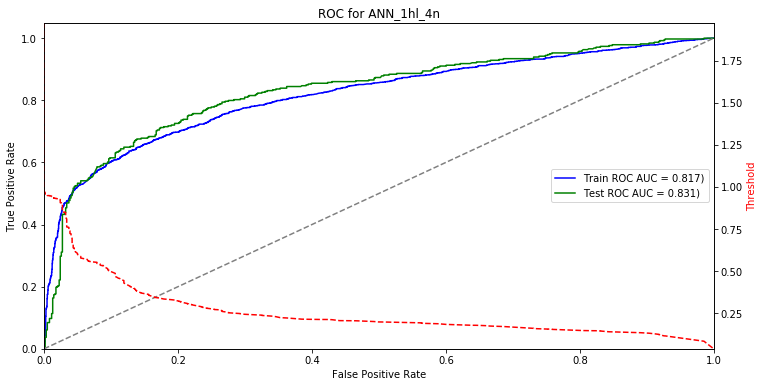

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_1hl_4n,0.5,1000,560,61,146,233,0.831,0.615,0.902,0.745,0.793
ANN_1hl_4n,0.339,1000,513,108,109,270,0.769,0.712,0.826,0.767,0.783


In [59]:
plot_NN_report('ANN_1hl_4n', y_pred_train, y0_train, y_pred_test, y0_test, img=True, save=False)

#### Model witn 8 nodes in 2 hidden layer :

In [60]:
n_hidden = 8 # Number of hidden nodes

# Building network logic with 3 hidden layer:
ANN_2hl_8n = nn.Sequential(
    nn.Linear(n_input, n_hidden),
    nn.ReLU(),
    nn.Linear(n_hidden, n_hidden),
    nn.Tanh(),
    nn.Linear(n_hidden, n_output),
    nn.Sigmoid())

optimizer = torch.optim.Adam(ANN_2hl_8n.parameters(), lr=learning_rate)

print(ANN_2hl_8n)

Sequential(
  (0): Linear(in_features=17, out_features=8, bias=True)
  (1): ReLU()
  (2): Linear(in_features=8, out_features=8, bias=True)
  (3): Tanh()
  (4): Linear(in_features=8, out_features=2, bias=True)
  (5): Sigmoid()
)


Train ROC AUC: 0.857
Optimal threshold value for train set: 0.369
Test ROC AUC: 0.804
Optimal threshold value for test set: 0.339


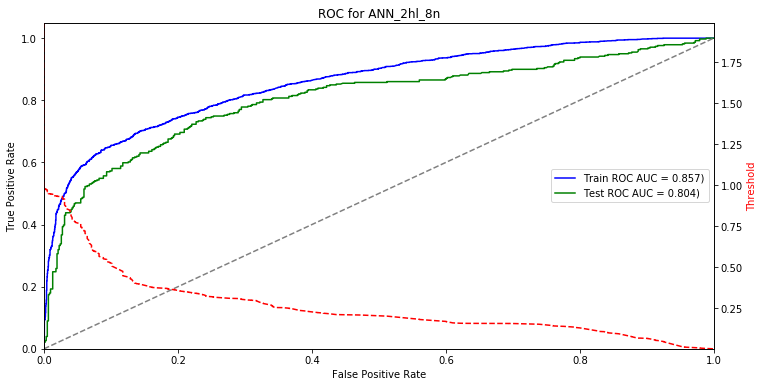

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,1000,556,65,159,220,0.804,0.58,0.895,0.721,0.776
ANN_2hl_8n,0.339,1000,480,141,102,277,0.752,0.731,0.773,0.752,0.757


In [61]:
# train NN
y_pred_train = train_clf_NN(ANN_2hl_8n, X_train, y_w_train, loss_func=loss_func, optimizer=optimizer)

# run NN
y_pred_test = run_clf_NN(ANN_2hl_8n, 'ANN_2hl_8n', X_test)

plot_NN_report('ANN_2hl_8n', y_pred_train, y0_train, y_pred_test, y0_test, img=True, save=True)

#### Model witn 4 nodes in 3 hidden layer, with [`SGD`](https://pytorch.org/docs/stable/optim.html#torch.optim.SGD) model optimizator :

In [62]:
n_hidden = 4 # Number of hidden nodes

# Building network logic with 3 hidden layer:
ANN_3hl_4n = nn.Sequential(
    nn.Linear(n_input, n_hidden),
    nn.ReLU(),
    nn.Linear(n_hidden, n_hidden),
    nn.Tanh(),
    nn.Linear(n_hidden, n_hidden),
    nn.ELU(),
    nn.Linear(n_hidden, n_output),
    nn.Sigmoid())

loss_func = nn.BCELoss()
optimizer = torch.optim.SGD(ANN_3hl_4n.parameters(), lr=learning_rate)

print(ANN_3hl_4n)

Sequential(
  (0): Linear(in_features=17, out_features=4, bias=True)
  (1): ReLU()
  (2): Linear(in_features=4, out_features=4, bias=True)
  (3): Tanh()
  (4): Linear(in_features=4, out_features=4, bias=True)
  (5): ELU(alpha=1.0)
  (6): Linear(in_features=4, out_features=2, bias=True)
  (7): Sigmoid()
)


Train ROC AUC: 0.788
Optimal threshold value for train set: 0.375
Test ROC AUC: 0.829
Optimal threshold value for test set: 0.327


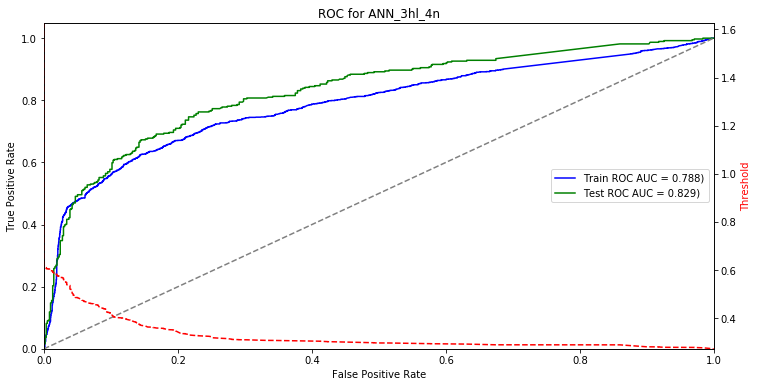

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_3hl_4n,0.5,1000,594,27,203,176,0.829,0.464,0.957,0.666,0.77
ANN_3hl_4n,0.327,1000,478,143,90,289,0.766,0.763,0.77,0.766,0.767


In [63]:
# train NN
y_pred_train = train_clf_NN(ANN_3hl_4n, X_train, y_w_train, loss_func=loss_func, optimizer=optimizer)

# run NN
y_pred_test = run_clf_NN(ANN_3hl_4n, 'ANN_3hl_4n', X_test)

plot_NN_report('ANN_3hl_4n', y_pred_train, y0_train, y_pred_test, y0_test, img=True, save=True)

In [64]:
def bootstraping_NN_clf(clf_NN, model_name, X, y, cv_seed=cv_seed):
           
    for i in cv_seed:

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=i, stratify=y)
        
        # StandartScaler
        X_test = scaler.transform(X_test)
        y_test = y_test.values
        
        # run NN
        y_pred_test = run_clf_NN(clf_NN, model_name, X_test)

        # compute TEST   ############################################################ 
        fpr, tpr, ths = roc_curve(y_test, y_pred_test)
        roc_auc = auc(fpr, tpr) 
        optimal_ths_idx = np.argmax(tpr - fpr)
        optimal_ths = ths[optimal_ths_idx]

        # round predicts    ##########################################################
        for _ in y_pred_test:
            y_pred_test_round = [1 if _ >= 0.5 else 0 for _ in y_pred_test]
            y_pred_test_round_ths = [1 if _ >= optimal_ths else 0 for _ in y_pred_test]

        # cm with default ths = 0.5 ##################################################
        cm = confusion_matrix(y_test, y_pred_test_round)  
        cm_norm = cm.astype('float') / cm.sum()     # normalize cm  
        tn, fp, fn, tp = cm.ravel() # compute estimetor answers

        # cm with ths = optimal_ths
        cm_ths = confusion_matrix(y_test, y_pred_test_round_ths)
        cm_norm_ths = cm_ths.astype('float') / cm_ths.sum()     # normalize cm  
        tn_ths, fp_ths, fn_ths, tp_ths = cm_ths.ravel()
        fpr_ths, tpr_ths, _ = roc_curve(y_test, y_pred_test_round_ths) # ... for test with optimal_threshold
        roc_auc_ths = auc(fpr_ths, tpr_ths) 


        # get global var and appned metrics
        global models_q
        models_q = models_q.append({'model': model_name,
                                  'ths': 0.5,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn,'fp': fp, 'fn': fn, 'tp': tp,
                                  'roc_auc': roc_auc},
                                  ignore_index=True)

        models_q = models_q.append({'model': model_name,
                                  'ths': optimal_ths,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn_ths,'fp': fp_ths, 'fn': fn_ths, 'tp': tp_ths,
                                  'roc_auc': roc_auc_ths},
                                  ignore_index=True)

        models_q['sn'] = models_q.tp/(models_q.tp+models_q.fn)
        models_q['sp'] = models_q.tn/(models_q.tn+models_q.fp)
        models_q['g-mean'] = ((models_q.tp/(models_q.tp+models_q.fn)) * (models_q.tn/(models_q.tn+models_q.fp))) ** .5
        models_q['acc'] = (models_q.tp+models_q.tn)/(models_q.tp+models_q.tn+models_q.fn+models_q.fp)

        models_q.iloc[:,1:] = models_q.iloc[:,1:].apply(pd.to_numeric)

        models_q = models_q.round({'roc_auc':3,
                                 'ths':3,
                                 'sn':3,
                                 'sp':3,
                                 'g-mean':3,
                                 'acc':3})
        
        global test_boots_preds_df
        test_boots_preds_df[f'{model_name}_{i}'] = y_pred_test

    def highlight_max(s):
        '''
        highlight the maximum in a Series yellow.
        '''
        is_max = s == s.max()
        return ['background-color: yellow' if v else '' for v in is_max]

    return (models_q.sort_values(by='roc_auc', ascending=False).iloc[:10,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption('Top-10 by ROC AUC').apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc']))

#### Bootstraping all NN:

In [65]:
bootstraping_NN_clf(ANN_1hl_4n, 'ANN_1hl_4n', X, y0)
bootstraping_NN_clf(ANN_2hl_8n, 'ANN_2hl_8n', X, y0)
bootstraping_NN_clf(ANN_3hl_4n, 'ANN_3hl_4n', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
ANN_2hl_8n,0.5,28,1000,580,41,158,221,0.85,0.583,0.934,0.738,0.801
ANN_2hl_8n,0.5,487,1000,578,43,150,229,0.849,0.604,0.931,0.75,0.807
ANN_2hl_8n,0.5,687,1000,567,54,160,219,0.845,0.578,0.913,0.726,0.786
ANN_2hl_8n,0.5,800,1000,565,56,149,230,0.843,0.607,0.91,0.743,0.795
ANN_1hl_4n,0.5,897,1000,574,47,148,231,0.841,0.609,0.924,0.751,0.805
KNN,0.5,46,1000,587,34,163,216,0.84,0.57,0.945,0.734,0.803


# 5.5. DecisionTreeClassifier<a class="anchor" id="dtc"></a>

[<prev](#ANN) | [back to contents](#contents) | [next>](#agg_m)

**Decision Trees (DTs)** are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.


В основе алгоритмов построения дерева решений лежит принцип жадной максимизации прироста информации – на каждом шаге выбирается тот признак, при разделении по которому прирост информации оказывается наибольшим. Дальше процедура повторяется рекурсивно, пока энтропия не окажется равной нулю или какой-то малой величине (если дерево не подгоняется идеально под обучающую выборку во избежание переобучения).

**Плюсы:**

1. Порождение четких правил классификации, понятных человеку;
2. Деревья решений могут легко визуализироваться, как сама модель (дерево), так и прогноз для отдельного взятого тестового объекта (путь в дереве);
3. Быстрые процессы обучения и прогнозирования;
4. Малое число параметров модели;
5. Поддержка и числовых, и категориальных признаков.

**Минусы:**

1. У порождения четких правил классификации есть и другая сторона: деревья очень чувствительны к шумам во входных данных, вся модель может кардинально измениться, если немного изменится обучающая выборка (например, если убрать один из признаков или добавить несколько объектов), поэтому и правила классификации могут сильно изменяться, что ухудшает интерпретируемость модели;
2. Разделяющая граница, построенная деревом решений, имеет свои ограничения (состоит из гиперплоскостей, перпендикулярных какой-то из координатной оси), и на практике дерево решений по качеству классификации уступает некоторым другим методам;

In [66]:
from sklearn.tree import DecisionTreeClassifier

#### Train and fit Tree models only with female-target datasets:

In [67]:
Tree = DecisionTreeClassifier()
Tree.fit(X_train, y0_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Train ROC AUC: 0.999
Optimal threshold value for train set: 0.400
Test ROC AUC: 0.674
Optimal threshold value for test set: 1.000


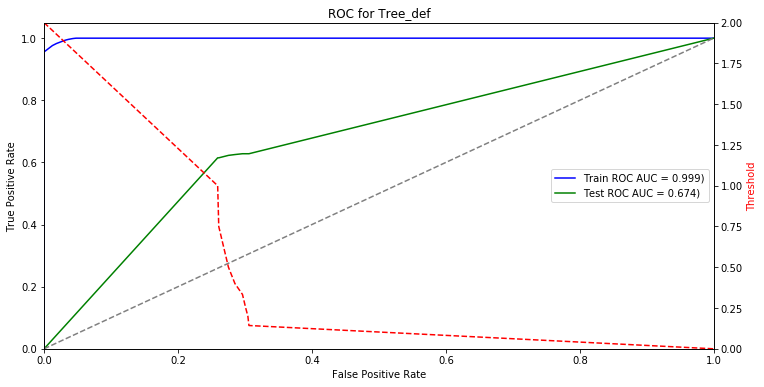

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Tree_def,0.5,1000,450,171,143,236,0.674,0.623,0.725,0.672,0.686
Tree_def,1,1000,460,161,146,233,0.678,0.615,0.741,0.675,0.693


In [68]:
plot_report(Tree, 'Tree_def', X_train, y0_train, X_test, y0_test)

In [69]:
features_std = list(X.columns)
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz

dot_data = export_graphviz(Tree,
                           filled=True, 
                           rounded=True,
                           class_names=['malw','female'],
                           feature_names=features_std, 
                           out_file=None) 

graph = graph_from_dot_data(dot_data)
graph.write_png('tree_0.png')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.697037 to fit



True

In [70]:
Image('tree_0.png')

### Default Tree is overfitting. Simplify the model

In [71]:
# DecisionTreeClassifier?

In [72]:
Tree_2 = DecisionTreeClassifier(criterion='gini', 
                              max_depth=10,
                              min_samples_leaf=40,
                              random_state=seed)

Tree_2.fit(X_train, y0_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=40, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=40,
            splitter='best')

Train ROC AUC: 0.840
Optimal threshold value for train set: 0.389
Test ROC AUC: 0.816
Optimal threshold value for test set: 0.378


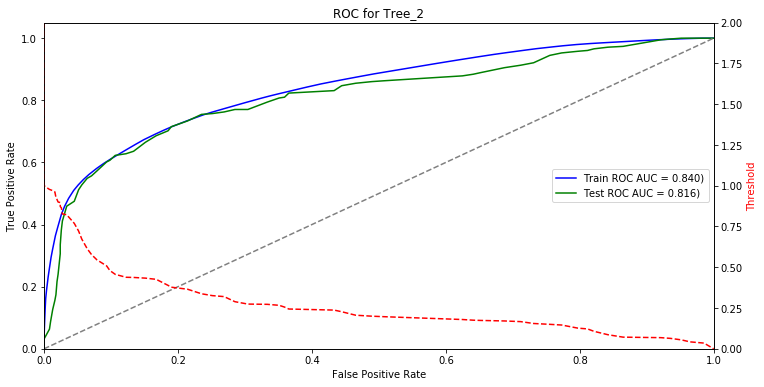

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Tree_2,0.5,1000,563,58,151,228,0.816,0.602,0.907,0.739,0.791
Tree_2,0.378,1000,503,118,108,271,0.763,0.715,0.81,0.761,0.774


In [73]:
plot_report(Tree_2, 'Tree_2', X_train, y0_train, X_test, y0_test)

In [74]:
# # DecisionTreeClassifier?
# Tree = DecisionTreeClassifier(random_state=seed)

# # назначаем параметры
# Tree_params = {'max_depth': list(range(3,11,2)),
#                'min_samples_leaf':list(range(1,81,5)),
#                'max_features':[6,8,10,12,14,16]}

# Tree_opt = grid_collect(Tree,'Tree_opt',Tree_params, X_train, y0_train)

# BEST
Tree_opt = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                                    max_features=14, max_leaf_nodes=None,
                                    min_impurity_decrease=0.0, min_impurity_split=None,
                                    min_samples_leaf=21, min_samples_split=2,
                                    min_weight_fraction_leaf=0.0, presort=False, random_state=40,
                                    splitter='best')

Tree_opt.fit(X_train, y0_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
            max_features=14, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=21, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=40,
            splitter='best')

Train ROC AUC: 0.814
Optimal threshold value for train set: 0.386
Test ROC AUC: 0.826
Optimal threshold value for test set: 0.342


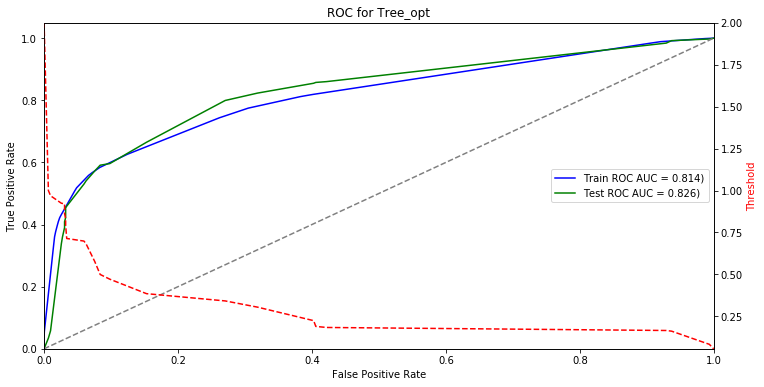

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Tree_opt,0.5,1000,569,52,155,224,0.826,0.591,0.916,0.736,0.793
Tree_opt,0.342,1000,453,168,76,303,0.764,0.799,0.729,0.764,0.756


In [75]:
plot_report(Tree_opt, 'Tree_opt', X_train, y0_train, X_test, y0_test)

**Pictre shows that classifier builds tree with 4 nodes for class 'male' and different samples number. Each node has its own condition and if it is True or False, the model splits the tree into subtrees. Gini creates split points (entropy). 'Value' means how the sample is divided, in our case sample = [female_numbers, male_nmbers]. On the picture we can see, that classifier found two classes of female doctors.**

In [76]:
features_std = list(X.columns)
from pydotplus import graph_from_dot_data
from sklearn.tree import export_graphviz

dot_data = export_graphviz(Tree_opt,
                           filled=True, 
                           rounded=True,
                           class_names=['male','female'],
                           feature_names=features_std, 
                           out_file=None) 
graph = graph_from_dot_data(dot_data)
graph.write_png('Tree_opt.png')

True

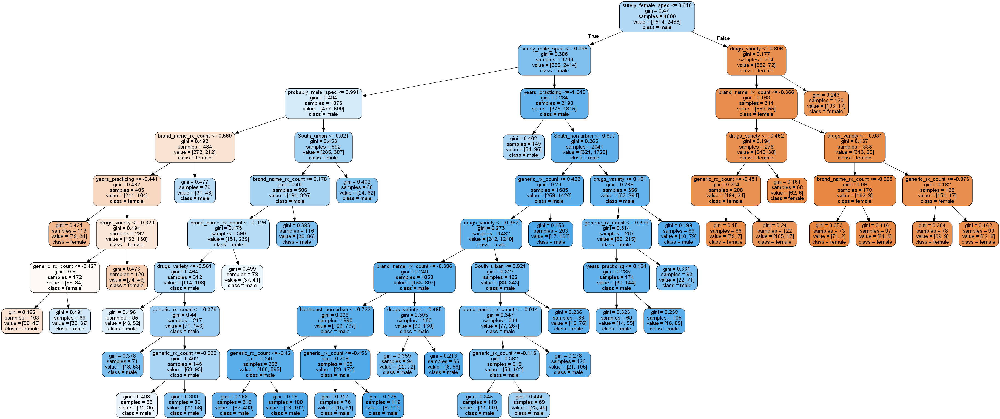

In [77]:
Image('tree-opt.png')

In [78]:
bootstraping_estimator(Tree_opt, 'Tree_opt', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
ANN_2hl_8n,0.5,28,1000,580,41,158,221,0.85,0.583,0.934,0.738,0.801
ANN_2hl_8n,0.5,487,1000,578,43,150,229,0.849,0.604,0.931,0.75,0.807
ANN_2hl_8n,0.5,687,1000,567,54,160,219,0.845,0.578,0.913,0.726,0.786
ANN_2hl_8n,0.5,800,1000,565,56,149,230,0.843,0.607,0.91,0.743,0.795
ANN_1hl_4n,0.5,897,1000,574,47,148,231,0.841,0.609,0.924,0.751,0.805
KNN,0.5,46,1000,587,34,163,216,0.84,0.57,0.945,0.734,0.803


# 5.6. Estimators quality:
<a class="anchor" id="agg_m"></a>


[<prev](#dtc) | [back to contents](#contents) | [next>](#ensembles)

In [79]:
estimators_scores = models_q.copy()
# save data
estimators_scores.to_csv('estimators_scores.csv', index=False)
# # read data
# a = pd.read_csv('estimators_scores.csv')
estimators_scores.shape

(180, 13)

### Best results by pair model & dataset (column `seed`):

In [80]:
top_10_res(models_q[models_q['ths']==.5], 'acc')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_1hl_4n,0.5,818,1000,579,42,146,233,0.84,0.615,0.932,0.757,0.812
Tree_opt,0.5,897,1000,581,40,150,229,0.77,0.604,0.936,0.752,0.81
Tree_opt,0.5,897,1000,581,40,150,229,0.834,0.604,0.936,0.752,0.81
Tree_opt,0.5,818,1000,583,38,152,227,0.769,0.599,0.939,0.75,0.81
Tree_opt,0.5,818,1000,583,38,152,227,0.823,0.599,0.939,0.75,0.81
LogReg_f,0.5,818,1000,586,35,156,223,0.832,0.588,0.944,0.745,0.809
ANN_2hl_8n,0.5,487,1000,578,43,150,229,0.849,0.604,0.931,0.75,0.807


In [81]:
top_10_res(models_q, 'g-mean')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.352,28,1000,521,100,99,280,0.789,0.739,0.839,0.787,0.801
ANN_2hl_8n,0.341,883,1000,498,123,88,291,0.785,0.768,0.802,0.785,0.789
ANN_2hl_8n,0.368,897,1000,538,83,110,269,0.788,0.71,0.866,0.784,0.807
ANN_1hl_4n,0.335,883,1000,519,102,102,277,0.783,0.731,0.836,0.782,0.796
ANN_2hl_8n,0.365,487,1000,533,88,110,269,0.784,0.71,0.858,0.781,0.802
ANN_2hl_8n,0.413,818,1000,563,58,126,253,0.787,0.668,0.907,0.778,0.816
ANN_2hl_8n,0.399,46,1000,565,56,127,252,0.787,0.665,0.91,0.778,0.817
ANN_2hl_8n,0.344,800,1000,501,120,97,282,0.775,0.744,0.807,0.775,0.783
ANN_3hl_4n,0.327,883,1000,493,128,92,287,0.776,0.757,0.794,0.775,0.78
KNN,0.323,883,1000,480,141,86,293,0.773,0.773,0.773,0.773,0.773


#### Predictions with default threshold give better `roc_auc` and `accuracy`, but worse `g-mean`.

### Detalization by models:

In [82]:
print('Metrics for predictions with threshold')
(models_q[models_q['ths'] != .5].groupby('model').describe().iloc[:,56:]\
.drop(['min','25%','50%','75%','count'], axis=1, level=1).style\
.apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc'])\
.background_gradient(cmap='Greens', subset=[('roc_auc','mean')])\
.background_gradient(cmap='Reds', subset=[('roc_auc','std')])\
.background_gradient(cmap='Greens', subset=[('sn','mean')])\
.background_gradient(cmap='Reds', subset=[('sn','std')])\
.background_gradient(cmap='Greens', subset=[('sp','mean')])\
.background_gradient(cmap='Reds', subset=[('sp','std')])\
.background_gradient(cmap='Greens', subset=[('g-mean','mean')])\
.background_gradient(cmap='Reds', subset=[('g-mean','std')])\
.background_gradient(cmap='Greens', subset=[('acc','mean')])\
.background_gradient(cmap='Reds', subset=[('acc','std')]))

Metrics for predictions with threshold


In [83]:
color_report_table(models_q)

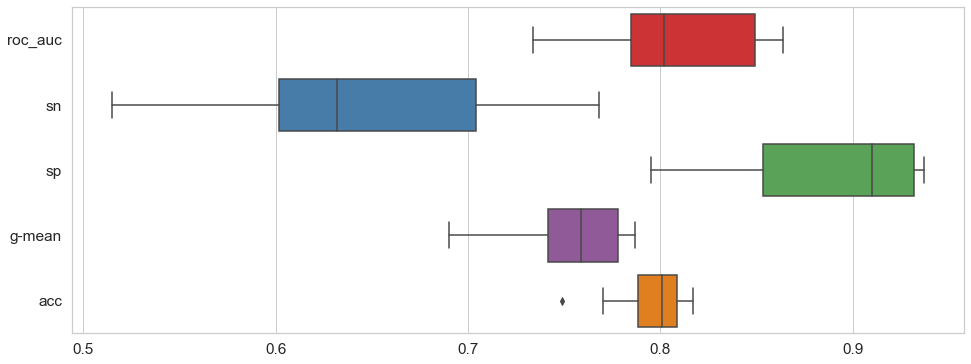

In [84]:
# set style
sns.set(font_scale=1.4)
sns.set_style("whitegrid")


# все данные по одному типу модели
plt.figure(figsize=(16,6))
ax = sns.boxplot(data=models_q[models_q['model']=='ANN_2hl_8n'].iloc[:,-5:], orient="h", palette="Set1")

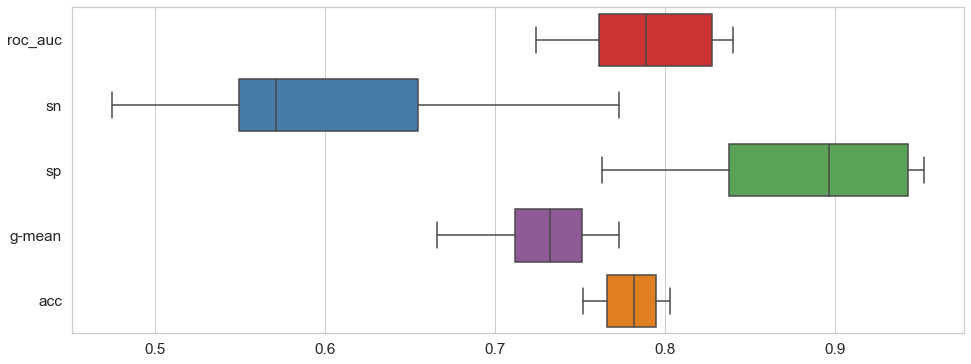

In [85]:
plt.figure(figsize=(16,6))
ax = sns.boxplot(data=models_q[models_q['model']=='KNN'].iloc[:,-5:], orient="h", palette="Set1")

### Function to display `std`:

In [86]:
# optionaly   
metrics_list = ['roc_auc', 'g-mean', 'acc']

# function
def compare_models(df, plot_name, metrics_list=metrics_list, save=False):
    
    df0 = df.copy()
    
    df0.iloc[:,-5:]  = df0.iloc[:,-5:] - list(df0.mean().values.round(3)[-5:])
    
    sns.set(font_scale=1.2)
    sns.set_style("whitegrid")
    
    fig,(ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,10))
    fig.suptitle(f'Quality metrics for {plot_name}')

    ax1.set_title(str.upper(metrics_list[0]))
    sns.boxplot(x=df0.model, y=df0[metrics_list[0]], palette="Set1", ax=ax1)
    ax2.set_title(str.upper(metrics_list[1]))
    sns.boxplot(x=df0.model, y=df0[metrics_list[1]], palette="Set1", ax=ax2)
    ax3.set_title(str.upper(metrics_list[2]))
    sns.boxplot(x=df0.model, y=df0[metrics_list[2]], palette="Set1", ax=ax3)
    
    for _ in ax1,ax2,ax3:

        _.set_xticklabels(
            _.get_xticklabels(), 
            rotation=45, 
            horizontalalignment='right',
            fontsize='x-large')
        
        _.set_ylabel(None)
        _.set_xlabel(None)

    plt.subplots_adjust(wspace=0.3)
    if save:
        plt.savefig(f'Compare {plot_name}.tiff', transparent=False, dpi=300, bbox_inches="tight")
    else: pass
    plt.show()

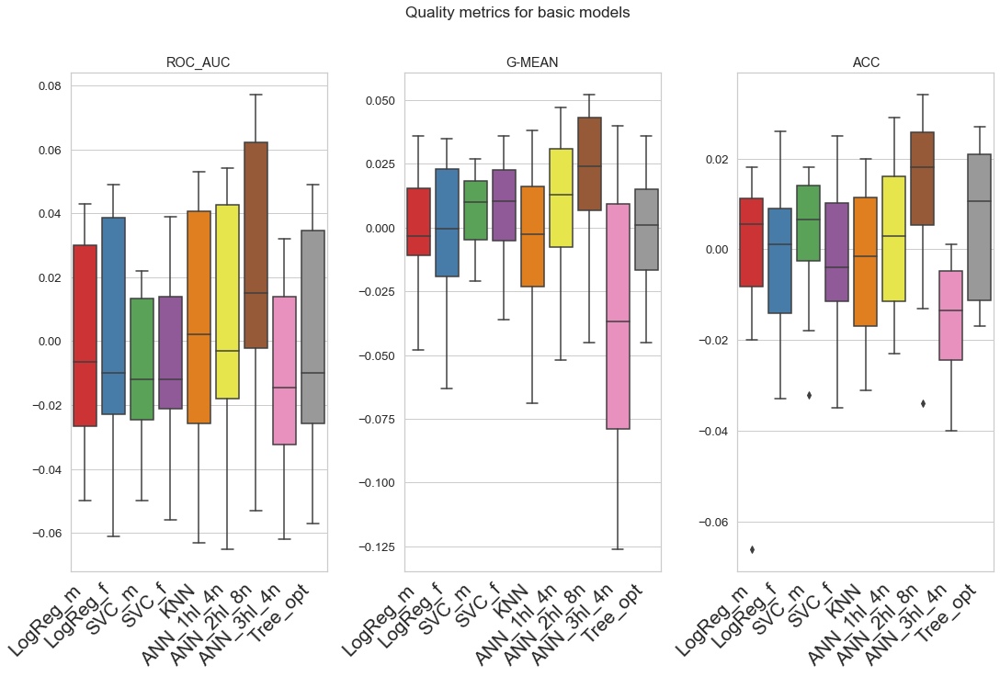

In [87]:
compare_models(models_q, 'basic models')

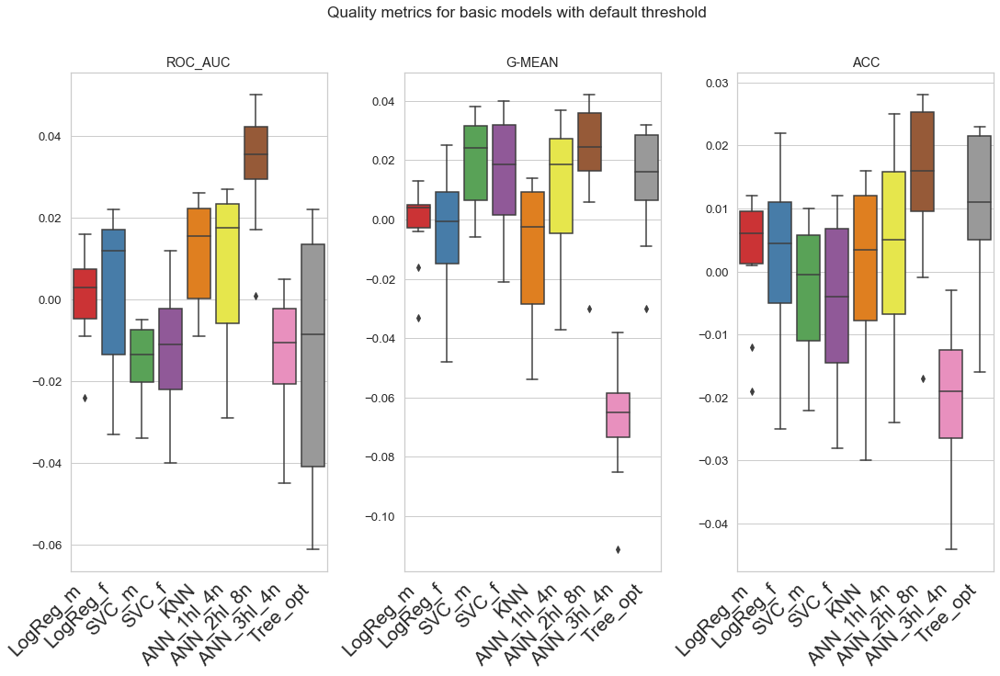

In [88]:
compare_models(models_q[models_q['ths'] == .5], 'basic models with default threshold')

We see that **Tree** has **the highest value of sensitivity (0.893701)**, but **the smallest value of specificity (0.424658)**. 

**LR** has 0.606299 value of sensitivity but higher specificity 0.671233.

**SVC** has 0.539370 value of sensitivity and **the highest specificity is 0.760274**.

**KNN** has 0.685039 value of sensitivity and 0.643836 value of specificity.

For **AUC** almost for all 4 models showed the same results, exept SVC (0.654784) and LR (0.630811), where SVC has the highest value and LR - the smallest among these models.

**AUC** provides an aggregate measure of performance across all possible classification thresholds. One way of interpreting AUC is as the probability that the model ranks a random positive example more highly than a random negative example. 

It’s important to recognize that **sensitivity and specificity** exist in a state of balance. Increased sensitivity – the ability to correctly identify people who are male — usually comes at the expense of reduced specificity (meaning more false-positives).  Likewise, high specificity — when a test does a good job of ruling out people who are female – usually means that the test has lower sensitivity (more false-negatives).
 
**The ideal result is one that has both high sensitivity and high specificity.**


**Accuracy** is one metric for evaluating classification models. Informally, accuracy is the fraction of predictions our model got right. But sometimes accuracy alone doesn't tell the full story when you're working with a class-imbalanced data set, like this one, where there is a significant disparity between the number of positive and negative labels.

# 6. Ensembles <a class="anchor" id="ensembles"></a>

[<prev](#agg_m) | [back to contents](#contents) | [next>](#bagging)



### Теорема Кондорсе «о жюри присяжных» (1784).
Если каждый член жюри присяжных имеет независимое мнение, и если вероятность правильного решения члена жюри больше 0.5, то тогда вероятность правильного решения присяжных в целом возрастает с увеличением количества членов жюри и стремится к единице. Если же вероятность быть правым у каждого из членов жюри меньше 0.5, то вероятность принятия правильного решения присяжными в целом монотонно уменьшается и стремится к нулю с увеличением количества присяжных.


$N$ — количество присяжных

$p$ — вероятность правильного решения присяжного

$μ$— вероятность правильного решения всего жюри

$m$ — минимальное большинство членов жюри, $m = \text{floor}(N/2) + 1$

$C^i_N$ - число сочетаний из $N$ по $i$

$$\large \mu = \sum_{i=m}^{N}C_N^ip^i(1-p)^{N-i}$$

Если $p>0.5$, то $\mu>p$

Если $N \rightarrow \infty$, то $\mu \rightarrow 1$

# 6.1. Bagging
<a class="anchor" id="bagging"></a>

[<prev](#agg_m) | [back to contents](#contents) | [next>](#rfc)


Беггинг - общий подход к уменьшению дисперсии алгоритма машинного обучения. Беггинг происходит от фразы bootstrap aggregation. Bootstrap - это выборка с повторением.

Беггинг использует параллельное обучение базовых классификаторов, происходит следующее:

* Из множества исходных данных случайным образом отбирается несколько подмножеств, содержащих количество примеров, соответствующее количеству примеров исходного множества.
* Поскольку отбор осуществляется случайным образом, то набор примеров всегда будет разным: некоторые примеры попадут в несколько подмножеств, а некоторые не попадут ни в одно.
* На основе каждой выборки строится классификатор.
* Выводы классификаторов агрегируются (путем голосования или усреднения).


<center>
<img src="https://miro.medium.com/max/1400/0*oElRVuPCBJavWBH5.png" style="width: 800px; display: inline" />

[SOURCE](https://medium.com/@saugata.paul1010/ensemble-learning-bagging-boosting-stacking-and-cascading-classifiers-in-machine-learning-9c66cb271674)
</center>



In [89]:
from sklearn.ensemble import BaggingClassifier
# BaggingClassifier?

[документация](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html)

**важные параметры:**

* `bootstrap_features` — для алгоритмов используется различный набор фичей;
* `max_features` — количество признаков для анализа;
* `n_estimators` — количество обучаемых базовых алгоритмов;

In [90]:
# models_dict

In [91]:
# берем за основу лучший алгоритм kNN
Bagging_KNN = BaggingClassifier(base_estimator=KNN,
                              max_features = 14,
                              bootstrap_features = True,
                              oob_score = False,
                              n_estimators=100,
                              n_jobs=-1)

Bagging_KNN.fit(X_train, y0_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=31, p=2,
           weights='uniform'),
         bootstrap=True, bootstrap_features=True, max_features=14,
         max_samples=1.0, n_estimators=100, n_jobs=-1, oob_score=False,
         random_state=None, verbose=0, warm_start=False)

Train ROC AUC: 0.846
Optimal threshold value for train set: 0.331
Test ROC AUC: 0.836
Optimal threshold value for test set: 0.355


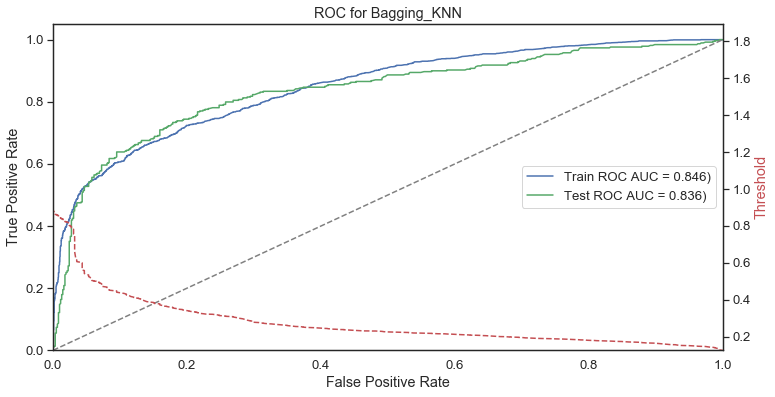

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Bagging_KNN,0.5,1000,581,40,165,214,0.836,0.565,0.936,0.727,0.795
Bagging_KNN,0.355,1000,510,111,101,278,0.777,0.734,0.821,0.776,0.788


In [92]:
sns.set_style("white")
plot_report(Bagging_KNN, 'Bagging_KNN', X_train, y0_train, X_test, y0_test)

In [93]:
# Bagging = BaggingClassifier(random_state=seed,
#                               oob_score = False,
#                               n_estimators=100, n_jobs=-1)

# # choose better by KNN and LogReg:
# Bagging_params = {'base_estimator':[KNN, LogReg_f],
#                   'max_features': list(range(7,16,2)),
#                   'bootstrap_features':[True, False]}
                
# Bagging_opt = grid_collect(Bagging,'Bagging_opt',Bagging_params, X_train, y0_train)

# BEST
Bagging_opt = BaggingClassifier(base_estimator=LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
                                  fit_intercept=True, intercept_scaling=1, max_iter=100,
                                  multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
                                  solver='warn', tol=0.0001, verbose=0, warm_start=False),
                                 bootstrap=True, bootstrap_features=False, max_features=15,
                                 max_samples=1.0, n_estimators=100, n_jobs=-1, oob_score=False,
                                 random_state=40, verbose=0, warm_start=False)

Bagging_opt.fit(X_train, y0_train)

BaggingClassifier(base_estimator=LogisticRegression(C=0.0657933224657568, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l1', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False),
         bootstrap=True, bootstrap_features=False, max_features=15,
         max_samples=1.0, n_estimators=100, n_jobs=-1, oob_score=False,
         random_state=40, verbose=0, warm_start=False)

Train ROC AUC: 0.807
Optimal threshold value for train set: 0.354
Test ROC AUC: 0.841
Optimal threshold value for test set: 0.353


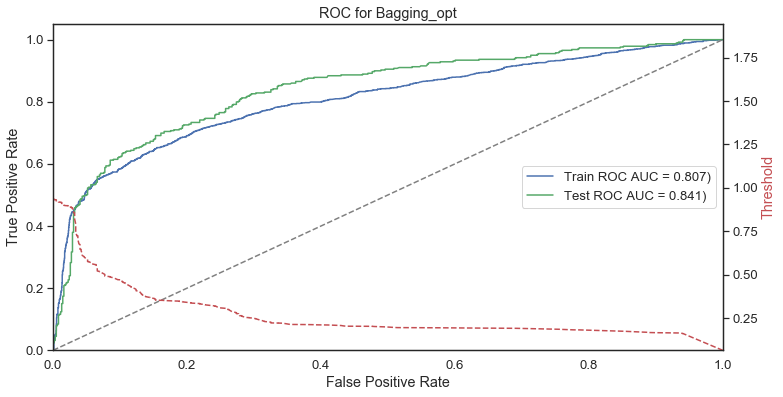

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Bagging_opt,0.5,1000,573,48,161,218,0.841,0.575,0.923,0.729,0.791
Bagging_opt,0.353,1000,518,103,112,267,0.769,0.704,0.834,0.767,0.785


In [94]:
plot_report(Bagging_opt, 'Bagging_opt', X_train, y0_train, X_test, y0_test)

In [95]:
bootstraping_estimator(Bagging_KNN, 'Bagging_KNN', X, y0)
bootstraping_estimator(Bagging_opt, 'Bagging_opt', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
Bagging_KNN,0.5,487,1000,593,28,175,204,0.856,0.538,0.955,0.717,0.797
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
Bagging_KNN,0.5,46,1000,591,30,164,215,0.853,0.567,0.952,0.735,0.806
Bagging_KNN,0.5,818,1000,590,31,160,219,0.852,0.578,0.95,0.741,0.809
Bagging_KNN,0.5,883,1000,584,37,164,215,0.851,0.567,0.94,0.73,0.799
Bagging_KNN,0.5,28,1000,594,27,176,203,0.851,0.536,0.957,0.716,0.797


## 6.2. RandomForestClassifier<a class="anchor" id="rfc"></a>

[<prev](#bagging) | [back to contents](#contents) | [next>](#boosting)

**A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement if bootstrap=True (default).**


По сути, Random Forest является композицией (ансамблем) множества решающих деревьев, что позволяет снизить проблему переобучения и повысить точность в сравнении с одним деревом. Прогноз получается в результате агрегирования ответов множества деревьев. Тренировка деревьев происходит независимо друг от друга (на разных подмножествах), что не просто решает проблему построения одинаковых деревьев на одном и том же наборе данных, но и делает этот алгоритм весьма удобным для применения в системах распределённых вычислений. Вообще, идея бэггинга, предложенная Лео Брейманом, хорошо подходит для распределения вычислений.


Для бэггинга (независимого обучения алгоритмов классификации, где результат определяется голосованием) есть смысл использовать большое количество деревьев решений с достаточно большой глубиной. Во время классификации финальным результатом будет тот класс, за который проголосовало большинство деревьев, при условии, что одно дерево обладает одним голосом.


Так, например, если в задаче бинарной классификации была сформирована модель с 500 деревьями, среди которых 100 указывают на нулевой класс, а остальные 400 на первый класс, то в результате модель будет предсказывать именно первый класс. 


Random Forest (по причине независимого построения глубоких деревьев) требует весьма много ресурсов, а ограничение на глубину повредит точности (для решения сложных задач нужно построить много глубоких деревьев). Можно заметить, что время обучения деревьев возрастает приблизительно линейно их количеству.


Естественно, увеличение высоты (глубины) деревьев не самым лучшим образом сказывается на производительности, но повышает эффективность этого алгоритма (хотя и вместе с этим повышается склонность к переобучению). Слишком сильно бояться переобучения не следует, так как это будет скомпенсировано числом деревьев. Но и увлекаться тоже не следует. Везде важны оптимально подобранные параметры (гиперпараметры).


* n_estimators — число деревьев в "лесу"
* criterion — критерий для разбиения выборки в вершине
* max_features — число признаков, по которым ищется разбиение
* min_samples_leaf — минимальное число объектов в листе
* max_depth — максимальная глубина дерева



[подробнее](https://dyakonov.org/2016/11/14/%D1%81%D0%BB%D1%83%D1%87%D0%B0%D0%B9%D0%BD%D1%8B%D0%B9-%D0%BB%D0%B5%D1%81-random-forest/)

In [96]:
from sklearn.ensemble import RandomForestClassifier
# RandomForestClassifier?

In [97]:
# RF = RandomForestClassifier(n_estimators=100,
#                               random_state=seed,
#                               n_jobs=-1)

# RF_params = {'max_depth': list(range(3,10,3)),
#              'max_features':list(range(7,17,2)),
#              'min_samples_leaf':list(range(5,96,10))}

# RF = grid_collect(RF,'RF', RF_params, X_train, y0_train)

# BEST
RF = RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                            max_depth=3, max_features=9, max_leaf_nodes=None,
                            min_impurity_decrease=0.0, min_impurity_split=None,
                            min_samples_leaf=25, min_samples_split=2,
                            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                            oob_score=False, random_state=40, verbose=0, warm_start=False)

RF.fit(X_train, y0_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=3, max_features=9, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=25, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=40, verbose=0, warm_start=False)

Feature ranking:
1. surely_female_spec (0.613061)
2. surely_male_spec (0.257216)
3. years_practicing (0.051101)
4. probably_male_spec (0.032944)
5. probably_female_spec (0.027271)
6. generic_rx_count (0.005946)
7. unisex_spec (0.004567)
8. brand_name_rx_count (0.003340)
9. drugs_variety (0.002634)
10. South_urban (0.000979)
11. South_non-urban (0.000376)
12. West_urban (0.000327)
13. West_non-urban (0.000080)
14. Midwest_urban (0.000071)
15. Midwest_non-urban (0.000059)
16. Northeast_non-urban (0.000028)
17. Northeast_urban (0.000000)


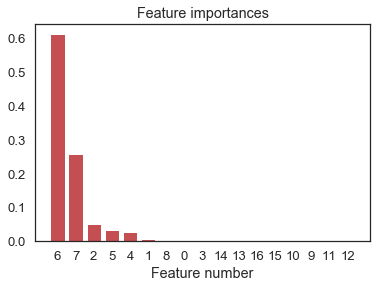

In [98]:
# get feature names
features = list(X.columns)

importances = RF.feature_importances_

std = np.std([tree.feature_importances_ for tree in RF.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. %s (%f)" % (f+1, features[indices[f]], importances[indices[f]]))


# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]),
        importances[indices],
        color="r",
        align="center")

plt.xticks(range(X_train.shape[1]), indices)
plt.xlabel('Feature number')

plt.show()

Train ROC AUC: 0.814
Optimal threshold value for train set: 0.344
Test ROC AUC: 0.838
Optimal threshold value for test set: 0.338


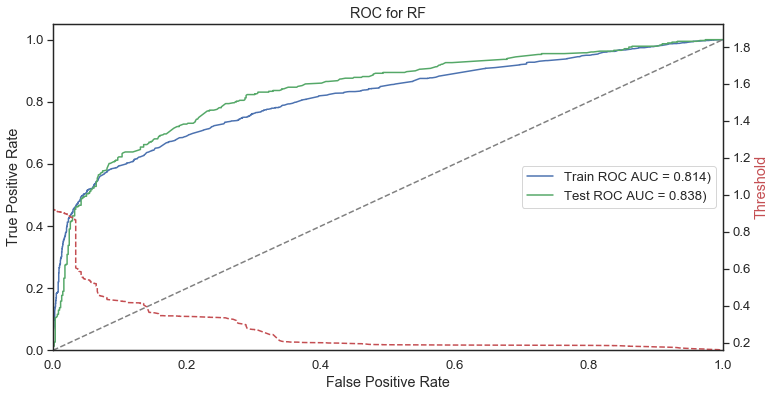

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF,0.5,1000,580,41,173,206,0.838,0.544,0.934,0.712,0.786
RF,0.338,1000,478,143,87,292,0.77,0.77,0.77,0.77,0.77


In [99]:
plot_report(RF, 'RF', X_train, y0_train, X_test, y0_test)

In [100]:
bootstraping_estimator(RF, 'RF', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
Bagging_KNN,0.5,487,1000,593,28,175,204,0.856,0.538,0.955,0.717,0.797
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
Bagging_KNN,0.5,46,1000,591,30,164,215,0.853,0.567,0.952,0.735,0.806
Bagging_KNN,0.5,818,1000,590,31,160,219,0.852,0.578,0.95,0.741,0.809
Bagging_KNN,0.5,883,1000,584,37,164,215,0.851,0.567,0.94,0.73,0.799
Bagging_KNN,0.5,28,1000,594,27,176,203,0.851,0.536,0.957,0.716,0.797


## 6.3. Boosting

<a class="anchor" id="boosting"></a>

[<prev](#rfc) | [back to contents](#contents) | [next>](#xgb)

Большинство алгоритмов бустинга состоит из итеративного обучения слабых классификаторов с целью сборки их в сильный классификатор. Когда они добавляются, им обычно приписываются некоторым образом веса, которые, обычно, связаны с точностью обучения. После того, как слабый классификатор добавлен, веса пересчитываются, что известно как «пересчёт весовых коэффициентов». Неверно классифицированные входные данные получают больший вес, а правильно классифицированные экземпляры теряют вес. Тем самым последующее слабое обучение фокусируется больше на примерах, где предыдущие слабые обучения дали ошибочную классификацию.

Бустинг над решающими деревьями считается одним из наиболее эффективных методов с точки зрения качества классификации.

На примере бустинга стало ясно, что хорошим качеством могут обладать сколь угодно сложные композиции классификаторов, при условии, что они правильно настраиваются. Это развеяло существовавшие долгое время представления о том, что для повышения обобщающей способности необходимо ограничивать сложность алгоритмов.


Впоследствии этот феномен бустинга получил теоретическое обоснование. Оказалось, что взвешенное голосование не увеличивает эффективную сложность алгоритма, а лишь сглаживает ответы базовых алгоритмов. Эффективность бустинга объясняется тем, что по мере добавления базовых алгоритмов увеличиваются отступы обучающих объектов. Причём бустинг продолжает раздвигать классы даже после достижения безошибочной классификации обучающей выборки.

**Виды:**

* Основанные на остатках
* Основанные на весах ([AdaBoostClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html?highlight=adaboostclassifier#sklearn.ensemble.AdaBoostClassifier))

## 6.3.1. AdaBoostClassifier

AdaBoost (сокращение от Adaptive Boosting), может использоваться в сочетании с несколькими алгоритмами классификации для улучшения их эффективности. Алгоритм усиливает классификаторы, объединяя их в «комитет». AdaBoost является адаптивным в том смысле, что каждый следующий комитет классификаторов строится по объектам, неверно классифицированным предыдущими комитетами. AdaBoost чувствителен к шуму в данных и выбросам. Однако он менее подвержен переобучению по сравнению с другими алгоритмами машинного обучения.


* каждому объекту изначально заданы одинаковые веса `1/n`(где `n` - количество объектов в выборке);
* далее получаем ошибку(отступ от верного ответа) базового алгоритма;
* вес объекта увеличивается экспотенциально когда алгоритм допускает на нём ошибку, и уменьшается (т.к. объект прост для классификации) во столько же раз, когда правильно классифицирует этот объект;
* в конце мы получаем композицию из голосования всех базовых алгоритмов (с весами при каждом алгоитме).


**На картинке ниже `+` и `—` становятся крупнее при направленном на них витке обучения:**

<center><img src="https://static.packt-cdn.com/products/9781789953633/graphics/23c1ad86-604f-439f-9597-73c645e41a74.png" style="width: 600px; display: inline" /></center>

**Параметры бустинга:**

* learning rate — как сильно мы доверяем модели? Умножаем lr на вес.
* Количество моделей. Чем больше моделей, тем ниже lr.
* Тип входных моделей — любая, которая принимает веса.

In [101]:
from sklearn.ensemble import AdaBoostClassifier
AdaBoostClassifier?

#### base_estimator

In [102]:
# # в качестве алгоритма можно указать свою модель, через параметр base_estimator
# Ada = AdaBoostClassifier(n_estimators=100, random_state=seed)

# Ada_params = {'base_estimator':[None, LogReg_f],
#               'n_estimators':[25,50,60,75,100],
#                'learning_rate': [.01, .05, .09, .3, .4, .5, .6, .7, .8, .85, .9, .95, 1, 1.05, 1.1]}

# # назначаем алгоритм кроссвалидации
# Ada_opt = grid_collect(Ada, 'Ada_opt', Ada_params, X_train, y0_train)

# BEST
Ada_opt = AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
                              learning_rate=0.09, n_estimators=100, random_state=40)
    
Ada_opt.fit(X_train, y0_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=0.09, n_estimators=100, random_state=40)

Train ROC AUC: 0.809
Optimal threshold value for train set: 0.484
Test ROC AUC: 0.838
Optimal threshold value for test set: 0.490


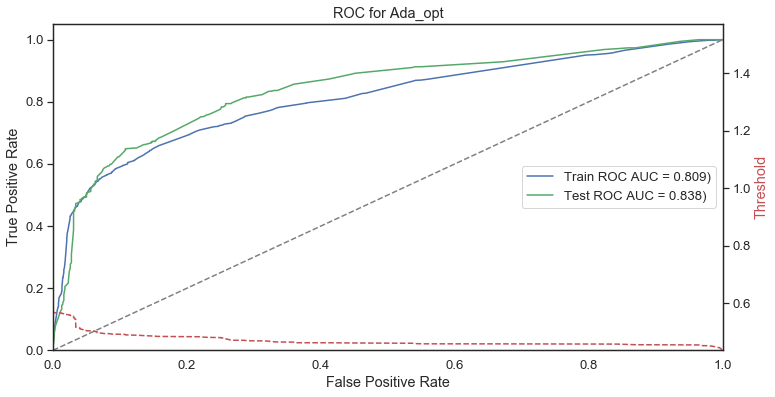

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
Ada_opt,0.5,1000,580,41,172,207,0.838,0.546,0.934,0.714,0.787
Ada_opt,0.49,1000,554,67,133,246,0.771,0.649,0.892,0.761,0.8


In [103]:
plot_report(Ada_opt, 'Ada_opt', X_train, y0_train, X_test, y0_test)

In [104]:
bootstraping_estimator(Ada_opt, 'Ada_opt', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
Bagging_KNN,0.5,487,1000,593,28,175,204,0.856,0.538,0.955,0.717,0.797
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
Bagging_KNN,0.5,46,1000,591,30,164,215,0.853,0.567,0.952,0.735,0.806
Bagging_KNN,0.5,818,1000,590,31,160,219,0.852,0.578,0.95,0.741,0.809
Bagging_KNN,0.5,883,1000,584,37,164,215,0.851,0.567,0.94,0.73,0.799
Bagging_KNN,0.5,28,1000,594,27,176,203,0.851,0.536,0.957,0.716,0.797


## 6.3.2. XGBClassifier
<a class="anchor" id="xgb"></a>

[<prev](#boosting) | [back to contents](#contents) | [next>](#q2)

* Принцип работы Градиентный Бустинга (всех видов его подвидов) очень похож на рассмотренный только что `AdaBoost`. Градиентный Бустинг работает последовательно добавляя к прошлым моделям новые так, чтобы исправлялись ошибки, допущенные предыдущими предикторами.

* Градиентный Бустинг отличается от Адаптивного тем, что, в отличие от AdaBoost, изменяющего веса при каждой итерации, Градиентный пытается обучать новые модели по остаточной ошибке прошлых (двигаясь к минимуму функции потерь).

#### Шаги реализации Градиентного Бустинга:
1. Модель строится по подборке данных.
2. Эта модель делает предсказания для всего набора данных.
3. По предсказаниям и истинным значениям вычисляются ошибки.
4. Новая модель строится с учетом ошибок как целевых переменных. При этом мы стремимся найти лучшее разделение для минимизации ошибки.
5. Предсказания, сделанные с помощью этой новой модели, сочетаются с предсказаниями предыдущих.
6. Снова вычисляются ошибки с использованием этих предсказанных значений и истинных значений.
7. Этот процесс повторяется, пока функция ошибки не перестанет меняться или пока не будет достигнуто максимальное число предикторов.


#### Экстремальный Градиентный Бустинг (`XGBoost`) - это продвинутая реализация Градиентного Бустинга. Этот алгоритм обладает высокой предсказательной способностью и в десять раз быстрее любых других методов градиентного бустинга. Кроме того, включает в себя различные регуляризации, что уменьшает переобучение и улучшает общую производительность.

#### Преимущества:
* Осуществляет регуляризацию, что помогает бороться с переобучением.
* Возможно распараллеливание, что делает его намного быстрее Градиентного Бустинга.
* Позволяет пользователю определить собственные цели оптимизации и критерии оценки, добавляя измерения в модель.
* Имеет встроенную подпрограмму для обработки пропущенных значений.
* Находит разделения до заданной максимальной глубины, а затем начинает обрезать дерево и удалять разделения, после которых нет положительных выводов.
* Позволяет производить кросс-валидацию на каждой итерации бустинга и следовательно облегчает вычисление оптимального числа итераций бустинга.

In [105]:
from xgboost import XGBClassifier
# XGBClassifier?

In [106]:
# XGB = XGBClassifier(n_jobs=-1, random_state=seed)

# XGB_params = {'max_depth':[3,5,7,9,11,13,15],
#               'n_estimators':[40,60,80,100,120,140],
#                'learning_rate': [0.001,0.005,0.06,0.03,0.01,0.1,0.2,0.3,0.8]}

# XGB = grid_collect(XGB, 'XGB', XGB_params, X_train, y0_train)


# BEST
XGB = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.03,
                       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
                       n_estimators=80, n_jobs=-1, nthread=None,
                       objective='binary:logistic', random_state=40, reg_alpha=0,
                       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
                       subsample=1, verbosity=1)

XGB.fit(X_train, y0_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.03,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=80, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=40, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

Train ROC AUC: 0.813
Optimal threshold value for train set: 0.342
Test ROC AUC: 0.836
Optimal threshold value for test set: 0.342


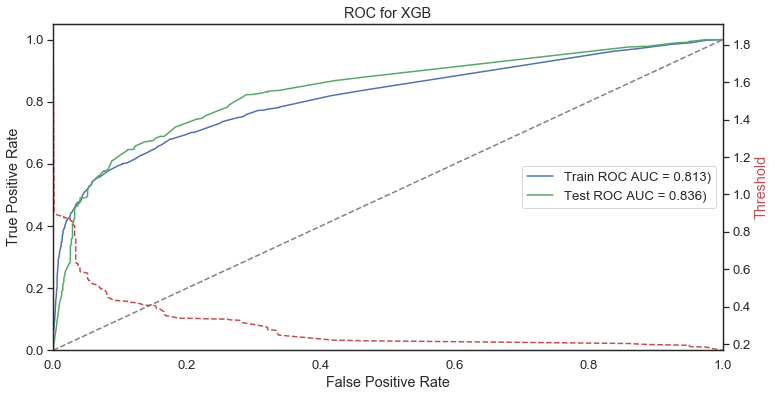

model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
XGB,0.5,1000,578,43,166,213,0.836,0.562,0.931,0.723,0.791
XGB,0.342,1000,507,114,106,273,0.768,0.72,0.816,0.767,0.78


In [107]:
plot_report(XGB, 'XGB', X_train, y0_train, X_test, y0_test)

In [108]:
bootstraping_estimator(XGB, 'XGB', X, y0)

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
Bagging_KNN,0.5,487,1000,593,28,175,204,0.856,0.538,0.955,0.717,0.797
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815
Bagging_KNN,0.5,46,1000,591,30,164,215,0.853,0.567,0.952,0.735,0.806
Bagging_KNN,0.5,818,1000,590,31,160,219,0.852,0.578,0.95,0.741,0.809
Bagging_KNN,0.5,883,1000,584,37,164,215,0.851,0.567,0.94,0.73,0.799
Bagging_KNN,0.5,28,1000,594,27,176,203,0.851,0.536,0.957,0.716,0.797


## 6.4. Ensembles quality:
<a class="anchor" id="q2"></a>

[<prev](#xgb) | [back to contents](#contents) | [next>](#ce)

In [109]:
all_estimators_scores = models_q.copy()
# save
all_estimators_scores.to_csv('all_estimators_scores.csv', index=False)

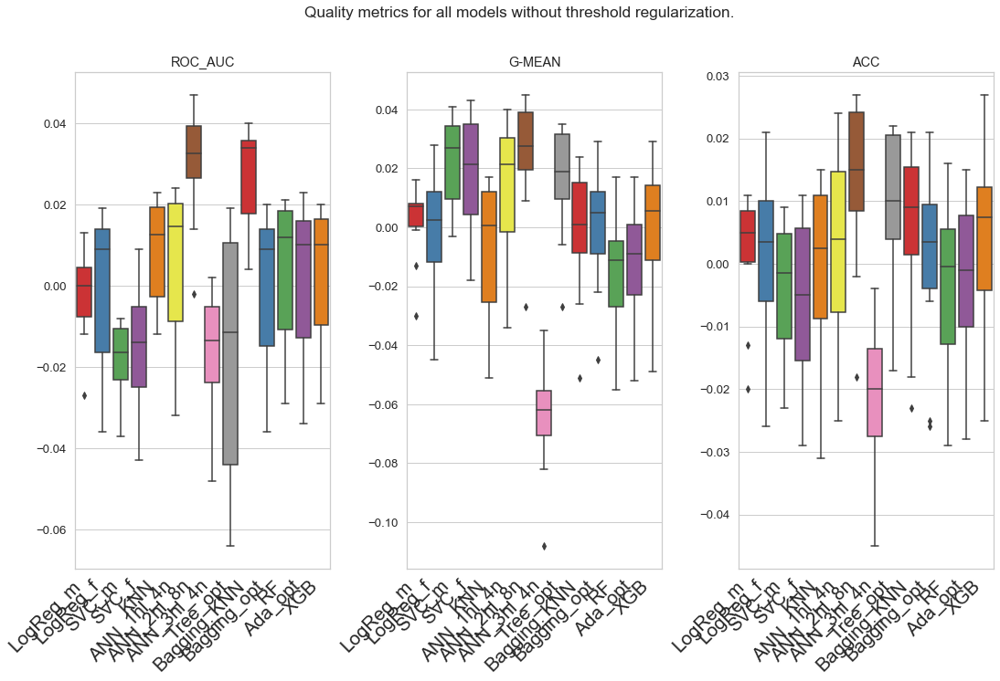

In [110]:
# set grid
compare_models(all_estimators_scores[all_estimators_scores['ths']==.5],
               'all models without threshold regularization.',
               save=False)

In [111]:
# optionaly add any model to list
bad_models = ['LogReg_m', 'SVC_m', 'ANN_1hl_4n', 'ANN_3hl_4n', 'Bagging_opt', 'Ada_opt']

# save new data to `c`
c = all_estimators_scores.query('model not in @bad_models')

# subtract means for last 5 columns and rewrite `c`: 
c.iloc[:,-5:]  = c.iloc[:,-5:] - list(c.mean().values.round(3)[-5:])

C:\Users\Asus\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


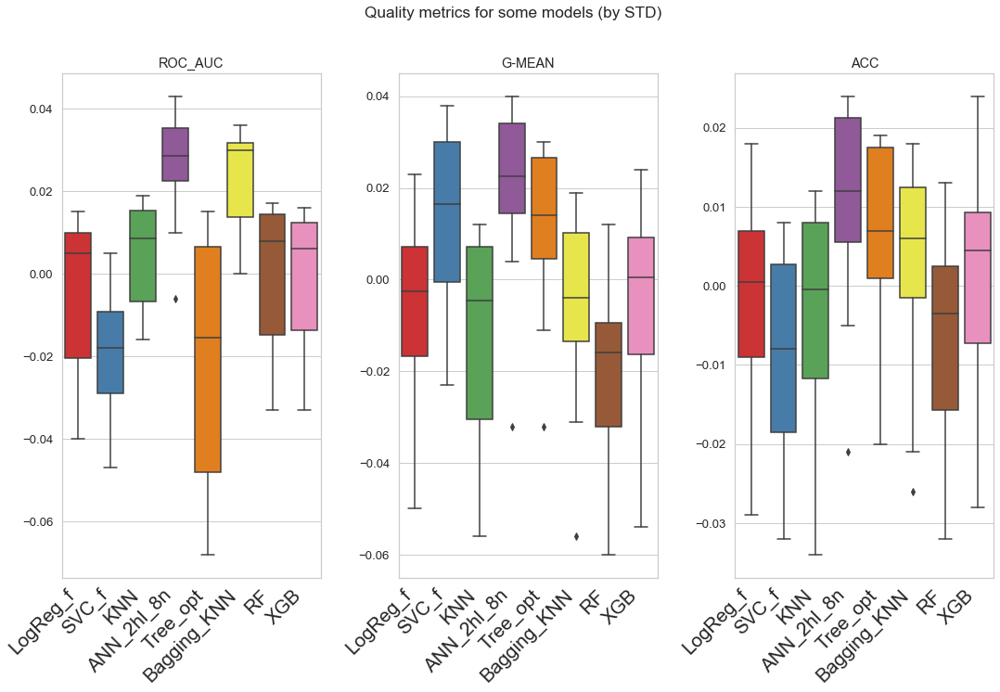

In [112]:
compare_models(c[c['ths'] == .5], 'some models (by STD)', save=False)

### Sorted by mean `roc_auc`:

In [113]:
all_estimators_scores.groupby('model').roc_auc.describe().iloc[:40,:].sort_values(by='mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
model,,,,,,,,
ANN_2hl_8n,20.0,0.81120,0.040156,0.734,0.78475,0.8020,0.84925,0.864
Bagging_KNN,20.0,0.80625,0.041186,0.741,0.77550,0.8035,0.85100,0.857
ANN_1hl_4n,20.0,0.79230,0.036712,0.722,0.76900,0.7840,0.82975,0.841
KNN,20.0,0.78965,0.039752,0.724,0.76125,0.7890,0.82775,0.840
XGB,20.0,0.78895,0.036056,0.728,0.76500,0.7830,0.82500,0.837
RF,20.0,0.78880,0.037155,0.730,0.76275,0.7820,0.82700,0.838
Ada_opt,20.0,0.78735,0.036927,0.730,0.76400,0.7780,0.82550,0.840
LogReg_f,20.0,0.78650,0.036002,0.726,0.76425,0.7770,0.82550,0.836
Bagging_opt,20.0,0.78620,0.036592,0.727,0.76300,0.7765,0.82600,0.837


In [114]:
# with default threshold:
all_estimators_scores[all_estimators_scores['ths'] == .5]\
.groupby('model').roc_auc.describe().iloc[:40,:].sort_values(by='mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
model,,,,,,,,
ANN_2hl_8n,10.0,0.847100,0.014933,0.815,0.84350,0.8495,0.85625,0.864
Bagging_KNN,10.0,0.843800,0.013155,0.821,0.83475,0.8510,0.85275,0.857
KNN,10.0,0.825300,0.013565,0.805,0.81425,0.8295,0.83625,0.840
ANN_1hl_4n,10.0,0.823000,0.019322,0.785,0.80825,0.8315,0.83725,0.841
RF,10.0,0.820500,0.019682,0.788,0.80625,0.8290,0.83550,0.838
XGB,10.0,0.819400,0.018881,0.788,0.80725,0.8270,0.83350,0.837
Ada_opt,10.0,0.818700,0.020232,0.783,0.80425,0.8270,0.83300,0.840
Bagging_opt,10.0,0.817200,0.020115,0.781,0.80225,0.8260,0.83100,0.837
LogReg_f,10.0,0.816700,0.020385,0.781,0.80050,0.8260,0.83100,0.836


In [115]:
color_report_table(c)

# 7. Custom ensemble based on stacking
<a class="anchor" id="ce"></a>

[<prev](#q2) | [back to contents](#contents)

## 7.1. Blending idea

<a class="anchor" id="blending"></a>

[back to contents](#contents)


Главная идея - почему ансамблирование моделей делается таким простым способом, как усреднение оценок? Что если доверить это делому другому алгоритму машинного обучения?

Простейшая схема стекинга — блендинг (Blending): обучающую выборку делят на две части. На первой обучают базовые алгоритмы. Затем получают их ответы на второй части и на тестовой выборке. Понятно, что  ответ каждого алгоритма можно рассматривать как новый признак (т.н. «метапризнак»). На метапризнаках второй части обучения настраивают метаалгоритм. Затем запускают его на метапризнаках теста и получают ответ.


Основной недостаток - деление обучающей выборки. Никакой из алгоритмов не использует всех данных для обучения.

<img src="https://alexanderdyakonov.files.wordpress.com/2017/03/stacking.png?w=700" style="max-width: 800px; display: inline" />

## 7.2. Create custom ensemble

<a class="anchor" id="stack"></a>

[back to contents](#contents)

### Ансамбль алгоритмов, в основе которого лежит метод `staking`

1. Выборку разбиваем на фолды
2. затем последовательно перебираем фолды и обучаем базовые алгоритмы на всех фолдах, кроме одного
3. на оставшемся получаем ответы базовых алгоритмов и трактуем их как значения соответствующих признаков на этом фолде.
4. Для получения метапризнаков объектов тестовой выборки базовые алгоритмы обучают на всей обучающей выборке и берут их ответы на тестовой.

<img src="https://alexanderdyakonov.files.wordpress.com/2017/03/stacking-2b.png?w=700" style="width: 800px; display: inline" />

### В процессе работы собрали предсказания в таблицы (тренировочные и тестовые данные на всей выборке и ответы моделей при кросс-валидации.

In [123]:
# # save
# test_preds_df.to_csv('test_preds_df.csv', index=False)
# train_preds_df.to_csv('train_preds_df.csv', index=False)
# test_boots_preds_df.to_csv('test_boots_preds_df.csv', index=False)

# # read
# test_preds_df = pd.read_csv('test_preds_df.csv')
# train_preds_df = pd.read_csv('train_preds_df.csv')
# test_boots_preds_df = pd.read_csv('test_boots_preds_df.csv')

#### Посмотрим на базу ответов к тестовой выборке:

In [116]:
test_preds_df.describe()

,LogReg_0,LogReg_m,SVC_0,SVC_m,KNN,ANN_1hl_4n,ANN_2hl_8n,ANN_3hl_4n,Tree_def,Tree_2,Tree_opt,Bagging_KNN,Bagging_opt,RF,Ada_opt,XGB
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.606436,0.603762,0.609297,0.608933,0.384613,0.392594,0.392892,0.376878,0.407510,0.392081,0.395227,0.387445,0.397032,0.391329,0.487636,0.399510
std,0.284527,0.278465,0.257029,0.265885,0.288205,0.291583,0.312476,0.114293,0.483766,0.300096,0.293088,0.240067,0.273500,0.269861,0.038597,0.253965
min,0.045426,0.052149,0.189629,0.204372,0.032258,0.038893,0.001045,0.272661,0.000000,0.000000,0.057143,0.125806,0.066269,0.158105,0.436347,0.166925
25%,0.459422,0.476997,0.243884,0.234078,0.161290,0.178479,0.155944,0.291532,0.000000,0.170732,0.166225,0.204113,0.193769,0.186440,0.458686,0.203355
50%,0.767480,0.750559,0.798439,0.795651,0.258065,0.241950,0.285297,0.309285,0.000000,0.272727,0.305195,0.277097,0.248249,0.269368,0.468997,0.296726
75%,0.814748,0.809308,0.803541,0.810576,0.516129,0.558085,0.596285,0.455357,1.000000,0.577778,0.576923,0.501210,0.528345,0.480925,0.498508,0.512287
max,0.969817,0.932665,0.843316,0.820281,1.000000,0.975494,0.990708,0.628329,1.000000,1.000000,1.000000,0.893548,0.941929,0.923673,0.569704,0.910859


#### Добавим значения для `LogReg_f` и `SVC_f`, тк они пропущены:

In [117]:
plot_report(LogReg_f, 'LogReg_f', X_train, y0_train, X_test, y0_test, img=False)
plot_report(SVC_f, 'SVC_f', X_train, y0_train, X_test, y0_test, img=False)

Train ROC AUC: 0.807
Optimal threshold value for train set: 0.353
Test ROC AUC: 0.842
Optimal threshold value for test set: 0.353
Train ROC AUC: 0.799
Optimal threshold value for train set: 0.695
Test ROC AUC: 0.807
Optimal threshold value for test set: 0.261


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
SVC_f,0.5,1000,540,81,129,250,0.807,0.66,0.87,0.757,0.79
SVC_f,0.261,1000,517,104,111,268,0.77,0.707,0.833,0.767,0.785


In [121]:
# меняю порядок колонок столбцов, чтобы он был одинаоквы в 3-х базах данных.

cols = test_preds_df.columns.tolist()
cols = cols[-2:] + cols[:-2]
test_preds_df = test_preds_df[cols]

cols2 = train_preds_df.columns.tolist()
cols2 = cols2[-2:] + cols2[:-2]
train_preds_df = train_preds_df[cols2]

In [121]:
train_preds_df.shape

(4000, 18)

In [125]:
list(train_preds_df.columns)

['LogReg_f',
 'SVC_f',
 'LogReg_0',
 'LogReg_m',
 'SVC_0',
 'SVC_m',
 'KNN',
 'ANN_1hl_4n',
 'ANN_2hl_8n',
 'ANN_3hl_4n',
 'Tree_def',
 'Tree_2',
 'Tree_opt',
 'Bagging_KNN',
 'Bagging_opt',
 'RF',
 'Ada_opt',
 'XGB']

#### Тоже самое для оценки моделей при кросс-валидации, но в таблице значительно больше колонок, для каждой из 10- выборок:

In [126]:
test_boots_preds_df.shape

(1000, 140)

### Сделаем несколько наборов признаков на основе ответов алгоритмов:

In [127]:
# 1

X_meta_train = train_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                         'Tree_def','Tree_2','Bagging_opt','Ada_opt'])
X_meta_test = test_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                         'Tree_def','Tree_2','Bagging_opt','Ada_opt'])


# 2

X_meta_train2 = train_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'KNN', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                         'Tree_def','Tree_2', 'Tree_opt', 'Bagging_opt','Ada_opt', 'XGB'])
X_meta_test2 = test_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'KNN', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                         'Tree_def','Tree_2', 'Tree_opt', 'Bagging_opt','Ada_opt', 'XGB'])

# 3

X_meta_train3 = train_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                            'Tree_def','Tree_2', 'Tree_opt','Bagging_opt',
                                            'Ada_opt', 'Bagging_KNN', 'RF', 'XGB'])
X_meta_test3 = test_preds_df.drop(columns=['LogReg_0', 'LogReg_m', 'SVC_0', 'SVC_m', 'ANN_1hl_4n', 'ANN_3hl_4n',
                                            'Tree_def','Tree_2', 'Tree_opt','Bagging_opt',
                                            'Ada_opt', 'Bagging_KNN', 'RF', 'XGB'])


print(list(X_meta_train.columns), X_meta_test.shape,
      list(X_meta_train2.columns), X_meta_test2.shape,
      list(X_meta_train3.columns), X_meta_test3.shape, sep='\n')

['LogReg_f', 'SVC_f', 'KNN', 'ANN_2hl_8n', 'Tree_opt', 'Bagging_KNN', 'RF', 'XGB']
(1000, 8)
['LogReg_f', 'SVC_f', 'ANN_2hl_8n', 'Bagging_KNN', 'RF']
(1000, 5)
['LogReg_f', 'SVC_f', 'KNN', 'ANN_2hl_8n']
(1000, 4)


In [128]:
from xgboost import XGBClassifier
# XGBClassifier?

XGB_Meta = XGBClassifier(max_depth=3, n_jobs=-1, n_estimators=100)
XGB_Meta.fit(X_meta_train, y0_train)

sns.set_style("white")
plot_report(XGB_Meta, 'XGB_meta', X_meta_train, y0_train, X_meta_test, y0_test, img=False)

Train ROC AUC: 0.891
Optimal threshold value for train set: 0.362
Test ROC AUC: 0.803
Optimal threshold value for test set: 0.423


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
XGB_meta,0.5,1000,551,70,154,225,0.803,0.594,0.887,0.726,0.776
XGB_meta,0.423,1000,525,96,130,249,0.751,0.657,0.845,0.745,0.774


In [129]:
XGB_Meta2 = XGBClassifier(max_depth=3, n_jobs=-1, n_estimators=100)
XGB_Meta2.fit(X_meta_train2, y0_train)
plot_report(XGB_Meta2, 'XGB_meta2', X_meta_train2, y0_train, X_meta_test2, y0_test, img=False)

Train ROC AUC: 0.889
Optimal threshold value for train set: 0.359
Test ROC AUC: 0.806
Optimal threshold value for test set: 0.415


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
XGB_meta2,0.5,1000,548,73,156,223,0.806,0.588,0.882,0.721,0.771
XGB_meta2,0.415,1000,523,98,129,250,0.751,0.66,0.842,0.745,0.773


In [130]:
XGB_Meta3 = XGBClassifier(max_depth=3, n_jobs=-1, n_estimators=100)
XGB_Meta3.fit(X_meta_train3, y0_train)
plot_report(XGB_Meta3, 'XGB_meta3', X_meta_train3, y0_train, X_meta_test3, y0_test, img=False)

Train ROC AUC: 0.875
Optimal threshold value for train set: 0.380
Test ROC AUC: 0.801
Optimal threshold value for test set: 0.323


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
XGB_meta3,0.5,1000,542,79,155,224,0.801,0.591,0.873,0.718,0.766
XGB_meta3,0.323,1000,465,156,89,290,0.757,0.765,0.749,0.757,0.755


In [131]:
# стэкинг с LogisticRegression
# 1

# from sklearn.linear_model import LogisticRegression

# назначаем алгоритм
LogReg = LogisticRegression(random_state=seed)
# назначаем параметры
LogReg_params = {"C":np.logspace(-3,2,100), "penalty":["l1","l2"]}

LogReg_meta = grid_collect(LogReg, 'LogReg_meta', LogReg_params,  X_meta_train, y0_train)

plot_report(LogReg_meta, 'LogReg_meta', X_meta_train, y0_train, X_meta_test, y0_test, img=False)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    9.7s finished


Best AUC: 0.874643531690184, with estimtor:
LogisticRegression(C=70.54802310718645, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)
Train ROC AUC: 0.875
Optimal threshold value for train set: 0.329
Test ROC AUC: 0.804
Optimal threshold value for test set: 0.499


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_meta,0.5,1000,548,73,146,233,0.804,0.615,0.882,0.737,0.781
LogReg_meta,0.499,1000,548,73,145,234,0.75,0.617,0.882,0.738,0.782


In [132]:
# 2
LogReg_meta2 = grid_collect(LogReg, 'LogReg_meta2', LogReg_params,  X_meta_train2, y0_train)
plot_report(LogReg_meta2, 'LogReg_meta2', X_meta_train2, y0_train, X_meta_test2, y0_test, img=False)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    3.6s finished


Best AUC: 0.871117029566419, with estimtor:
LogisticRegression(C=27.825594022071257, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)
Train ROC AUC: 0.871
Optimal threshold value for train set: 0.365
Test ROC AUC: 0.803
Optimal threshold value for test set: 0.435


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_meta2,0.5,1000,552,69,154,225,0.803,0.594,0.889,0.726,0.777
LogReg_meta2,0.435,1000,534,87,138,241,0.748,0.636,0.86,0.739,0.775


In [133]:
# 3
LogReg_meta3 = grid_collect(LogReg, 'LogReg_meta3', LogReg_params,  X_meta_train3, y0_train)
plot_report(LogReg_meta3, 'LogReg_meta3', X_meta_train3, y0_train, X_meta_test3, y0_test, img=False)

Fitting 3 folds for each of 200 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    1.9s finished


Best AUC: 0.8586413029090827, with estimtor:
LogisticRegression(C=2.71858824273294, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='warn', n_jobs=None, penalty='l2', random_state=40,
          solver='warn', tol=0.0001, verbose=0, warm_start=False)
Train ROC AUC: 0.858
Optimal threshold value for train set: 0.373
Test ROC AUC: 0.799
Optimal threshold value for test set: 0.308


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
LogReg_meta3,0.5,1000,557,64,159,220,0.799,0.58,0.897,0.722,0.777
LogReg_meta3,0.308,1000,464,157,96,283,0.747,0.747,0.747,0.747,0.747


In [134]:
# get feature names
features = list(X_meta_train.columns)

#create dictionary
LR_coefs = dict(zip(features, LogReg_meta.coef_[0]))
LR_coefs = sorted(LR_coefs.items(), key=lambda x: x[1], reverse=True)
LR_coefs

[('Bagging_KNN', 18.154981479049276),
 ('ANN_2hl_8n', 4.549544606337891),
 ('XGB', 2.532053376488057),
 ('Tree_opt', 1.971029407553981),
 ('SVC_f', -1.1133595750949599),
 ('KNN', -3.8097903311413313),
 ('RF', -6.311703697223779),
 ('LogReg_f', -7.7560680140887905)]

In [135]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier(n_estimators=100,
                              random_state=seed,
                              n_jobs=-1)

RF_params = {'max_depth': list(range(3,10,2)),
             'max_features':list(range(1,8,1)),
             'min_samples_leaf':list(range(5,96,10))}

RF_meta = grid_collect(RF,'RF_meta', RF_params, X_meta_train, y0_train)
plot_report(RF_meta, 'RF_meta', X_meta_train, y0_train, X_meta_test, y0_test, img=False)

Fitting 3 folds for each of 280 candidates, totalling 840 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 840 out of 840 | elapsed:  1.7min finished


Best AUC: 0.8666201652413812, with estimtor:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features=7, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=55, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=40, verbose=0, warm_start=False)
Train ROC AUC: 0.882
Optimal threshold value for train set: 0.370
Test ROC AUC: 0.811
Optimal threshold value for test set: 0.399


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF_meta,0.5,1000,553,68,158,221,0.811,0.583,0.89,0.721,0.774
RF_meta,0.399,1000,523,98,127,252,0.754,0.665,0.842,0.748,0.775


In [136]:
# 2
RF_params = {'max_depth': list(range(3,10,2)),
             'max_features':list(range(1,5,1)),
             'min_samples_leaf':list(range(5,96,10))}

RF_meta2 = grid_collect(RF,'RF_meta', RF_params, X_meta_train2, y0_train)
plot_report(RF_meta2, 'RF_meta2', X_meta_train2, y0_train, X_meta_test2, y0_test, img=False)

Fitting 3 folds for each of 160 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed:   56.8s finished


Best AUC: 0.8666078786898068, with estimtor:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features=4, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=25, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=40, verbose=0, warm_start=False)
Train ROC AUC: 0.884
Optimal threshold value for train set: 0.359
Test ROC AUC: 0.809
Optimal threshold value for test set: 0.362


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF_meta2,0.5,1000,551,70,159,220,0.809,0.58,0.887,0.718,0.771
RF_meta2,0.362,1000,496,125,107,272,0.758,0.718,0.799,0.757,0.768


In [137]:
# 3
RF_params = {'max_depth': list(range(3,10,2)),
             'max_features':list(range(1,4,1)),
             'min_samples_leaf':list(range(5,96,10))}

RF_meta3 = grid_collect(RF,'RF_meta3', RF_params, X_meta_train3, y0_train)
plot_report(RF_meta3, 'RF_meta3', X_meta_train3, y0_train, X_meta_test3, y0_test, img=False)

Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed:   38.8s finished


Best AUC: 0.8554498781486588, with estimtor:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=3, max_features=3, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=35, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=40, verbose=0, warm_start=False)
Train ROC AUC: 0.861
Optimal threshold value for train set: 0.361
Test ROC AUC: 0.813
Optimal threshold value for test set: 0.345


model,ths,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF_meta3,0.5,1000,552,69,159,220,0.813,0.58,0.889,0.718,0.772
RF_meta3,0.345,1000,500,121,106,273,0.763,0.72,0.805,0.762,0.773


### Все модели переобучаются. Выберем лучшее соотношение качества на тренировочных и тестовых данных - `RF_meta3`.


### Собираем ответы `cv_seed` в комплекты признаков, но оставим 4-признкака: `LogReg`, `SVC`, `KNN`, `Artificial Neural Network`. Нам важно выбрать ответы наиболее различных по поведению алгоритмов.

In [138]:
cv_seed

[883, 28, 389, 687, 672, 800, 818, 897, 46, 487]

#### соберем все названия колонок в список списков:

In [141]:
seed_cols = [c for c in test_boots_preds_df.columns if 'KNN' in c or 'ANN_2hl_8n' in c\
             or 'LogReg_f' in c or 'SVC_f' in c]
test_boots_preds_df[seed_cols].columns.values

array(['LogReg_f_883', 'LogReg_f_28', 'LogReg_f_389', 'LogReg_f_687',
       'LogReg_f_672', 'LogReg_f_800', 'LogReg_f_818', 'LogReg_f_897',
       'LogReg_f_46', 'LogReg_f_487', 'SVC_f_883', 'SVC_f_28',
       'SVC_f_389', 'SVC_f_687', 'SVC_f_672', 'SVC_f_800', 'SVC_f_818',
       'SVC_f_897', 'SVC_f_46', 'SVC_f_487', 'KNN_883', 'KNN_28',
       'KNN_389', 'KNN_687', 'KNN_672', 'KNN_800', 'KNN_818', 'KNN_897',
       'KNN_46', 'KNN_487', 'ANN_2hl_8n_883', 'ANN_2hl_8n_28',
       'ANN_2hl_8n_389', 'ANN_2hl_8n_687', 'ANN_2hl_8n_672',
       'ANN_2hl_8n_800', 'ANN_2hl_8n_818', 'ANN_2hl_8n_897',
       'ANN_2hl_8n_46', 'ANN_2hl_8n_487', 'Bagging_KNN_883',
       'Bagging_KNN_28', 'Bagging_KNN_389', 'Bagging_KNN_687',
       'Bagging_KNN_672', 'Bagging_KNN_800', 'Bagging_KNN_818',
       'Bagging_KNN_897', 'Bagging_KNN_46', 'Bagging_KNN_487'],
      dtype=object)

#### создадим список и таблиц `pandas`, в каждой из которых будут ответы для опеределенной выборки:

In [142]:
boosting_dfs = []
for s in cv_seed:
    boosting_dfs.append(test_boots_preds_df[seed_cols].iloc[:,:-10].filter(regex=f'{s}$',axis=1).columns.tolist())
    
boosting_dfs[:]

In [144]:
test_boots_preds_df[boosting_dfs[0]].head(7)

,LogReg_f_883,SVC_f_883,KNN_883,ANN_2hl_8n_883
0,0.171637,0.194035,0.032258,0.012090
1,0.466012,0.449029,0.483871,0.300456
2,0.209066,0.199462,0.161290,0.155939
3,0.191208,0.196007,0.129032,0.175965
4,0.909095,0.777691,1.000000,0.954550
5,0.499159,0.757158,0.451613,0.531149
6,0.330891,0.209371,0.354839,0.295609


#### создадим список верных ответов на кросс-валидации

In [145]:
seeds_target_list = []

def return_turget(X, y0):
    
    for s in cv_seed:
        X_train, X_test, y_train, y_test = train_test_split(X, y0, test_size=.2, shuffle=True, random_state=s, stratify=y0)
        seeds_target_list.append(y_test)
    
return_target(X, y0)

pandas.core.series.Series

### Функция собирающая ответы мета-алгоритма:
* принимает на входе сам алгоритм;
* его название, для сохраниня;
* таблицу и списки с ответами базовых моделей и верными ответами;

### Выводит результат аналогично предыдущим случаям:

In [146]:
def bootstraping_ce(clf, model_name,
                    test_boots_preds_df=test_boots_preds_df,
                    boosting_dfs=boosting_dfs,
                    seeds_target_list=seeds_target_list):
    
    for i in range(10):
        X_test = test_boots_preds_df[boosting_dfs[i]]
        y_test = seeds_target_list[i]

        # compute TEST   ############################################################ 
        y_pred_test = clf.predict_proba(X_test)[:, 1]
        fpr, tpr, ths = roc_curve(y_test, y_pred_test)
        roc_auc = auc(fpr, tpr) 
        optimal_ths_idx = np.argmax(tpr - fpr)
        optimal_ths = ths[optimal_ths_idx]

        # round predicts    ##########################################################
        for _ in y_pred_test:
            y_pred_test_round = [1 if _ >= 0.5 else 0 for _ in y_pred_test]
            y_pred_test_round_ths = [1 if _ >= optimal_ths else 0 for _ in y_pred_test]

        # cm with default ths = 0.5 ##################################################
        cm = confusion_matrix(y_test, y_pred_test_round)  
        cm_norm = cm.astype('float') / cm.sum()     # normalize cm  
        tn, fp, fn, tp = cm.ravel() # compute estimetor answers

        # cm with ths = optimal_ths
        cm_ths = confusion_matrix(y_test, y_pred_test_round_ths)
        cm_norm_ths = cm_ths.astype('float') / cm_ths.sum()     # normalize cm  
        tn_ths, fp_ths, fn_ths, tp_ths = cm_ths.ravel()
        fpr_ths, tpr_ths, _ = roc_curve(y_test, y_pred_test_round_ths) # ... for test with optimal_threshold
        roc_auc_ths = auc(fpr_ths, tpr_ths) 


        # get global var and appned metrics
        global models_q
        models_q = models_q.append({'model': model_name,
                                  'ths': 0.5,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn,'fp': fp, 'fn': fn, 'tp': tp,
                                  'roc_auc': roc_auc},
                                  ignore_index=True)

        models_q = models_q.append({'model': model_name,
                                  'ths': optimal_ths,
                                  'seed':i,
                                  'set_size': len(y_test),
                                  'tn': tn_ths,'fp': fp_ths, 'fn': fn_ths, 'tp': tp_ths,
                                  'roc_auc': roc_auc_ths},
                                  ignore_index=True)

        models_q['sn'] = models_q.tp/(models_q.tp+models_q.fn)
        models_q['sp'] = models_q.tn/(models_q.tn+models_q.fp)
        models_q['g-mean'] = ((models_q.tp/(models_q.tp+models_q.fn)) * (models_q.tn/(models_q.tn+models_q.fp))) ** .5
        models_q['acc'] = (models_q.tp+models_q.tn)/(models_q.tp+models_q.tn+models_q.fn+models_q.fp)

        models_q.iloc[:,1:] = models_q.iloc[:,1:].apply(pd.to_numeric)

        models_q = models_q.round({'roc_auc':3,
                                 'ths':3,
                                 'sn':3,
                                 'sp':3,
                                 'g-mean':3,
                                 'acc':3})

        test_boots_preds_df[f'{model_name}_{i}'] = y_pred_test
        
        
    def highlight_max(s):
        '''
        highlight the maximum in a Series yellow.
        '''
        is_max = s == s.max()
        return ['background-color: yellow' if v else '' for v in is_max]


    return (models_q.sort_values(by='roc_auc', ascending=False).iloc[:10,:].style.hide_index()\
            .bar(color='#FFA07A', vmin=500, subset=['fp', 'fn'], align='zero')\
            .bar(color='lightgreen', vmin=500, subset=['tp', 'tn'], align='zero')
            .set_caption('Top-10 by ROC AUC').apply(highlight_max, subset=['roc_auc','sn','sp','g-mean','acc']))

### Отработаем функцию с `RF_meta3` и `LogReg_meta3` для сравниения:

In [147]:
bootstraping_ce(RF_meta3, 'RF_meta3')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF_meta3,0.5,8,1000,576,45,151,228,0.866,0.602,0.928,0.747,0.804
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
RF_meta3,0.5,7,1000,578,43,146,233,0.864,0.615,0.931,0.756,0.811
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
RF_meta3,0.5,0,1000,579,42,145,234,0.86,0.617,0.932,0.759,0.813
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
RF_meta3,0.5,6,1000,576,45,142,237,0.857,0.625,0.928,0.762,0.813
Bagging_KNN,0.5,487,1000,593,28,175,204,0.856,0.538,0.955,0.717,0.797
ANN_2hl_8n,0.5,818,1000,579,42,143,236,0.854,0.623,0.932,0.762,0.815


In [148]:
bootstraping_ce(LogReg_meta3, 'LogReg_meta3')

model,ths,seed,set_size,tn,fp,fn,tp,roc_auc,sn,sp,g-mean,acc
RF_meta3,0.5,8,1000,576,45,151,228,0.866,0.602,0.928,0.747,0.804
ANN_2hl_8n,0.5,46,1000,579,42,153,226,0.864,0.596,0.932,0.746,0.805
RF_meta3,0.5,7,1000,578,43,146,233,0.864,0.615,0.931,0.756,0.811
LogReg_meta3,0.5,7,1000,579,42,145,234,0.863,0.617,0.932,0.759,0.813
ANN_2hl_8n,0.5,897,1000,581,40,146,233,0.863,0.615,0.936,0.758,0.814
LogReg_meta3,0.5,8,1000,576,45,146,233,0.862,0.615,0.928,0.755,0.809
RF_meta3,0.5,0,1000,579,42,145,234,0.86,0.617,0.932,0.759,0.813
ANN_2hl_8n,0.5,883,1000,581,40,145,234,0.857,0.617,0.936,0.76,0.815
Bagging_KNN,0.5,897,1000,591,30,165,214,0.857,0.565,0.952,0.733,0.805
RF_meta3,0.5,6,1000,576,45,142,237,0.857,0.625,0.928,0.762,0.813


In [149]:
# сравним показатели ансамблевых моделей
color_report_table(models_q[-140:])

### Изучим на графике:

C:\Users\Asus\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


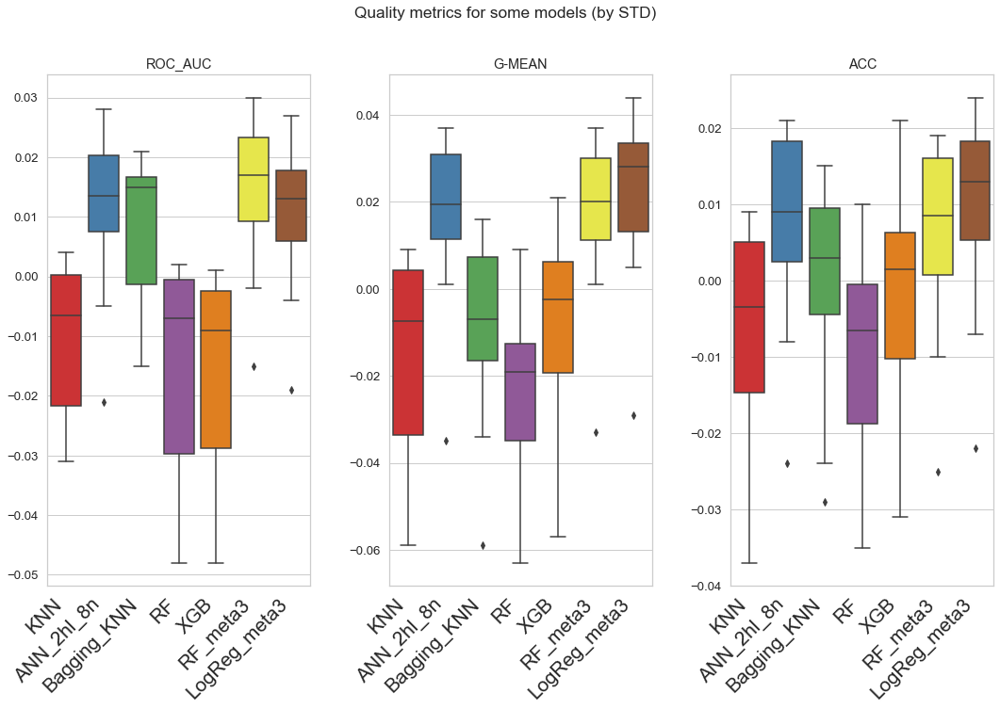

In [154]:
# optionaly add any model to list
bad_models = ['LogReg_m', 'LogReg_f', 'SVC_m', 'SVC_f', 'ANN_1hl_4n',
              'ANN_3hl_4n', 'Tree_opt', 'Bagging_opt', 'Ada_opt']

# save new data to `b`
b = models_q.query('model not in @bad_models')

# subtract means for last 5 columns and rewrite `b`: 
b.iloc[:,-5:]  = b.iloc[:,-5:] - list(b.mean().values.round(3)[-5:])

compare_models(b[b['ths'] == .5], 'some models (by STD)', save=False)